In [1]:
import os
import glob
import numpy as np
import xarray as xr

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.gridspec as gridspec
%matplotlib inline
import matplotlib
matplotlib.rcParams.update({'font.size':15})
import time
import cartopy.crs as ccrs
import cartopy
CMIP6_FOLDER = "/global/cfs/projectdirs/m3522/cmip6/"
SCRATCH="/pscratch/sd/q/qnicolas/"

import sys
p = os.path.abspath('/global/homes/q/qnicolas/')
if p not in sys.path:
    sys.path.append(p)

from tools.generalTools import *; from tools.BLtools import *; from tools.e5tools import *
from tropicalOrographicRegions.mountainUtils import tilted_rect

from scipy.stats import linregress
#xr.set_options(display_style='text') 

from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
from matplotlib.legend_handler import HandlerLine2D
import matplotlib.lines
from scipy.ndimage import gaussian_filter

%load_ext autoreload
%autoreload 2

/global/common/software/m3310/conda/xrdask.2023.11.qn/lib/python3.9/site-packages/pyproj/__init__.py:89: UserWarning: pyproj unable to set database path.
  _pyproj_global_context_initialize()


In [2]:
import dask
from dask.distributed import Client, LocalCluster

dask.config.config["distributed"]["dashboard"]["link"] = "{JUPYTERHUB_SERVICE_PREFIX}proxy/{host}:{port}/status"

client = Client(n_workers=8,threads_per_worker=1,memory_limit='10G')
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /user/qnicolas/perlmutter-login-node-base/proxy/127.0.0.1:8787/status,
Dashboard: /user/qnicolas/perlmutter-login-node-base/proxy/127.0.0.1:8787/status,Workers: 8
Total threads: 8,Total memory: 74.51 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:45565,Workers: 8
Dashboard: /user/qnicolas/perlmutter-login-node-base/proxy/127.0.0.1:8787/status,Total threads: 8
Started: Just now,Total memory: 74.51 GiB
Comm: tcp://127.0.0.1:41995,Total threads: 1
Dashboard: /user/qnicolas/perlmutter-login-node-base/proxy/127.0.0.1:36659/status,Memory: 9.31 GiB
Nanny: tcp://127.0.0.1:42871,


# Data

## Observations

In [2]:
def sel_box_months(var,box,months,lon='longitude',lat='latitude',lat_increase=False):
    window = sel_box(var,box,lon,lat,lat_increase)
    window=sel_months(window,months)
    return window


def reorder(da):
    da.coords['longitude'] = da.coords['longitude'] % 360
    da = da.sortby(da.longitude)
    return da.reindex(latitude=list(reversed(da.latitude)))
 

In [3]:
orogm = xr.open_dataset(CMIP6_FOLDER+"ERA5/e5.oper.invariant/197901/e5.oper.invariant.128_129_z.ll025sc.1979010100_1979010100.nc").Z.isel(time=0)/9.81
lsm = xr.open_dataset(CMIP6_FOLDER+"ERA5/e5.oper.invariant/197901/e5.oper.invariant.128_172_lsm.ll025sc.1979010100_1979010100.nc").LSM.isel(time=0)
box = [60,100,5,32]
months = [6,7,8]
# Ghats mask
ghats_tilted_rect = [ 75  ,   9  ,  71.5, 20   ,2]

In [4]:
aphrodite_path = "/global/cfs/projectdirs/m3310/qnicolas/APHRODITE/"
aphrodite_1 = xr.open_dataset(aphrodite_path+"APHRO_MA_025deg_V1101.1951-2007.monthly.nc")
aphrodite_2 = xr.open_dataset(aphrodite_path+"APHRO_MA_025deg_V1101_EXR1.2007-2015.monthly.nc")
aphrodite_monthly = reorder(xr.concat((aphrodite_1.precip.sel(time=(aphrodite_1['time.year']<2007)),\
                                       aphrodite_2.precip.rename({'lat':'latitude','lon':'longitude'})),\
                                      dim='time'))

In [5]:
imd_monthly = xr.open_dataset("/global/cfs/projectdirs/m3310/qnicolas/IMD/IMD_rain.monthly.1901-2022.nc").RAINFALL

In [6]:
#e5_pr_monthly = 1e3*e5_monthly_timeseries('128_228_tp',range(1979,2021))
e5_pr_monthly_1979_2020 = xr.open_zarr("/pscratch/sd/q/qnicolas/temp/e5.climatology.TP.1979-2020.zarr").TP*1e3
e5_pr_monthly_1950_1978 = 1e3*e5_monthly_timeseries('128_228_tp',range(1950,1979))
e5_pr_monthly = xr.concat((e5_pr_monthly_1950_1978,e5_pr_monthly_1979_2020),dim='time')

1.769388198852539


In [7]:
class PrecipDataset :
    def __init__(self, data, name):
        self.name=name
        self.precip=data
        self.resolution = ("%.3f"%float(data.longitude[1]-data.longitude[0])).rstrip('0')+"°"
        self.time_range = (pd.to_datetime(data.time.min().values).strftime("%Y-%m"),pd.to_datetime(data.time.max().values).strftime("%Y-%m"))
        

In [8]:
APHRODITE = PrecipDataset(aphrodite_monthly,'APHRODITE')
IMD  = PrecipDataset(imd_monthly,'IMD')
ERA5      = PrecipDataset(e5_pr_monthly,'ERA5 precip')
datasets = (APHRODITE, IMD, ERA5 )

In [9]:
%%time
for dataset in datasets:
    dataset.precip_jja_yearly = sel_box_months(dataset.precip,box = box, months=months).groupby('time.year').mean().load()
    dataset.jja_time_range = (int(dataset.precip_jja_yearly.year.min().values),int(dataset.precip_jja_yearly.year.max().values))    

CPU times: user 4.2 s, sys: 20.4 s, total: 24.6 s
Wall time: 1.41 s


In [10]:
for dataset in datasets:
    dataset.lsm = lsm.interp_like(dataset.precip_jja_yearly)>0.1
    dataset.ghats_mask = sel_box(dataset.lsm*tilted_rect(dataset.lsm,*ghats_tilted_rect),box)

In [11]:
data_info = {
    "name": [dataset.name for dataset in datasets],
    "resolution": [dataset.resolution for dataset in datasets],
    "time_range": [dataset.time_range for dataset in datasets],
    "jja_time_range": [dataset.jja_time_range for dataset in datasets],
}
pd.DataFrame(data_info)

,name,resolution,time_range,jja_time_range
0,APHRODITE,0.25°,"(1951-01, 2015-12)","(1951, 2015)"
1,IMD,0.25°,"(1901-01, 2022-12)","(1901, 2022)"
2,ERA5 precip,0.25°,"(1950-01, 2020-12)","(1950, 2020)"


## Simulations

In [3]:
from tools.wrfHrTools import Simulation,change_coords_pl

In [4]:
class SimulationCustom2(Simulation):
    def __init__(self,path,center,dx,suffix2,inp=False,out=False,pout=False,is_subset=False):
        super().__init__(path,center,dx,inp,out,pout,is_subset)
        self.suffix2 = suffix2
        self.RAINNC_MEAN = xr.open_dataarray(self.path+'wrf.RAINNC.ALLMEAN.nc')
        RAINNC_DAILY = xr.open_zarr(self.path+'wrf.RAINNC.1h.ALL_CONCAT.zarr').RAINNC_MMDY.mean('south_north').coarsen(Time=24).mean()
        self.RAINNC_DAILY = RAINNC_DAILY
        self.RAINNC_STERR = 2 * RAINNC_DAILY.std('Time').load() / np.sqrt(len(RAINNC_DAILY.Time))
        
        self.T_PL_MEAN = xr.open_dataarray(self.path+'wrf.T_PL.ALLMEAN.nc')
        self.Q_PL_MEAN = xr.open_dataarray(self.path+'wrf.Q_PL.ALLMEAN.nc')
        self.W_PL_MEAN = xr.open_dataarray(self.path+'wrf.W_PL.ALLMEAN.nc')

W10S300   = SimulationCustom2('/pscratch/sd/q/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.60lev.500m.3km/'          ,1635,3,'1970010100-1970072000',inp=True)
W12S300   = SimulationCustom2('/pscratch/sd/q/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.60lev.500m.12mps.3km/'          ,1635,3,'1970010100-1971010400',inp=True)   

In [5]:
W10S300.color='c'
W12S300.color='blue'

W10S300.label=r'$U = 10$ m$\,$s$^{-1}$'
W12S300.label=r'$U = 12$ m$\,$s$^{-1}$'

In [6]:
def upstream_mean(ds,reverse=False):
    if reverse:
        return ds.sel(distance_from_mtn=slice(-4000,-2500)).mean('distance_from_mtn')
    else:
        return ds.sel(distance_from_mtn=slice(-2500,-4000)).mean('distance_from_mtn')
def prime(ds,reverse=False):
    return ds - upstream_mean(ds,reverse)

In [7]:
from orographicConvectionTheory.orographicConvectionTheory import topographic_profile
xx,hx=topographic_profile('cos',A=500.)

In [8]:
for Sim in W10S300 , W12S300:
    Sim.PSFC_MEAN = xr.open_zarr(Sim.path + "wrf.PSFC_INTERP.1h.%s.zarr"%Sim.suffix2).PSFC[-480:].mean(('Time','south_north')).load()
    Sim.THETAE_MEAN = xr.open_dataarray(Sim.path + "wrf.THETAE.ALLMEAN.nc")
    
    Sim.U_PL_MEAN = xr.open_dataarray(Sim.path+'wrf.U_PL.ALLMEAN.nc')
    Sim.OMEGA_PL_MEAN = -Sim.T_PL_MEAN.pressure*100/(287. * Sim.T_PL_MEAN) * 9.81 * Sim.W_PL_MEAN
    udthetaedx = -(Sim.U_PL_MEAN*Sim.THETAE_MEAN.differentiate('distance_from_mtn')/1000 * 86400)
    omegadthetaedp = (Sim.OMEGA_PL_MEAN*Sim.THETAE_MEAN.differentiate('pressure')/100 * 86400)
    Qthetae = udthetaedx+omegadthetaedp
    Sim.OMEGADTHETAEDP = omegadthetaedp
    
    omegadthetaedp = (Sim.OMEGA_PL_MEAN*upstream_mean(W10S300.THETAE_MEAN).differentiate('pressure')/100 * 86400)
    Sim.OMEGADTHETAE0DP = omegadthetaedp
    
    Sim.QTHETAE = Qthetae

In [9]:
def averageB(ds,psfc,ptop=850):
    ds = ds.bfill(dim='pressure')
    p1 = 990;p2=ptop
    part1 = -ds.sel(pressure=slice(p1,p2)).integrate('pressure')
    part2 = ds.sel(pressure=p1)*(psfc-990)
    return ((part1+part2)/(psfc-ptop))
def averageL(ds,p1 = 850,p2 = 500):
    return (-ds.sel(pressure=slice(p1,p2)).integrate('pressure')/(p1-p2))

# Theory

In [28]:
from orographicConvectionTheory.orographicConvectionTheory import k_vector,m_exponent,linear_precip_theory,topographic_profile

from matplotlib.patches import Polygon

In [29]:
def linear_zeta(h,N,U,x,z):
    k=k_vector(len(x),x[1]-x[0])
    zetahat = np.fft.fft(h)[:,None]*np.exp( m_exponent(k[:,None],N,U)  *  z[None,:])
    zeta=xr.DataArray(np.real(np.fft.ifft(zetahat,axis=0)),coords={'x':x,'z':z},dims={'x':x,'z':z})
    return zeta

In [30]:
xx,hx = topographic_profile('cos',A=500)
zz = np.arange(0.,11e3,100.)
zeta_10 = linear_zeta(hx,0.01,10.,xx,zz)
zeta_11 = linear_zeta(hx,0.01,12.,xx,zz)

In [31]:
Pp_10 = linear_precip_theory(xx,hx,10,P0=50.,tauT=7.5,tauq=27.5) - 50.
Pp_12 = linear_precip_theory(xx,hx,12,P0=50.,tauT=7.5,tauq=27.5) - 50.
Pd_10 = linear_precip_theory(xx,hx,10,P0=50.,tauT=7.5,tauq=27.5,switch=1e-4) - 50.
Pd_12 = linear_precip_theory(xx,hx,12,P0=50.,tauT=7.5,tauq=27.5,switch=1e-4) - 50.

In [32]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

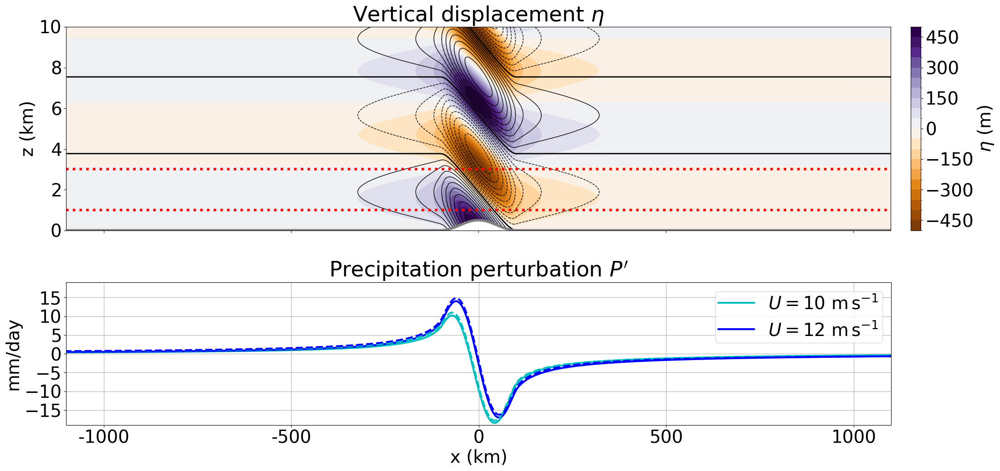

In [41]:
matplotlib.rcParams.update({'font.size': 28})
fig,(ax,ax2)=plt.subplots(2,1,figsize=(24,11),height_ratios=(1,0.7))


# Shadings & contours
levs = np.linspace(-500,500,21)
n=len(levs)

zeta_10.plot.contourf(ax=ax,y='z',levels=levs,cmap = plt.cm.PuOr,cbar_kwargs={'label':r"$\eta$ (m)","pad":0.02})
(zeta_11).plot.contour(ax=ax,y='z',levels=levs,colors=['k']*n,linestyles=['--']*(n//2)+['-']*(n//2+1),linewidths=[1]*(n//2) + [2.] + [1]*(n//2))

# fill white space
ax.fill_between(xx,0*xx,hx,color='w',zorder=2)
ax.plot(xx,hx,color='gray',linewidth=4)

ax.axhline(1000.,color='r',linestyle=':',linewidth=4)
ax.axhline(3000.,color='r',linestyle=':',linewidth=4)

ax.set_xlim(-1100e3,1100e3)
ticks = np.arange(-1000,1100,500)
ax.set_xticks(list(ticks*1e3))
ax.set_xticklabels('')
ax.set_xlabel('')

ax.set_ylim(0,10000)
ax.set_yticks(np.arange(0,11,2)*1e3)
ax.set_yticklabels(np.arange(0,11,2))
ax.set_ylabel('z (km)')

ax2.plot(xx,Pp_10,color='c',linewidth=3,label=r"$U=$10 m$\,$s$^{-1}$")
ax2.plot(xx,Pp_12,color='b',linewidth=3,label=r"$U=$12 m$\,$s$^{-1}$")
ax2.plot(xx,Pd_10,color='c',linewidth=3,linestyle='--')
ax2.plot(xx,Pd_12,color='b',linewidth=3,linestyle='--')
ax2.set_ylim(-19,19)
ax2.set_ylabel("mm/day")
ax2.set_xlim(-1100e3,1100e3)
ax2.set_xticks(list(ticks*1e3))
ax2.set_xticklabels(ticks)
ax2.set_xlabel('x (km)')

yticks=np.arange(-15,16,5)
ax2.set_yticks(yticks)
ax2.legend(loc=1,borderpad=0.2,fontsize=28)

divider2 = make_axes_locatable(ax2)
cax2 = divider2.append_axes("right", size=2.7, pad=1.,axes_class=plt.Axes)
cax2.remove()
ax2.grid()


ax.set_title(r"Vertical displacement $\eta$")
ax2.set_title(r"Precipitation perturbation $P'$")

fig.tight_layout()
#rect1 = matplotlib.patches.Rectangle((0,0), 200000, 1000, color='white',zorder=5)

#ax.add_patch(rect1)

In [146]:
Pp_10 = linear_precip_theory(xx,hx,10,P0=50.,tauT=3.,tauq=11.) - 50.
Pp_12 = linear_precip_theory(xx,hx,12,P0=50.,tauT=3.,tauq=11.) - 50.
Pd_10 = linear_precip_theory(xx,hx,10,P0=50.,tauT=3.,tauq=11.,switch=1e-4) - 50.
Pd_12 = linear_precip_theory(xx,hx,12,P0=50.,tauT=3.,tauq=11.,switch=1e-4) - 50.

In [149]:
(np.max(Pp_12)/np.max(Pp_10)-1)*100

36.769598866525314

In [142]:
(np.max(Pd_12)/np.max(Pd_10)-1)*100

35.17703651563808

# Simulations - T' and P'

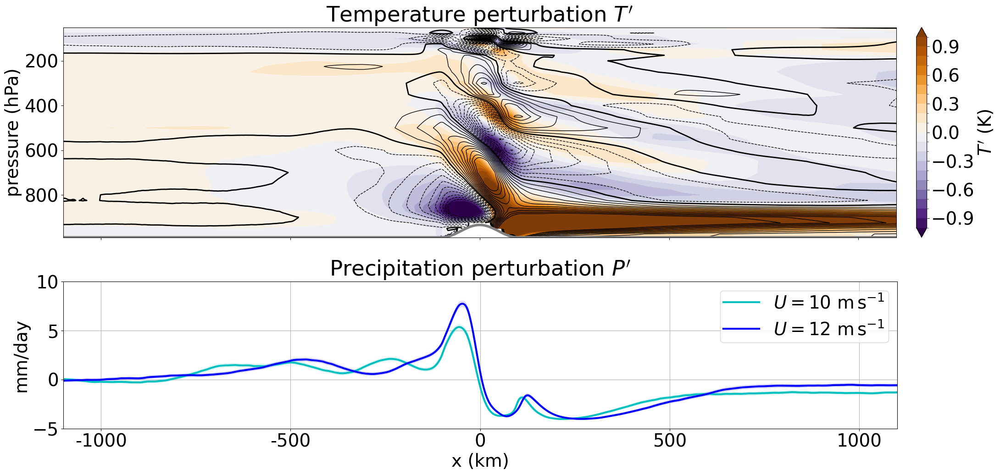

In [43]:
matplotlib.rcParams.update({'font.size': 28})
fig,(ax,ax2)=plt.subplots(2,1,figsize=(24,11),height_ratios=(1,0.7))


# Shadings & contours
levs = np.linspace(-1,1,21)
n=len(levs)

prime(W10S300.T_PL_MEAN).plot.contourf(ax=ax,y='pressure',yincrease=False,levels=levs,cmap=plt.cm.PuOr_r,extend='both',cbar_kwargs={'label':r"$T'$ (K)","pad":0.02})
prime(W12S300.T_PL_MEAN).plot.contour (ax=ax,y='pressure',yincrease=False,levels=levs,colors='k',linestyles=['--']*(n//2)+['-']*(n//2+1),linewidths=[1]*(n//2) + [2.] + [1]*(n//2))
#zeta_10.plot.contourf(ax=ax,y='z',levels=levs,cmap = plt.cm.PuOr_r,cbar_kwargs={'label':r"$\eta$ (m)","pad":0.02})
#(zeta_11).plot.contour(ax=ax,y='z',levels=levs,colors=['k']*n,linestyles=['--']*(n//2)+['-']*(n//2+1),linewidths=[1]*(n//2) + [2.] + [1]*(n//2))

# fill white space
ax.fill_between(xx/1e3,990*xx**0,990 - hx/9,color='w',zorder=2)
ax.plot(xx/1e3,990 - hx/9,color='gray',linewidth=4)

ax.set_xlim(-1100,1100)
ticks = np.arange(-1000,1100,500)
ax.set_xticks(list(ticks))
ax.set_xticklabels('')
ax.set_xlabel('')

ax.set_ylabel('pressure (hPa)')




for Sim in (W10S300,W12S300):
    prime(Sim.RAINNC_MEAN).plot(ax=ax2,color=Sim.color,label=Sim.label,linewidth=3)
    ax2.fill_between(Sim.RAINNC_MEAN.distance_from_mtn,prime(Sim.RAINNC_MEAN)-Sim.RAINNC_STERR,prime(Sim.RAINNC_MEAN)+Sim.RAINNC_STERR,alpha=0.1,color=Sim.color)

ax2.set_ylim(-5,10)
ax2.set_ylabel("mm/day")
ax2.set_xlim(-1100,1100)
ax2.set_xticks(list(ticks))
ax2.set_xticklabels(ticks)
ax2.set_xlabel('x (km)')

#yticks=np.arange(-40,41,20)
#ax2.set_yticks(yticks)
ax2.legend(loc=1,borderpad=0.2,fontsize=28)

divider2 = make_axes_locatable(ax2)
cax2 = divider2.append_axes("right", size=2.7, pad=1.,axes_class=plt.Axes)
cax2.remove()
ax2.grid()

ax.set_title(r"Temperature perturbation $T'$")
ax2.set_title(r"Precipitation perturbation $P'$")

fig.tight_layout()
#rect1 = matplotlib.patches.Rectangle((0,0), 200000, 1000, color='white',zorder=5)

#ax.add_patch(rect1)

In [90]:
(prime(W12S300.RAINNC_MEAN).max() / prime(W10S300.RAINNC_MEAN).max() - 1).data*100/2

22.135378364363245

In [190]:
idx10 = prime(W10S300.RAINNC_MEAN).argmax().data
idx12 = prime(W12S300.RAINNC_MEAN).argmax().data
ts1 = (W10S300.RAINNC_DAILY.isel(distance_from_mtn = idx10) - upstream_mean(W10S300.RAINNC_MEAN)).load().data
ts2 = (W12S300.RAINNC_DAILY.isel(distance_from_mtn = idx12) - upstream_mean(W12S300.RAINNC_MEAN)).load().data

In [ ]:
def generate_sample(raints,blocksize = 1,nbootstrap = 10000):
    Nt = len(raints)
    nsamples_per_bootstrap = Nt//blocksize
    nsamples = nbootstrap*nsamples_per_bootstrap
    
    idxs = np.random.choice(Nt-blocksize,nsamples,replace=True)
    idx_blocks = np.broadcast_to(idxs,(blocksize,nsamples)).T + np.arange(blocksize)
    bootstrap_samples = raints[idx_blocks].reshape(nbootstrap,nsamples_per_bootstrap*blocksize)
    return bootstrap_samples

In [191]:
blocksize=20
bootstrap_estimates = generate_sample(ts2,blocksize,nbootstrap=50000).mean(axis=1)/generate_sample(ts1,blocksize,nbootstrap=50000).mean(axis=1)
(np.quantile(bootstrap_estimates,[0.025,0.975])-1)/2*100

array([17.87455335, 26.92369118])

In [192]:
blocksize=120
bootstrap_estimates2 = generate_sample(ts2,blocksize,nbootstrap=50000).mean(axis=1)/generate_sample(ts1,blocksize,nbootstrap=50000).mean(axis=1)
(np.quantile(bootstrap_estimates2,[0.025,0.975])-1)/2*100

array([16.87097281, 30.31454086])

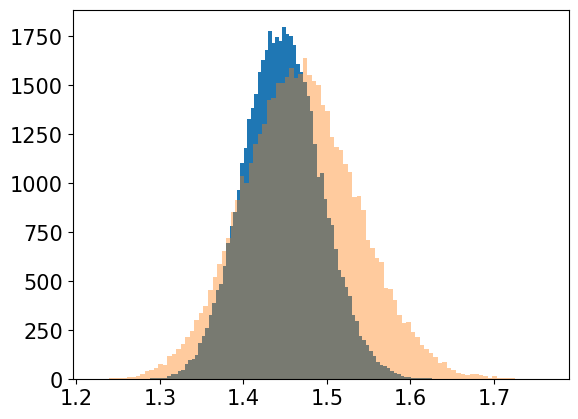

In [176]:
plt.hist(bootstrap_estimates,bins=100);
plt.hist(bootstrap_estimates2,bins=100,alpha=0.4);

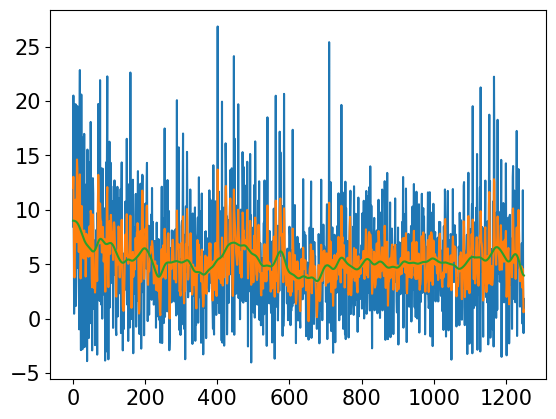

In [194]:
from scipy.ndimage import gaussian_filter
plt.plot(ts1)
plt.plot(gaussian_filter(ts1,1))
plt.plot(gaussian_filter(ts1,10))

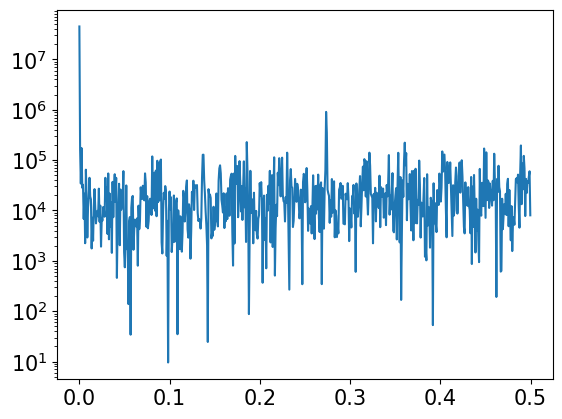

In [208]:
plt.plot(np.fft.rfftfreq(len(ts1),1),np.abs(np.fft.rfft(                ts1    ))**2)
#plt.plot(np.fft.rfftfreq(len(ts1),1),np.abs(np.fft.rfft(gaussian_filter(ts1,10)))**2)
plt.yscale('log')

## P' uncertainty estimates

In [151]:
blocksizes = [1,2,4,6,8,12,16,24,32]

In [126]:
raints = np.array(W10S300.RAINNC_DAILY.sel(distance_from_mtn = -2001))
bootstraps = np.array([generate_sample(raints,b).mean(axis=1) for b in blocksizes])

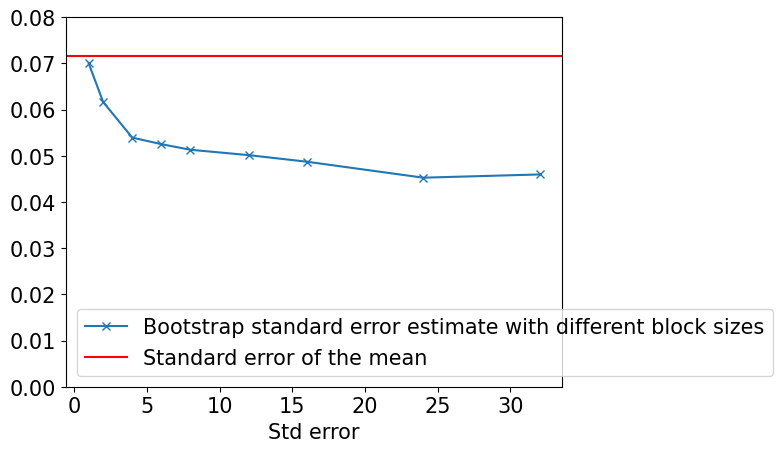

In [127]:
matplotlib.rcParams.update({'font.size': 15})
plt.plot(blocksizes,bootstraps.std(axis=1),'-x',label = 'Bootstrap standard error estimate with different block sizes')
plt.axhline(np.std(raints)/np.sqrt(Nt),label="Standard error of the mean",color='r')
plt.ylim(0.,0.08)
plt.xlabel('block size')
plt.xlabel('Std error')
plt.legend()

In [177]:
blocksizes = [1,2,4,6,8,12,16,24,32,64,100,128,150,180,220,256,512]

In [178]:
raints = np.array(W10S300.RAINNC_DAILY.sel(distance_from_mtn = -42))
bootstraps = np.array([generate_sample(raints,b).mean(axis=1) for b in blocksizes])

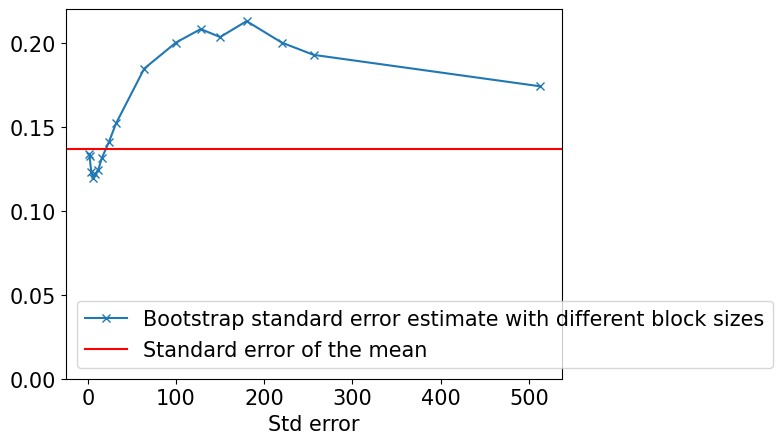

In [179]:
matplotlib.rcParams.update({'font.size': 15})
plt.plot(blocksizes,bootstraps.std(axis=1),'-x',label = 'Bootstrap standard error estimate with different block sizes')
plt.axhline(np.std(raints)/np.sqrt(Nt),label="Standard error of the mean",color='r')
plt.xlabel('block size')
plt.xlabel('Std error')
plt.ylim(0,0.22)
plt.legend()

In [180]:
raints = np.array(W10S300.RAINNC_DAILY.sel(distance_from_mtn = -60))
bootstraps = np.array([generate_sample(raints,b).mean(axis=1) for b in blocksizes])

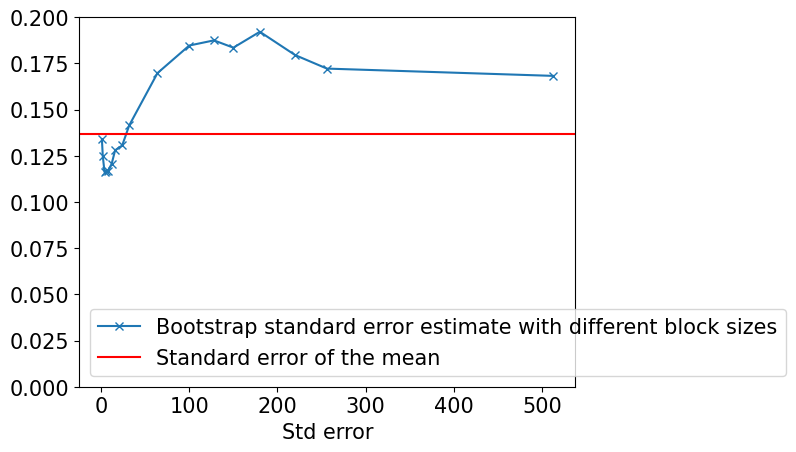

In [181]:
matplotlib.rcParams.update({'font.size': 15})
plt.plot(blocksizes,bootstraps.std(axis=1),'-x',label = 'Bootstrap standard error estimate with different block sizes')
plt.axhline(np.std(raints)/np.sqrt(Nt),label="Standard error of the mean",color='r')
plt.ylim(0,0.2)
plt.xlabel('block size')
plt.xlabel('Std error')
plt.legend()

# Simulations - B_L stuff

In [10]:
def smooth(ds):
    return xr.apply_ufunc(gaussian_filter,ds,kwargs={"sigma":2.})

class SymHandler(HandlerLine2D):
    def create_artists(self, legend, orig_handle,xdescent, ydescent, width, height, fontsize, trans):
        xx= 0.6*height
        return super(SymHandler, self).create_artists(legend, orig_handle,xdescent, xx, width, height, fontsize, trans)

In [11]:
from scipy.signal import hilbert
from scipy.integrate import cumtrapz
import scipy.linalg as spl
from orographicPrecipitation.observationsAndERA5.linearWaveModels import z_to_p_standard

def nonlinear_mountain_wave(x,h,z,U,N):
    z2=np.array(z).transpose()[::-1]
    f_L = -np.imag(hilbert(h))
    l=N/U
    H = h+1.j*f_L
    niter=20
    for i in range(niter):
        H = -1j*np.exp(-1j*l*h)*(np.imag(hilbert(np.real(H*np.exp(1j*l*h))))+1j*np.imag(hilbert(np.imag(H*np.exp(1j*l*h)))))
    f=np.imag(H)
    delta = h[:,None]*np.cos(l*(z[None,:]-h[:,None]))+f[:,None]*np.sin(l*(z[None,:]-h[:,None]))
    w=U*np.gradient(delta,x,axis=0)
    # displacement: xr.DataArray(z[None,:]-delta,coords={'x':x,'z':z},dims={'x':x,'z':z})
    return xr.DataArray(w,coords={'distance_from_mtn':x/1000,'altitude':z/1000},dims=['distance_from_mtn','altitude'])

z=np.linspace(0,20e3,200)
xx ,hx = topographic_profile('cos',A=500)
xx = xx[1000:3001]
hx = hx[1000:3001]

w_nonlinear_10=nonlinear_mountain_wave(xx,hx,z,10.,1e-2)
w_nonlinear_12=nonlinear_mountain_wave(xx,hx,z,12.,1e-2)
p = z_to_p_standard(w_nonlinear_10.altitude*1000)
w_nonlinear_10 = w_nonlinear_10.assign_coords({'pressure':p}).swap_dims({'altitude':'pressure'})
w_nonlinear_12 = w_nonlinear_12.assign_coords({'pressure':p}).swap_dims({'altitude':'pressure'})

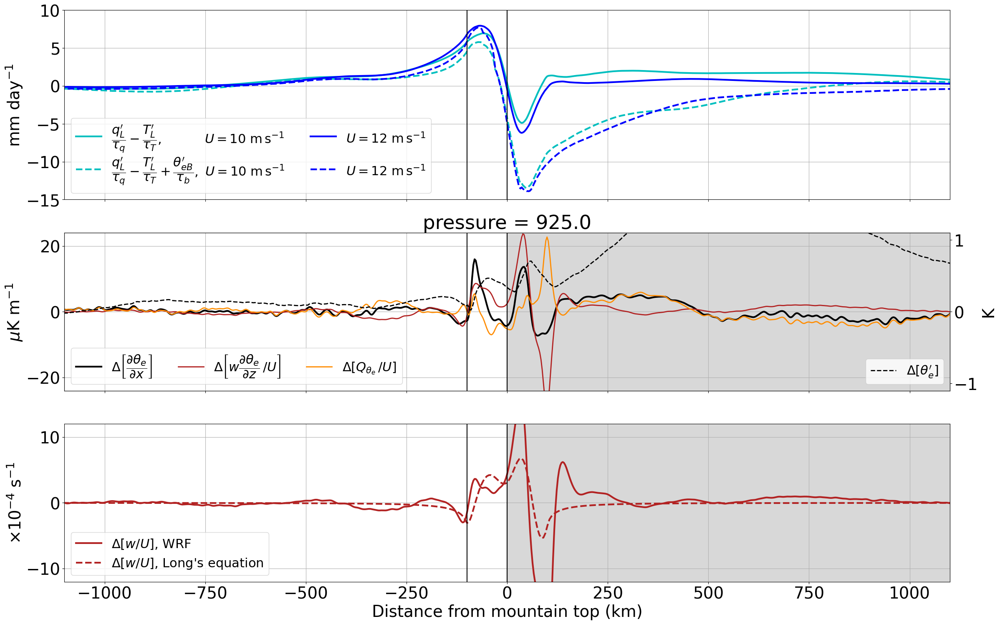

In [20]:
matplotlib.rcParams.update({'font.size': 28})
fig,axs=plt.subplots(3,1,figsize=(24,15),height_ratios = [1.2,1.,1.])

legend_ftz=22
############################
######## FIRST PLOT ########
############################
ax = axs[0]
for i,Sim in enumerate((W10S300, W12S300)):
    TL = averageL(Sim.T_PL_MEAN,900,600)
    qL = averageL(Sim.Q_PL_MEAN,900,600)
    qL = qL * 2.5e6/1004.
    
    eB = averageB(Sim.THETAE_MEAN,Sim.PSFC_MEAN/100,900)
    
    conversion = 1004./2.5e6 * 8000 * 86400
    if i==0:
        lbl1 = r"$\dfrac{q_L'}{\tau_q}-\dfrac{T_L'}{\tau_T},$          " + Sim.label
        lbl2 = r"$\dfrac{q_L'}{\tau_q}-\dfrac{T_L'}{\tau_T}+\dfrac{\theta_{eB}'}{\tau_b},$ " + Sim.label
    else:
        lbl1 = Sim.label
        lbl2 = Sim.label
    (conversion * (- prime(TL) / 7.5 + prime(qL)/27.5               )   / 3600).plot(ax=ax,linestyle='-' ,color = Sim.color,linewidth=3, label=lbl1)#Sim.color3
    (conversion * (- prime(TL) / 7.5 + prime(qL)/27.5 + prime(eB)/27.5) / 3600).plot(ax=ax,linestyle='--',color = Sim.color,linewidth=3, label=lbl2)#Sim.color2
    

ax.set_ylim(-15,10)
ax.set_yticks(range(-15,11,5));
ax.legend(handler_map={matplotlib.lines.Line2D: SymHandler()}, 
          fontsize=legend_ftz, ncol=2,handleheight=3.5, labelspacing=0.05,loc=3,borderpad=0.4)

ax.set_ylabel(r'mm day$^{-1}$')

############################
####### SECOND PLOT ########
############################
ax=axs[1]
Delta0 = 1e6*(W12S300.THETAE_MEAN.sel(pressure=925).differentiate('distance_from_mtn')/1e3 
         -W10S300.THETAE_MEAN.sel(pressure=925).differentiate('distance_from_mtn')/1e3
         )
smooth(Delta0).plot(ax=ax,label = r"$\Delta \left[\dfrac{\partial \theta_e}{\partial x}\right]$",color='k',linewidth=3)

Delta1 = 1e6*((- W12S300.OMEGADTHETAEDP/86400)/12-(- W10S300.OMEGADTHETAEDP/86400)/10).sel(pressure=925)
smooth(Delta1).plot(ax=ax,color='firebrick',linewidth=2,label = r"$\Delta \left[w\dfrac{\partial \theta_e}{\partial z} \,/ U\right]$")

Delta2 = 1e6*((W12S300.QTHETAE/86400)/12-(W10S300.QTHETAE/86400)/10).sel(pressure=925)
smooth(Delta2).plot(ax=ax,color='darkorange',linewidth=2,label = r"$\Delta[ Q_{\theta_e} \,/ U]$ ")

ax.legend(fontsize=legend_ftz,loc=3,ncol=3)
ax.set_ylabel(r"$\mu$K m$^{-1}$")
ax.set_ylim(-24,24)
ax.fill_between([0,1100],[-24,-24],[24,24.],color='gray',alpha=0.3)

ax2 = ax.twinx()
(prime(W12S300.THETAE_MEAN.sel(pressure=925))-prime(W10S300.THETAE_MEAN.sel(pressure=925))).plot(ax=ax2,label = r"$\Delta[ \theta_e']$",color='k',linewidth=2,linestyle='--')
ax2.legend(fontsize=legend_ftz,loc=4)
ax2.set_ylabel(r"K")
ax2.set_ylim(-1.1,1.1)


############################
######## THIRD PLOT ########
############################
ax=axs[2]

smooth((1e4*(W12S300.W_PL_MEAN/12 - W10S300.W_PL_MEAN/10)).sel(pressure=925))    .plot(ax=ax,color='firebrick',linewidth=3,label=r"$\Delta[w/U]$, WRF")
(1e4*(w_nonlinear_12/12 - w_nonlinear_10/10)).sel(pressure=925.,method='nearest').plot(ax=ax,color='firebrick',linestyle='--',linewidth=3,label=r"$\Delta[w/U]$, Long's equation")

ax.legend(fontsize=legend_ftz,loc=3)
ax.fill_between([0,1100],[-20.,-20.],[20.,20.],color='gray',alpha=0.3)

ax.set_ylim(-12,12)
ax.set_ylabel(r"$\times 10^{-4}$ s$^{-1}$")

############################
###### FINAL TOUCHES #######
############################
for ax in axs:
    ax.set_title('')
    ax.set_xlim(-1100,1100)
    ax.grid()
    ax.axvline(-100.,color='k')
    ax.axvline(0.,color='k')
for ax in axs[:2]:
    ax.set_xlabel('')
    ax.set_xticklabels('')
axs[2].set_xlabel('Distance from mountain top (km)')
fig.tight_layout(pad=0.3)

In [34]:
for Sim in W10S300 , W12S300:
    omegadthetaedp = (Sim.OMEGA_PL_MEAN*upstream_mean(W10S300.THETAE_MEAN).differentiate('pressure')/100 * 86400)
    Sim.OMEGADTHETAE0DP = omegadthetaedp

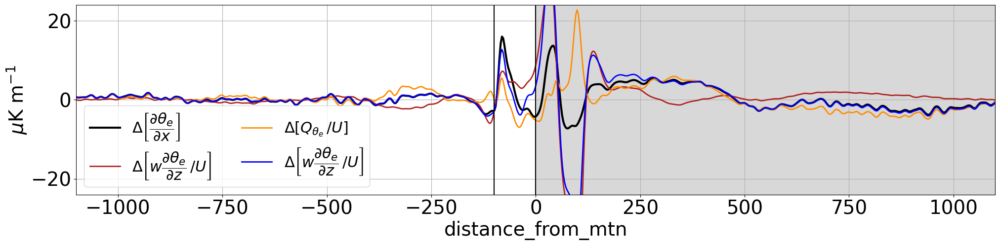

In [35]:
matplotlib.rcParams.update({'font.size': 28})
fig,ax=plt.subplots(1,1,figsize=(24,5))

legend_ftz=22

Delta0 = 1e6*(W12S300.THETAE_MEAN.sel(pressure=925).differentiate('distance_from_mtn')/1e3 
         -W10S300.THETAE_MEAN.sel(pressure=925).differentiate('distance_from_mtn')/1e3
         )
smooth(Delta0).plot(ax=ax,label = r"$\Delta \left[\dfrac{\partial \theta_e}{\partial x}\right]$",color='k',linewidth=3)

Delta1 = 1e6*((- W12S300.OMEGADTHETAE0DP/86400)/12-(- W10S300.OMEGADTHETAE0DP/86400)/10).sel(pressure=925)
smooth(Delta1).plot(ax=ax,color='firebrick',linewidth=2,label = r"$\Delta \left[w\dfrac{\partial \theta_e}{\partial z} \,/ U\right]$")

Delta2 = 1e6*((W12S300.QTHETAE/86400)/12-(W10S300.QTHETAE/86400)/10).sel(pressure=925)
smooth(Delta2).plot(ax=ax,color='darkorange',linewidth=2,label = r"$\Delta[ Q_{\theta_e} \,/ U]$ ")


smooth(Delta1+Delta2).plot(ax=ax,color='b',linewidth=2,label = r"$\Delta \left[w\dfrac{\partial \theta_e}{\partial z} \,/ U\right]$")

ax.legend(fontsize=legend_ftz,loc=3,ncol=2)
ax.set_ylabel(r"$\mu$K m$^{-1}$")
ax.set_ylim(-24,24)
ax.fill_between([0,1100],[-24,-24],[24,24.],color='gray',alpha=0.3)

ax.set_title('')
ax.set_xlim(-1100,1100)
ax.grid()
ax.axvline(-100.,color='k')
ax.axvline(0.,color='k')


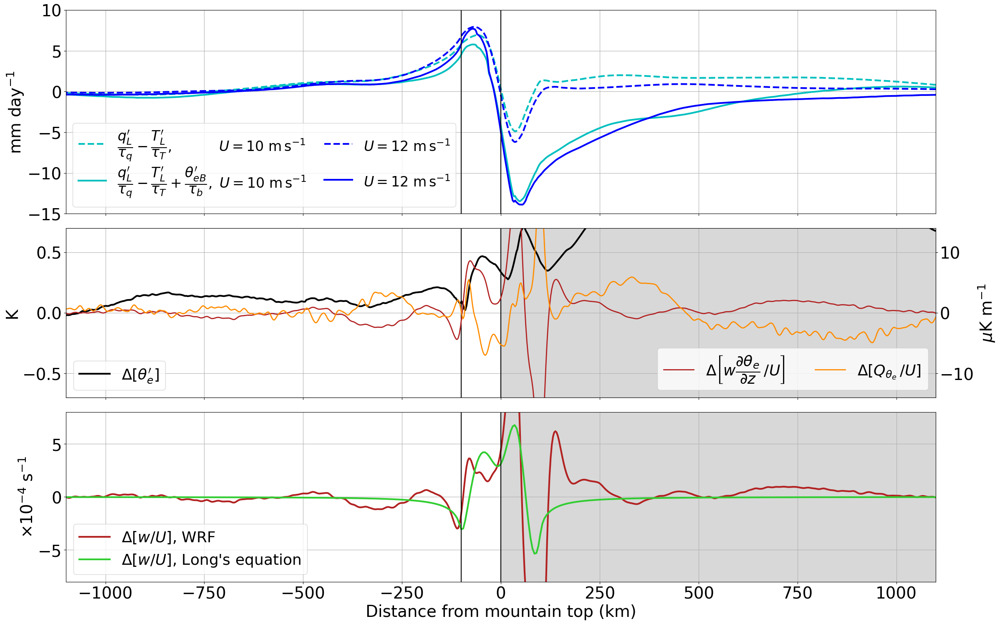

In [37]:
matplotlib.rcParams.update({'font.size': 28})
fig,axs=plt.subplots(3,1,figsize=(24,15),height_ratios = [1.2,1.,1.])

legend_ftz=24
############################
######## FIRST PLOT ########
############################
ax = axs[0]
for i,Sim in enumerate((W10S300, W12S300)):
    TL = averageL(Sim.T_PL_MEAN,900,600)
    qL = averageL(Sim.Q_PL_MEAN,900,600)
    qL = qL * 2.5e6/1004.
    
    eB = averageB(Sim.THETAE_MEAN,Sim.PSFC_MEAN/100,900)
    
    conversion = 1004./2.5e6 * 8000 * 86400
    if i==0:
        lbl1 = r"$\dfrac{q_L'}{\tau_q}-\dfrac{T_L'}{\tau_T},$          " + Sim.label
        lbl2 = r"$\dfrac{q_L'}{\tau_q}-\dfrac{T_L'}{\tau_T}+\dfrac{\theta_{eB}'}{\tau_b},$ " + Sim.label
    else:
        lbl1 = Sim.label
        lbl2 = Sim.label
    (conversion * (- prime(TL) / 7.5 + prime(qL)/27.5               )   / 3600).plot(ax=ax,linestyle='--' ,color = Sim.color,linewidth=3, label=lbl1)#Sim.color3
    (conversion * (- prime(TL) / 7.5 + prime(qL)/27.5 + prime(eB)/27.5) / 3600).plot(ax=ax,linestyle='-',color = Sim.color,linewidth=3, label=lbl2)#Sim.color2
    

ax.set_ylim(-15,10)
ax.set_yticks(range(-15,11,5));
ax.legend(handler_map={matplotlib.lines.Line2D: SymHandler()}, 
          fontsize=legend_ftz, ncol=2,handleheight=3.5, labelspacing=0.05,loc=3,borderpad=0.4,columnspacing=1.3)

ax.set_ylabel(r'mm day$^{-1}$')

############################
####### SECOND PLOT ########
############################
ax=axs[1]
ax2 = ax.twinx()
(prime(W12S300.THETAE_MEAN.sel(pressure=925))-prime(W10S300.THETAE_MEAN.sel(pressure=925))).plot(ax=ax,label = r"$\Delta[ \theta_e']$",color='k',linewidth=3)

Delta1 = 1e6*((- W12S300.OMEGADTHETAEDP/86400)/12-(- W10S300.OMEGADTHETAEDP/86400)/10).sel(pressure=925)
smooth(Delta1).plot(ax=ax2,color='firebrick',linewidth=2,label = r"$\Delta \left[w\dfrac{\partial \theta_e}{\partial z} \,/ U\right]$")

Delta2 = 1e6*((W12S300.QTHETAE/86400)/12-(W10S300.QTHETAE/86400)/10).sel(pressure=925)
smooth(Delta2).plot(ax=ax2,color='darkorange',linewidth=2,label = r"$\Delta[ Q_{\theta_e} \,/ U]$ ")

ax.legend(fontsize=legend_ftz+2,loc=3,ncol=2)
ax.set_ylabel(r"K")
ax.set_ylim(-0.7,0.7)
ax.fill_between([0,1100],[-24,-24],[24,24.],color='gray',alpha=0.3)


ax2.legend(fontsize=legend_ftz+2,loc=4,ncol=2)
ax2.set_ylabel(r"$\mu$K m$^{-1}$")
ax2.set_ylim(-14,14)
ax2.set_title('')

############################
######## THIRD PLOT ########
############################
ax=axs[2]

smooth((1e4*(W12S300.W_PL_MEAN/12 - W10S300.W_PL_MEAN/10)).sel(pressure=925))    .plot(ax=ax,color='firebrick',linewidth=3,label=r"$\Delta[w/U]$, WRF")
(1e4*(w_nonlinear_12/12 - w_nonlinear_10/10)).sel(pressure=925.,method='nearest').plot(ax=ax,color='limegreen',linewidth=3,label=r"$\Delta[w/U]$, Long's equation")

ax.legend(fontsize=legend_ftz+2,loc=3)
ax.fill_between([0,1100],[-20.,-20.],[20.,20.],color='gray',alpha=0.3)

ax.set_ylim(-8,8)
ax.set_ylabel(r"$\times 10^{-4}$ s$^{-1}$")

############################
###### FINAL TOUCHES #######
############################
for ax in axs:
    ax.set_title('')
    ax.set_xlim(-1100,1100)
    ax.grid()
    ax.axvline(-100.,color='k')
    ax.axvline(0.,color='k')
for ax in axs[:2]:
    ax.set_xlabel('')
    ax.set_xticklabels('')
axs[2].set_xlabel('Distance from mountain top (km)')
fig.tight_layout(pad=0.3)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


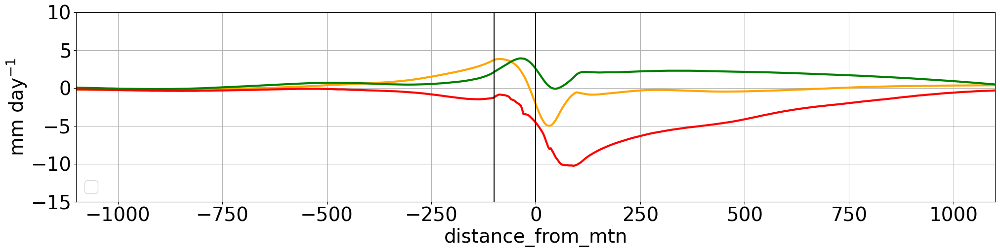

In [16]:
matplotlib.rcParams.update({'font.size': 28})
fig,ax=plt.subplots(1,1,figsize=(24,5))

for i,Sim in enumerate((W10S300, )):
    TL = averageL(Sim.T_PL_MEAN,900,600)
    qL = averageL(Sim.Q_PL_MEAN,900,600)
    qL = qL * 2.5e6/1004.
    
    eB = averageB(Sim.THETAE_MEAN,Sim.PSFC_MEAN/100,900)
    
    (conversion * (- prime(TL)/7.5 )   / 3600).plot(ax=ax,color = 'orange',linewidth=3)#Sim.color3
    (conversion * (  prime(qL)/27.5)   / 3600).plot(ax=ax,color = 'g',linewidth=3)#Sim.color3
    (conversion * (  prime(eB)/27.5)   / 3600).plot(ax=ax,color = 'r',linewidth=3)#Sim.color3
    

ax.set_ylim(-15,10)
ax.set_yticks(range(-15,11,5));
ax.legend(handler_map={matplotlib.lines.Line2D: SymHandler()}, 
          fontsize=legend_ftz, ncol=2,handleheight=3.5, labelspacing=0.05,loc=3,borderpad=0.4,columnspacing=1.3)

ax.set_ylabel(r'mm day$^{-1}$')
ax.set_title('')
ax.set_xlim(-1100,1100)
ax.grid()
ax.axvline(-100.,color='k')
ax.axvline(0.,color='k')

In [17]:
measures = [[],[],[]]
for Sim in W10S300 , W12S300:
    TL = averageL(Sim.T_PL_MEAN,900,600)
    qL = averageL(Sim.Q_PL_MEAN,900,600)
    qL = qL * 2.5e6/1004.
    
    #eB = averageB(Sim.T_PL_MEAN,Sim.PSFC_MEAN/100,900) + 2.5e3 * averageB(Sim.Q_PL_MEAN,Sim.PSFC_MEAN/100,900)
    eB = averageB(Sim.THETAE_MEAN,Sim.PSFC_MEAN/100,900)
    
    measures[0].append(prime(Sim.RAINNC_MEAN))
    measures[1].append(- prime(TL) / 7.5 + prime(qL)/27.5 + prime(eB)/27.5)
    measures[2].append(- prime(TL) / 7.5 + prime(qL)/27.5 )

for i in range(len(measures)):
    change = (measures[i][1].max()/measures[i][0].max() - 1) *100/2
    print( "%.2f %%/(m/s)"%(change) )
    

22.14 %/(m/s)
16.67 %/(m/s)
7.16 %/(m/s)


## Aside: changes with warming

In [14]:
W10S296   = SimulationCustom2('/pscratch/sd/q/qnicolas/wrfdata/saved/channel.wrf.100x2.mountain.60lev.500m.296K.3km/',1635,3,'1970010100-1970090900',inp=True)

In [20]:
W10S296.color='paleturquoise'
W10S296.color2='wheat'
W10S296.color3='greenyellow'

W10S300.label=r'SST = 300K'
W10S296.label=r'SST = 296K'

In [16]:
Sim = W10S296
Sim.PSFC_MEAN = xr.open_zarr(Sim.path + "wrf.PSFC_INTERP.1h.%s.zarr"%Sim.suffix2).PSFC[-480:].mean(('Time','south_north')).load()
Sim.THETAE_MEAN = xr.open_dataarray(Sim.path + "wrf.THETAE.ALLMEAN.nc")

(-1100.0, 1100.0)

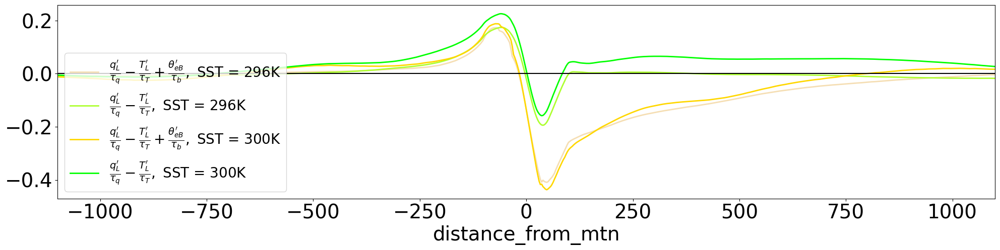

In [27]:
matplotlib.rcParams.update({'font.size': 28})
fig,ax=plt.subplots(1,1,figsize=(24,5))


for Sim in W10S296 , W10S300:
    TL = averageL(Sim.T_PL_MEAN,900,600)
    qL = averageL(Sim.Q_PL_MEAN,900,600)
    qL = qL * 2.5e3
    
    #eB = averageB(Sim.T_PL_MEAN,Sim.PSFC_MEAN/100,900) + 2.5e3 * averageB(Sim.Q_PL_MEAN,Sim.PSFC_MEAN/100,900)
    eB = averageB(Sim.THETAE_MEAN,Sim.PSFC_MEAN/100,900)
    
    (- prime(TL) / 3 + prime(qL)/11 + prime(eB)/11).plot(ax=ax,color = Sim.color2,linewidth=2, label=r"$\frac{q_L'}{\tau_q}-\frac{T_L'}{\tau_T}+\frac{\theta_{eB}'}{\tau_b},$ " + Sim.label)
    (- prime(TL) / 3 + prime(qL)/11               ).plot(ax=ax,color = Sim.color3,linewidth=2, label=r"$\frac{q_L'}{\tau_q}-\frac{T_L'}{\tau_T},$ " + Sim.label)
ax.axhline(0.,color='k')
ax.legend(fontsize=20,loc=3)
ax.set_xlim(-1100,1100)

Text(0.5, 1.0, "Precipitation perturbation $P'$")

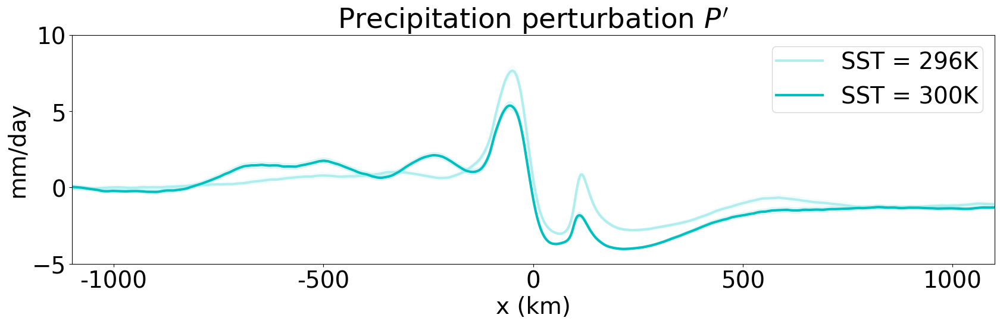

In [22]:
matplotlib.rcParams.update({'font.size': 28})
fig,ax2=plt.subplots(1,1,figsize=(20,5))


ticks = np.arange(-1000,1100,500)

for Sim in (W10S296,W10S300):
    prime(Sim.RAINNC_MEAN).plot(ax=ax2,color=Sim.color,label=Sim.label,linewidth=3)
    ax2.fill_between(Sim.RAINNC_MEAN.distance_from_mtn,prime(Sim.RAINNC_MEAN)-Sim.RAINNC_STERR,prime(Sim.RAINNC_MEAN)+Sim.RAINNC_STERR,alpha=0.1,color=Sim.color)

ax2.set_ylim(-5,10)
ax2.set_ylabel("mm/day")
ax2.set_xlim(-1100,1100)
ax2.set_xticks(list(ticks))
ax2.set_xticklabels(ticks)
ax2.set_xlabel('x (km)')

#yticks=np.arange(-40,41,20)
#ax2.set_yticks(yticks)
ax2.legend(loc=1,borderpad=0.2,fontsize=28)

ax2.set_title(r"Precipitation perturbation $P'$")



# Observations

In [12]:
topo_hires = xr.open_dataset("/pscratch/sd/q/qnicolas/ETOPO1_Ice_g_gmt4.grd").z.rename({'x':'longitude','y':'latitude'})
topo_hires = topo_hires.reindex(latitude=list(reversed(topo_hires.latitude)))
topo_hires.coords['longitude'] = topo_hires.coords['longitude'] % 360
topo_hires = topo_hires.sortby(topo_hires.longitude)


In [13]:
%%time
e5_100u_1979_2020 = e5_monthly_timeseries('228_246_100u',range(1979,2021))
e5_100v_1979_2020 = e5_monthly_timeseries('228_247_100v',range(1979,2021))
e5_100u_1950_1978 = e5_monthly_timeseries('228_246_100u',range(1950,1979))
e5_100v_1950_1978 = e5_monthly_timeseries('228_247_100v',range(1950,1979))

e5_100u_monthly = xr.concat((e5_100u_1950_1978,e5_100u_1979_2020),dim='time')
e5_100v_monthly = xr.concat((e5_100v_1950_1978,e5_100v_1979_2020),dim='time')
e5_100u_jja_yearly = sel_box_months(e5_100u_monthly,box = box, months=months).groupby('time.year').mean().load()
e5_100v_jja_yearly = sel_box_months(e5_100v_monthly,box = box, months=months).groupby('time.year').mean().load()

e5_crossslopeu_jja_yearly = crossslopeflow(e5_100u_jja_yearly,e5_100v_jja_yearly,70)

windmask = tilted_rect(e5_crossslopeu_jja_yearly,*ghats_tilted_rect,reverse=True)


HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 1:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object not 

10.60043215751648


HDF5-DIAG: Error detected in HDF5 (1.12.2) thread 38:
  #000: H5A.c line 528 in H5Aopen_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #001: H5VLcallback.c line 1091 in H5VL_attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #002: H5VLcallback.c line 1058 in H5VL__attr_open(): attribute open failed
    major: Virtual Object Layer
    minor: Can't open object
  #003: H5VLnative_attr.c line 130 in H5VL__native_attr_open(): can't open attribute
    major: Attribute
    minor: Can't open object
  #004: H5Aint.c line 545 in H5A__open_by_name(): unable to load attribute info from object header
    major: Attribute
    minor: Unable to initialize object
  #005: H5Oattribute.c line 476 in H5O__attr_open_by_name(): can't open attribute
    major: Attribute
    minor: Can't open object
  #006: H5Adense.c line 394 in H5A__dense_open(): can't locate attribute in name index
    major: Attribute
    minor: Object not

11.505030393600464
1.690810203552246
1.4332897663116455
CPU times: user 39.9 s, sys: 59.4 s, total: 1min 39s
Wall time: 31.2 s


In [14]:
def smooth(ds):
    return xr.apply_ufunc(gaussian_filter,ds,kwargs={"sigma":2.})

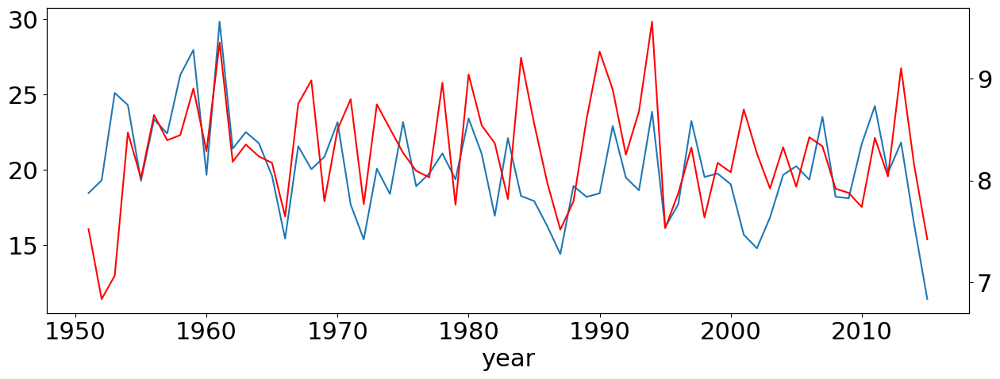

In [105]:
wind_ts = spatial_mean(e5_crossslopeu_jja_yearly,mask = windmask).sel(year=slice(1951,2015))
precip = APHRODITE.precip_jja_yearly.sel(year=slice(1951,2015),longitude=slice(60,110))
precipmask = tilted_rect(precip,*ghats_tilted_rect,reverse=False)
precip_ts = spatial_mean(precip,mask = precipmask)

_,ax=plt.subplots(1,1,figsize = (15,5))
precip_ts.plot(ax=ax)
ax2=ax.twinx()
wind_ts.plot(ax=ax2,color='r')

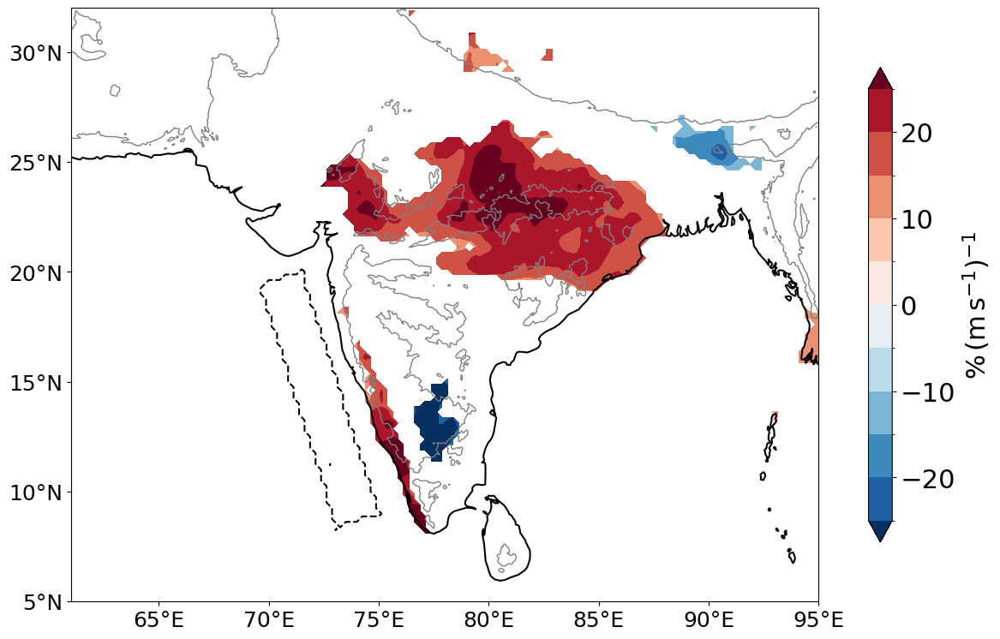

In [114]:
matplotlib.rcParams.update({'font.size': 22})
fig,ax=plt.subplots(1,1,figsize=(15,9),subplot_kw={'projection':ccrs.PlateCarree()})

dataset = APHRODITE
wind_ts = spatial_mean(e5_crossslopeu_jja_yearly,mask = windmask).sel(year=slice(1960,2015))
precip = dataset.precip_jja_yearly.sel(year=slice(1960,2015),longitude=slice(60,110))
precip_reg = linregress_xr(wind_ts,precip,dim='year')
fdrfact = fdr_xr_2d(precip_reg.pvalue,0.1)

(100*precip_reg.slope /fdrfact/precip.mean('year')).plot.contourf(ax=ax,
                                                                  transform=ccrs.PlateCarree(),
                                                                  levels=np.linspace(-25,25,11),
                                                                  extend='both',
                                                                  cbar_kwargs={'shrink':0.8,'label':r"%$\,\left(\text{m}\,\text{s}^{-1}\right)^{-1}$"})

smooth(topo_hires.sel(longitude=slice(60,100),latitude=slice(40,5))).plot.contour(ax=ax,levels=[500.],colors='grey',linewidths=[1.])

windmask.plot.contour(ax=ax,transform=ccrs.PlateCarree(),levels=[0.5],colors='k',linestyles=['--'])

ax.set_xlim(61,95)
ax.set_ylim(6,32)

ax.set_xticks(range(65,96,5), crs=ccrs.PlateCarree())
ax.set_yticks(range(5,31,5), crs=ccrs.PlateCarree())
ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
ax.yaxis.set_major_formatter(LatitudeFormatter())
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=18)
ax.set_xlabel("")
ax.set_ylabel("")
ax.coastlines(linewidth=1.5)


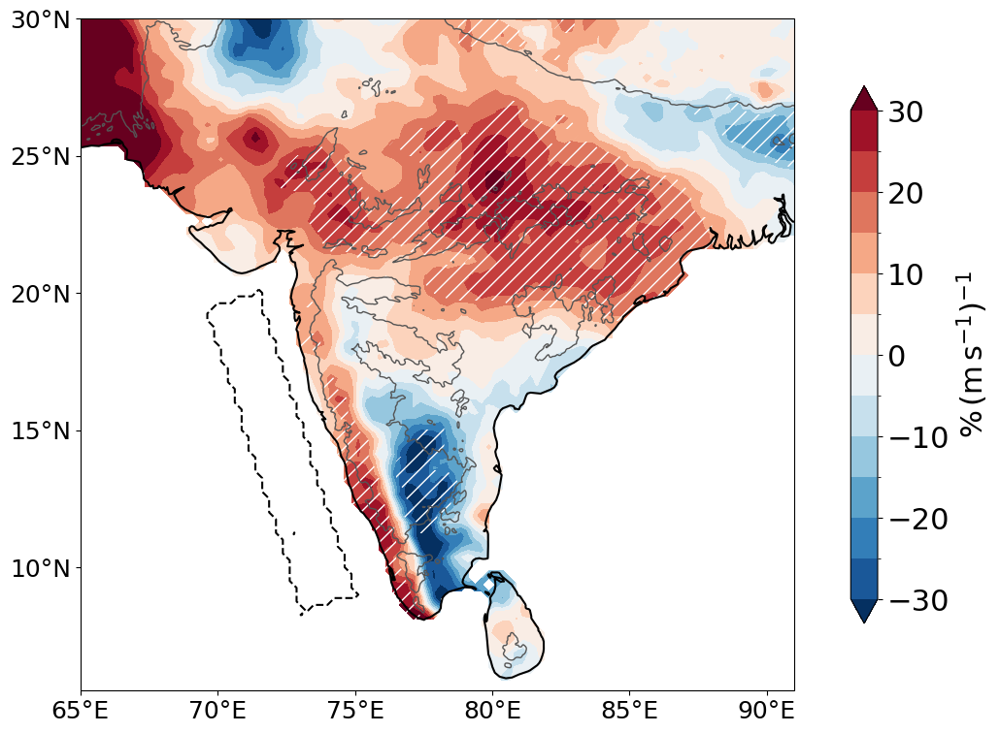

In [15]:
plt.rcParams['hatch.color'] = 'w'
matplotlib.rcParams.update({'font.size': 22})
fig,ax=plt.subplots(1,1,figsize=(15,9),subplot_kw={'projection':ccrs.PlateCarree()})

dataset = APHRODITE
wind_ts = spatial_mean(e5_crossslopeu_jja_yearly,mask = windmask).sel(year=slice(1960,2015))
precip = dataset.precip_jja_yearly.sel(year=slice(1960,2015),longitude=slice(60,110))
precip_reg = linregress_xr(wind_ts,precip,dim='year')
fdrfact = fdr_xr_2d(precip_reg.pvalue,0.1) * precip_reg.pvalue**0

(100*precip_reg.slope/precip.mean('year')).plot.contourf(ax=ax,
                                                         transform=ccrs.PlateCarree(),
                                                         levels=np.linspace(-30,30,13),
                                                         extend='both',
                                                         cbar_kwargs={'shrink':0.8,'label':r"%$\,\left(\text{m}\,\text{s}^{-1}\right)^{-1}$"})

#fdrfact.plot.contour(ax=ax,transform=ccrs.PlateCarree(),levels=[0.5],colors=['w'],linewidths=[2.])
hatches = fdrfact.plot.contourf(ax=ax, levels=[0.5,1], colors='none', hatches=['','//'], alpha=0,add_colorbar=False)

smooth(topo_hires.sel(longitude=slice(60,100),latitude=slice(40,5))).plot.contour(ax=ax,levels=[500.],colors='#555555',linewidths=[1.])

windmask.plot.contour(ax=ax,transform=ccrs.PlateCarree(),levels=[0.5],colors='k',linestyles=['--'])

ax.set_xlim(68,91)
ax.set_ylim(5.5,27)

ax.set_xticks(range(65,91,5), crs=ccrs.PlateCarree())
ax.set_yticks(range(10,31,5), crs=ccrs.PlateCarree())
ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
ax.yaxis.set_major_formatter(LatitudeFormatter())
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=18)
ax.set_xlabel("")
ax.set_ylabel("")
ax.coastlines(linewidth=1.5)


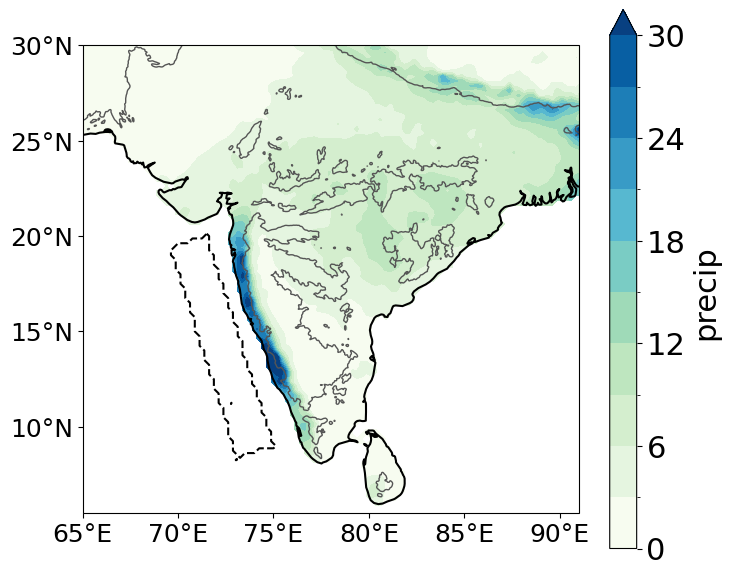

In [64]:
plt.rcParams['hatch.color'] = 'w'
matplotlib.rcParams.update({'font.size': 22})
fig,ax=plt.subplots(1,1,figsize=(8,7),subplot_kw={'projection':ccrs.PlateCarree()})

dataset = APHRODITE
precip = dataset.precip_jja_yearly.sel(year=slice(1960,2015),longitude=slice(60,110))
precip.mean('year').plot.contourf(ax=ax,
                                  transform=ccrs.PlateCarree(),
                                  levels=np.linspace(0,30,11),
                                  cmap=plt.cm.GnBu)

smooth(topo_hires.sel(longitude=slice(60,100),latitude=slice(40,5))).plot.contour(ax=ax,levels=[500.],colors='#555555',linewidths=[1.])

windmask.plot.contour(ax=ax,transform=ccrs.PlateCarree(),levels=[0.5],colors='k',linestyles=['--'])

ax.set_xlim(68,91)
ax.set_ylim(5.5,27)

ax.set_xticks(range(65,91,5), crs=ccrs.PlateCarree())
ax.set_yticks(range(10,31,5), crs=ccrs.PlateCarree())
ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
ax.yaxis.set_major_formatter(LatitudeFormatter())
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=18)
ax.set_xlabel("")
ax.set_ylabel("")
ax.coastlines(linewidth=1.5)


## With rotation

In [22]:
from orographicPrecipitation.observationsAndERA5.mountainUtils import rotate_var

In [57]:
def linregress_xr_wCI(x,y,dim='time'):
    nt = len(x[dim])
    assert nt==len(y[dim])
    ssxm = nt*x.var(dim=dim)
    ssym = nt*y.var(dim=dim)
    ssxym = nt*xr.cov(x,y,dim=dim)       
    r = np.maximum(np.minimum(ssxym / np.sqrt(ssxm * ssym),1.),-1)
    slope = ssxym / ssxm
    
    
    
    ### from https://en.wikipedia.org/wiki/Simple_linear_regression ##
    s_eps_2 = (ssym - slope**2*ssxm)/(nt-2)/nt
    s_slope = np.sqrt(nt*s_eps_2 / ssxm)
    ########################
    
    df = nt - 2  # Number of degrees of freedom
    TINY = 1.0e-20
    t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
    
    pval = special.stdtr(df, -np.abs(t))*2 * y.isel({dim:0})**0
    
    
    return xr.merge([slope.rename('slope'),(r**2).rename('rsquared'),pval.rename('pvalue'),s_slope.rename('sterr_slope')])

In [26]:
pr = APHRODITE.precip_jja_yearly.sel(year=slice(1960,2015)).sel(latitude=slice(30,5),longitude=slice(60,100))
orog = orogm.sel(latitude=slice(30,5),longitude=slice(60,100))

pr_rot = rotate_var(pr.fillna(0.),70,two_dim=False)
orog_rot = rotate_var(orog,70)

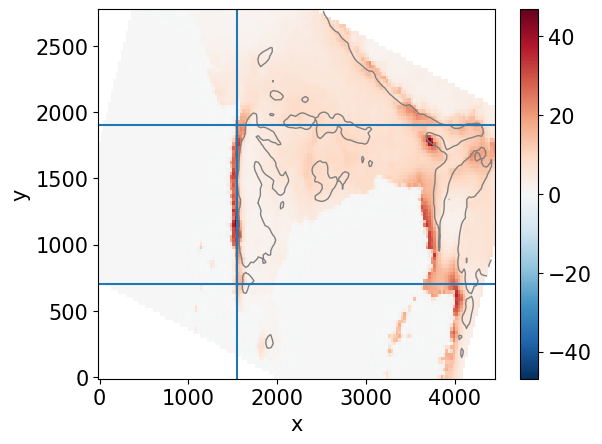

In [49]:
pr_rot.mean('year').plot()
orog_rot.plot.contour(levels=[500.],colors='grey',linewidths=[1.])
plt.axhline(1900)
plt.axhline(700)
plt.axvline(1550)


/global/common/software/m3310/conda/xrdask.2023.11.qn/lib/python3.9/site-packages/xarray/core/computation.py:761: RuntimeWarning: invalid value encountered in sqrt
  result_data = func(*input_data)


Text(0, 0.5, 'mm/day or %/(m/s)')

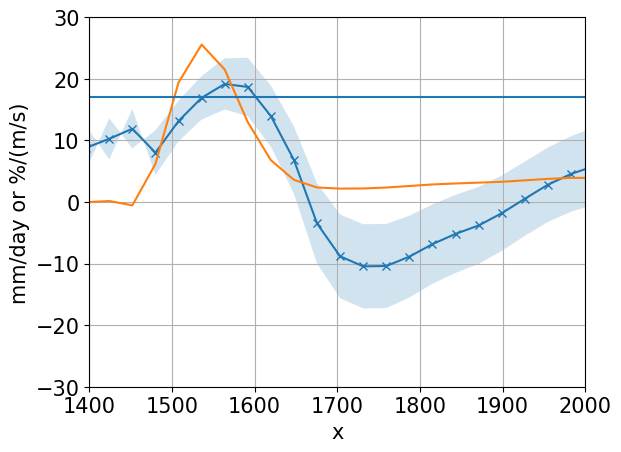

In [60]:
pr_rot_slice = pr_rot.sel(y=slice(700,1900)).mean('y')
ghats_tilted_rect2 = [ 75  ,   9  ,  71.5, 19   ,2]
windmask2 = tilted_rect(e5_crossslopeu_jja_yearly,*ghats_tilted_rect2,reverse=True)


wind_ts = spatial_mean(e5_crossslopeu_jja_yearly,mask = windmask2).sel(year=slice(1960,2015))
precip_reg = linregress_xr_wCI(wind_ts,pr_rot_slice,dim='year')

(100*precip_reg.slope/pr_rot_slice.mean('year')).plot(marker='x')

plt.fill_between(pr_rot_slice.x,(100*(precip_reg.slope-precip_reg.sterr_slope)/pr_rot_slice.mean('year')),(100*(precip_reg.slope+precip_reg.sterr_slope)/pr_rot_slice.mean('year')),alpha=0.2)


pr_rot_slice.mean('year').plot()
plt.xlim(1400,2000)
plt.grid()
plt.ylim(-30,30)

plt.axhline(17)
plt.ylabel('mm/day or %/(m/s)')

## With ERA5 precip

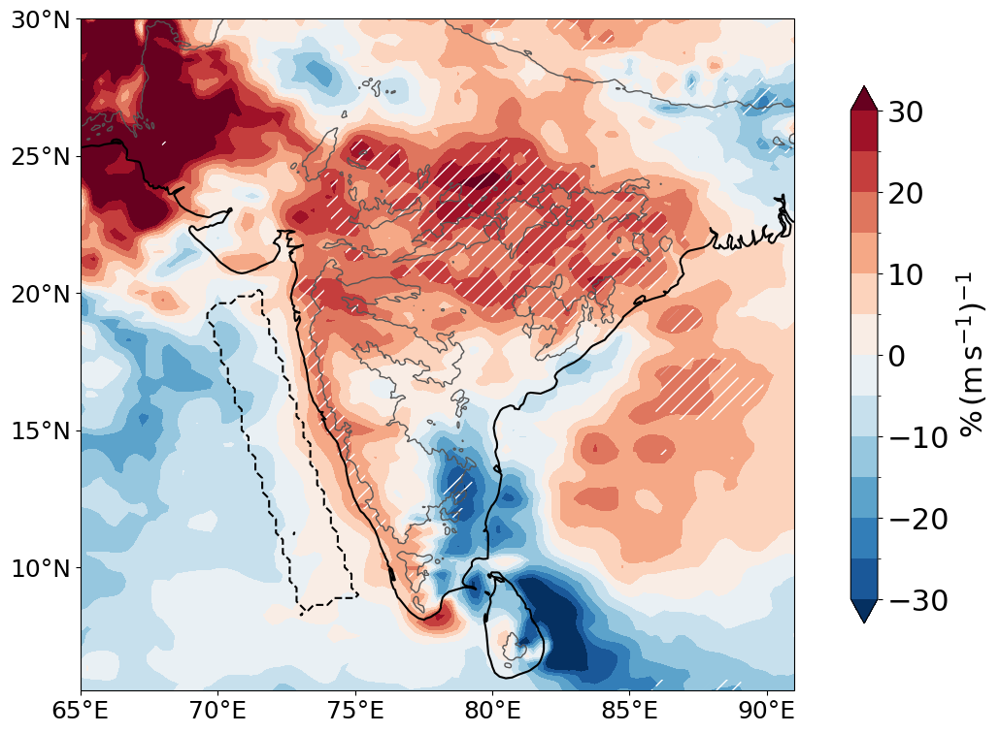

In [17]:
plt.rcParams['hatch.color'] = 'w'
matplotlib.rcParams.update({'font.size': 22})
fig,ax=plt.subplots(1,1,figsize=(15,9),subplot_kw={'projection':ccrs.PlateCarree()})

dataset = ERA5
wind_ts = spatial_mean(e5_crossslopeu_jja_yearly,mask = windmask).sel(year=slice(1960,2015))
precip = dataset.precip_jja_yearly.sel(year=slice(1960,2015),longitude=slice(60,110))
precip_reg = linregress_xr(wind_ts,precip,dim='year')
fdrfact = fdr_xr_2d(precip_reg.pvalue,0.1) * precip_reg.pvalue**0

(100*precip_reg.slope/precip.mean('year')).plot.contourf(ax=ax,
                                                         transform=ccrs.PlateCarree(),
                                                         levels=np.linspace(-30,30,13),
                                                         extend='both',
                                                         cbar_kwargs={'shrink':0.8,'label':r"%$\,\left(\text{m}\,\text{s}^{-1}\right)^{-1}$"})

#fdrfact.plot.contour(ax=ax,transform=ccrs.PlateCarree(),levels=[0.5],colors=['w'],linewidths=[2.])
hatches = fdrfact.plot.contourf(ax=ax, levels=[0.5,1], colors='none', hatches=['','//'], alpha=0,add_colorbar=False)

smooth(topo_hires.sel(longitude=slice(60,100),latitude=slice(40,5))).plot.contour(ax=ax,levels=[500.],colors='#555555',linewidths=[1.])

windmask.plot.contour(ax=ax,transform=ccrs.PlateCarree(),levels=[0.5],colors='k',linestyles=['--'])

ax.set_xlim(68,91)
ax.set_ylim(5.5,27)

ax.set_xticks(range(65,91,5), crs=ccrs.PlateCarree())
ax.set_yticks(range(10,31,5), crs=ccrs.PlateCarree())
ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
ax.yaxis.set_major_formatter(LatitudeFormatter())
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=18)
ax.set_xlabel("")
ax.set_ylabel("")
ax.coastlines(linewidth=1.5)


## B_L in ERA5

In [22]:
e5_t_1950_1978 = xr.open_zarr("/pscratch/sd/q/qnicolas/temp/e5.monthly.128_130_t.1950-1978.zarr").t
e5_t_1979_2020 = xr.open_zarr("/pscratch/sd/q/qnicolas/temp/e5.monthly.128_130_t.1979-2020.zarr").T
e5_q_1950_1978 = xr.open_zarr("/pscratch/sd/q/qnicolas/temp/e5.monthly.128_133_q.1950-1978.zarr").q
e5_q_1979_2020 = xr.open_zarr("/pscratch/sd/q/qnicolas/temp/e5.monthly.128_133_q.1979-2020.zarr").Q
e5_t_monthly = xr.concat((e5_t_1950_1978,e5_t_1979_2020),dim='time')
e5_q_monthly = xr.concat((e5_q_1950_1978,e5_q_1979_2020),dim='time')
e5tq = xr.merge([e5_t_monthly,e5_q_monthly],compat='override')

e5_thetae_monthly = thetae_vectorized(e5tq.t,e5tq.q,e5tq.t.level)
e5_thetaestar_monthly = thetaestar_vectorized(e5tq.t,e5tq.t.level)

e5_psfc = e5_monthly_timeseries('128_134_sp',range(2010,2012))
e5_psfc = sel_months(e5_psfc.sel(latitude=slice(30,0),longitude=slice(60,110)),[6,7,8]).mean('time').load()


In [24]:
%%time
e5_tL_jja_yearly = (sel_months(e5_t_monthly, months=months).groupby('time.year').mean().sel(level=slice(600,900)).integrate('level')/300).load()
e5_qL_jja_yearly = (sel_months(e5_q_monthly, months=months).groupby('time.year').mean().sel(level=slice(600,900)).integrate('level')/300).load()

CPU times: user 1.61 s, sys: 257 ms, total: 1.87 s
Wall time: 3.87 s


In [42]:
%%time
e5_thetaeL_jja_yearly = (sel_months(e5_thetae_monthly, months=months).groupby('time.year').mean().sel(level=slice(500,850)).integrate('level')/350).load()
e5_thetaeLstar_jja_yearly = (sel_months(e5_thetaestar_monthly, months=months).groupby('time.year').mean().sel(level=slice(500,850)).integrate('level')/350).load()
thetaeb = pressure_avg_bounds(e5_thetae_monthly,850e2,e5_psfc)*np.sqrt(-1+2*(e5_psfc>850e2)) # the sqrt factor converts to nan any location that has surface pressure > lft_bot_pressure
e5_thetaeb_jja_yearly = sel_months(thetaeb, months=months).groupby('time.year').mean().load()  
BL = compute_BL(e5_thetaeb_jja_yearly,e5_thetaeL_jja_yearly,e5_thetaeLstar_jja_yearly)

CPU times: user 9.61 s, sys: 3.17 s, total: 12.8 s
Wall time: 48.4 s


In [25]:
%%time
e5_thetaeL_jja_yearly = (sel_months(e5_thetae_monthly, months=months).groupby('time.year').mean().sel(level=slice(600,900)).integrate('level')/300).load()
e5_thetaeLstar_jja_yearly = (sel_months(e5_thetaestar_monthly, months=months).groupby('time.year').mean().sel(level=slice(600,900)).integrate('level')/300).load()
thetaeb = pressure_avg_bounds(e5_thetae_monthly,900e2,e5_psfc)*np.sqrt(-1+2*(e5_psfc>900e2)) # the sqrt factor converts to nan any location that has surface pressure > lft_bot_pressure
e5_thetaeb_jja_yearly = sel_months(thetaeb, months=months).groupby('time.year').mean().load()  
BL600900 = compute_BL(e5_thetaeb_jja_yearly,e5_thetaeL_jja_yearly,e5_thetaeLstar_jja_yearly)

/global/common/software/m3310/conda/xrdask.2023.11.qn/lib/python3.9/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in log
  return func(*(_execute_task(a, cache) for a in args))
/global/common/software/m3310/conda/xrdask.2023.11.qn/lib/python3.9/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in log
  return func(*(_execute_task(a, cache) for a in args))
/global/common/software/m3310/conda/xrdask.2023.11.qn/lib/python3.9/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in log
  return func(*(_execute_task(a, cache) for a in args))
/global/common/software/m3310/conda/xrdask.2023.11.qn/lib/python3.9/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in log
  return func(*(_execute_task(a, cache) for a in args))
/global/common/software/m3310/conda/xrdask.2023.11.qn/lib/python3.9/site-packages/dask/core.py:127: RuntimeWarning: invalid value encountered in log
  return func(*(_execute_task(a

CPU times: user 27 s, sys: 5.62 s, total: 32.6 s
Wall time: 1min 36s


In [26]:
def select_bootstrap_sample(distribution):
    """Sample a distribution randomly with replacement"""
    n=len(distribution)
    return distribution[np.random.randint(0,n,size=n)]
def bootstrap_CI_mean(data,CI_level,nsamples=1000):
    """Compute a confidence interval for the mean of an array at the level CI_level (0<CI_level<100), 
    using nsamples bootstrap samples"""
    means = np.array([select_bootstrap_sample(data).mean() for _ in range(nsamples)])
    return [np.percentile(means,50-CI_level/2),np.percentile(means,50+CI_level/2)]

def get_binned(a,b,bins,itq=False,bootstrap=False):
    """Calculate conditional averages of b on values of a, within the bins given in argument.
    args :
        - a: array-like, values on the x-axis
        - b: array-like, values on the y-axis, to be averaged conditionally on values of a
        - bins: array-like, must be increasing, defines the edges of bins in which conditional
                averages are taken
        - itq: bool, whether to return interquartile ranges of values of b within the bins
        - bootstrap: mutually exclusive with itq. Whether to return bootstrap estimates of the 95%CI
          of the means of b within the bins.
    returns:
        - bin_centers: centers of the bins given in argument
        - bin_means: averages of b conditioned on a being inside a given bin
        - (if itq) bin_median,bin_q1,bin_q2: median, first quartile, and 3rd quartile of values of b 
           within each bin
        - (if bootstrap) cinf, csup: lower and upper ranges of confidence intervals for the conditional 
          means of b
    """
    idx_bin_inf = max(0,np.argmax(bins>float(a.min()))-1)
    idx_bin_sup = np.argmin(bins<float(a.max()))
    if idx_bin_sup==0 or idx_bin_sup==len(bins)-1:
        bins=bins[idx_bin_inf:]
    else:
        bins=bins[idx_bin_inf:idx_bin_sup+1]
    bin_centers=(bins[1:]+bins[:-1])/2
    digitized = np.digitize(np.array(a), bins)
    bin_means = np.array([np.array(b)[digitized == i].mean() for i in range(1, len(bins))])
    if itq:
        bin_median = np.array([np.median(np.array(b)[digitized == i]) for i in range(1, len(bins))])
        try:
            bin_q1 = np.array([np.quantile(np.array(b)[digitized == i],0.25) for i in range(1, len(bins))])
            bin_q2 = np.array([np.quantile(np.array(b)[digitized == i],0.75) for i in range(1, len(bins))])
        except IndexError:
            bin_q1 = bin_median
            bin_q2 = bin_median
        return bin_centers,bin_means,bin_median,bin_q1,bin_q2
    elif bootstrap :
        cinf_csup =  np.array([bootstrap_CI_mean(np.array(b)[digitized == i],95) for i in range(1, len(bins))])
        return bin_centers,bin_means,cinf_csup[:,0],cinf_csup[:,1]
    else:
        return bin_centers,bin_means
    
def get_count(a,bins):
    """given an array a and a set of bins, return the counts of values of a within each bin"""
    idx_bin_inf = max(0,np.argmax(bins>float(a.min()))-1)
    idx_bin_sup = np.argmin(bins<float(a.max()))
    if idx_bin_sup==0 or idx_bin_sup==len(bins)-1:
        bins=bins[idx_bin_inf:]
    else:
        bins=bins[idx_bin_inf:idx_bin_sup+1]
    bin_centers=(bins[1:]+bins[:-1])/2
    count = np.histogram(a,bins)[0]
    return bin_centers,count

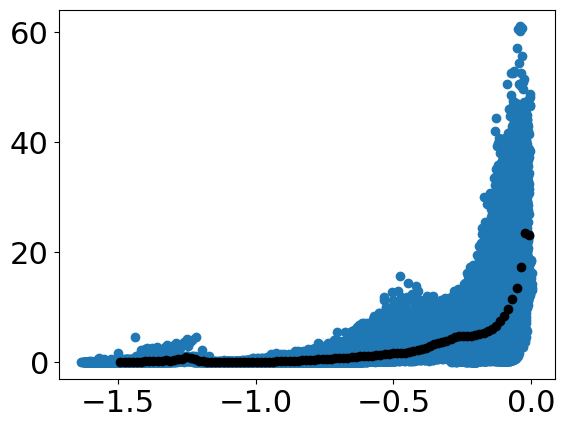

In [34]:
precip = APHRODITE.precip_jja_yearly.sel(year=slice(1960,2015),longitude=slice(60,110))
BL600900_sub = BL600900.sel(year=slice(1960,2015)).interp_like(precip)
pred,pr = BL600900_sub.data.reshape(-1),precip.data.reshape(-1)
bins = np.linspace(-1.5,0.,101)
plt.scatter(pred,pr)

idxnan = ~(np.isnan(pred)|np.isnan(pr))
pred = pred[idxnan]
pr = pr[idxnan]

centers,means = get_binned(pred,pr,bins,bootstrap=False)
plt.scatter(centers,means,color='k')

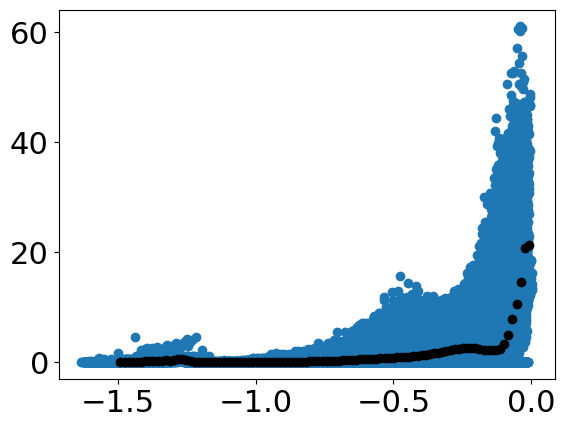

In [190]:
precip = APHRODITE.precip_jja_yearly.sel(year=slice(1960,2015),longitude=slice(60,110))
BL600900_sub = BL600900.sel(year=slice(1960,2015)).interp_like(precip)
pred,pr = BL600900_sub.data.reshape(-1),precip.data.reshape(-1)
bins = np.linspace(-1.5,0.,101)
plt.scatter(pred,pr)

idxnan = 1 - ((np.isnan(pred)+np.isnan(pr))>0)
pred = pred[idxnan]
pr = pr[idxnan]

centers,means = get_binned(pred,pr,bins,bootstrap=False)
plt.scatter(centers,means,color='k')

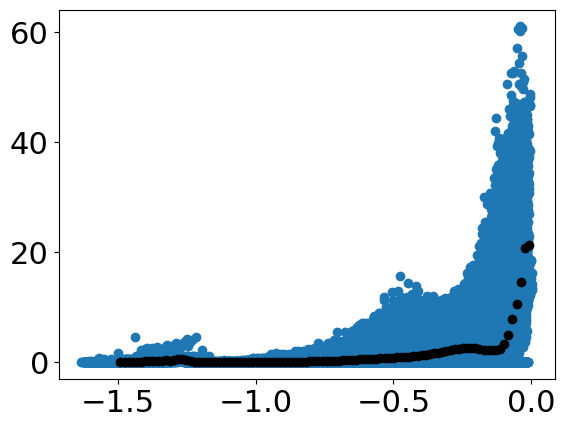

In [190]:
precip = APHRODITE.precip_jja_yearly.sel(year=slice(1960,2015),longitude=slice(60,110))
BL600900_sub = BL600900.sel(year=slice(1960,2015)).interp_like(precip)
pred,pr = BL600900_sub.data.reshape(-1),precip.data.reshape(-1)
bins = np.linspace(-1.5,0.,101)
plt.scatter(pred,pr)

idxnan = (np.isnan(pred)+np.isnan(pr))>0
pred[idxnan] = -3
pr[idxnan] = 0.

centers,means = get_binned(pred,pr,bins,bootstrap=False)
plt.scatter(centers,means,color='k')

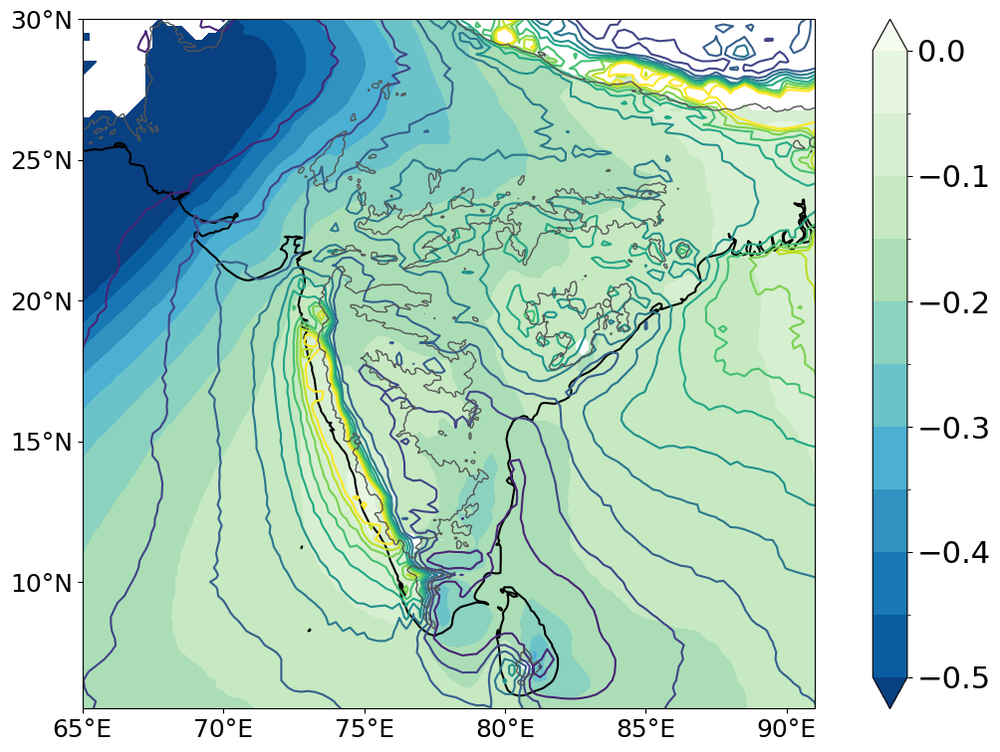

In [44]:
plt.rcParams['hatch.color'] = 'w'
matplotlib.rcParams.update({'font.size': 22})
fig,ax=plt.subplots(1,1,figsize=(15,9),subplot_kw={'projection':ccrs.PlateCarree()})

BL600900.sel(year=slice(1960,2020)).mean('year').plot.contourf(ax=ax,
                                     transform=ccrs.PlateCarree(),
                                     levels=np.linspace(-0.5,0.,11),
                                     cmap = plt.cm.GnBu_r   ,                    
                                     extend='both')

ERA5.precip_jja_yearly.sel(year=slice(1960,2020)).mean('year').plot.contour(ax=ax,
                                                         transform=ccrs.PlateCarree(),
                                                         levels=np.linspace(0,20,11),
                                                         extend='both')

#fdrfact.plot.contour(ax=ax,transform=ccrs.PlateCarree(),levels=[0.5],colors=['w'],linewidths=[2.])
smooth(topo_hires.sel(longitude=slice(60,100),latitude=slice(40,5))).plot.contour(ax=ax,levels=[500.],colors='#555555',linewidths=[1.])


ax.set_xlim(68,91)
ax.set_ylim(5.5,27)

ax.set_xticks(range(65,91,5), crs=ccrs.PlateCarree())
ax.set_yticks(range(10,31,5), crs=ccrs.PlateCarree())
ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
ax.yaxis.set_major_formatter(LatitudeFormatter())
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=18)
ax.set_xlabel("")
ax.set_ylabel("")
ax.coastlines(linewidth=1.5)


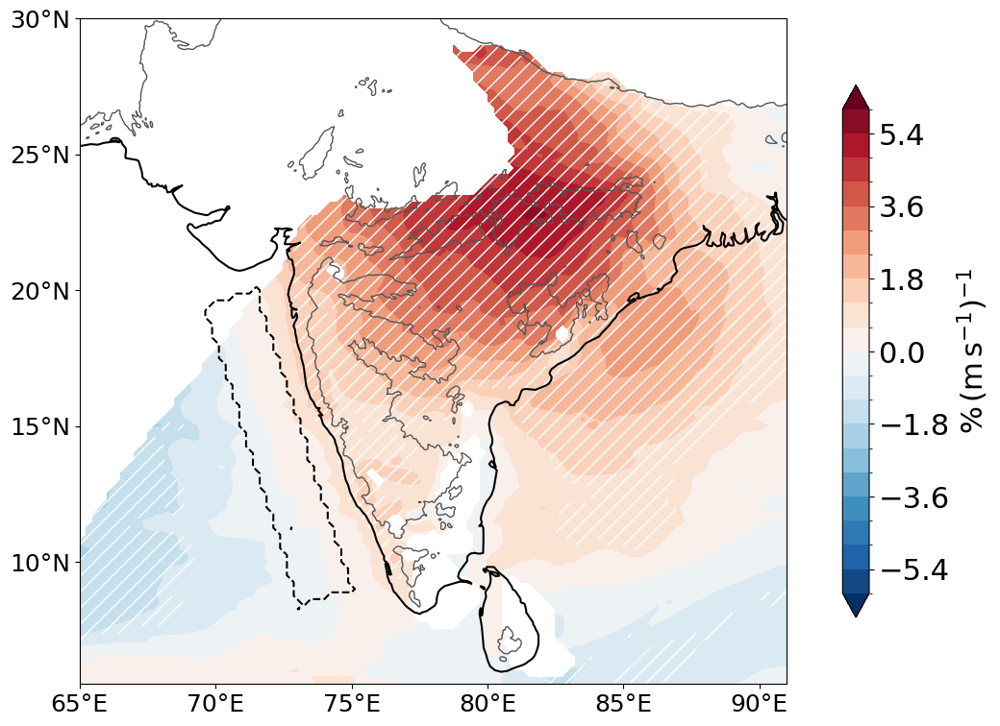

In [36]:
plt.rcParams['hatch.color'] = 'w'
matplotlib.rcParams.update({'font.size': 22})
fig,ax=plt.subplots(1,1,figsize=(15,9),subplot_kw={'projection':ccrs.PlateCarree()})

wind_ts = spatial_mean(e5_crossslopeu_jja_yearly,mask = windmask).sel(year=slice(1960,2020))
precip =  BL600900.sel(year=slice(1960,2020),longitude=slice(60,110))
precip_reg = linregress_xr(wind_ts,precip,dim='year')
fdrfact = fdr_xr_2d(precip_reg.pvalue,0.1) * precip_reg.pvalue**0

(100*precip_reg.slope / (precip.mean('year')>-0.2)).plot.contourf(ax=ax,
                                     transform=ccrs.PlateCarree(),
                                     levels=21,#np.linspace(-30,30,13),
                                     extend='both',
                                     cbar_kwargs={'shrink':0.8,'label':r"%$\,\left(\text{m}\,\text{s}^{-1}\right)^{-1}$"})

#fdrfact.plot.contour(ax=ax,transform=ccrs.PlateCarree(),levels=[0.5],colors=['w'],linewidths=[2.])
hatches = fdrfact.plot.contourf(ax=ax, levels=[0.5,1], colors='none', hatches=['','//'], alpha=0,add_colorbar=False)

smooth(topo_hires.sel(longitude=slice(60,100),latitude=slice(40,5))).plot.contour(ax=ax,levels=[500.],colors='#555555',linewidths=[1.])

windmask.plot.contour(ax=ax,transform=ccrs.PlateCarree(),levels=[0.5],colors='k',linestyles=['--'])

ax.set_xlim(68,91)
ax.set_ylim(5.5,27)

ax.set_xticks(range(65,91,5), crs=ccrs.PlateCarree())
ax.set_yticks(range(10,31,5), crs=ccrs.PlateCarree())
ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
ax.yaxis.set_major_formatter(LatitudeFormatter())
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=18)
ax.set_xlabel("")
ax.set_ylabel("")
ax.coastlines(linewidth=1.5)


In [191]:
BLlinear = -(e5_tL_jja_yearly - e5_tL_jja_yearly.mean('year'))/2. + 2.5e3*(e5_qL_jja_yearly - e5_qL_jja_yearly.mean('year'))/11 + (e5_thetaeb_jja_yearly - e5_thetaeb_jja_yearly.mean('year'))/11


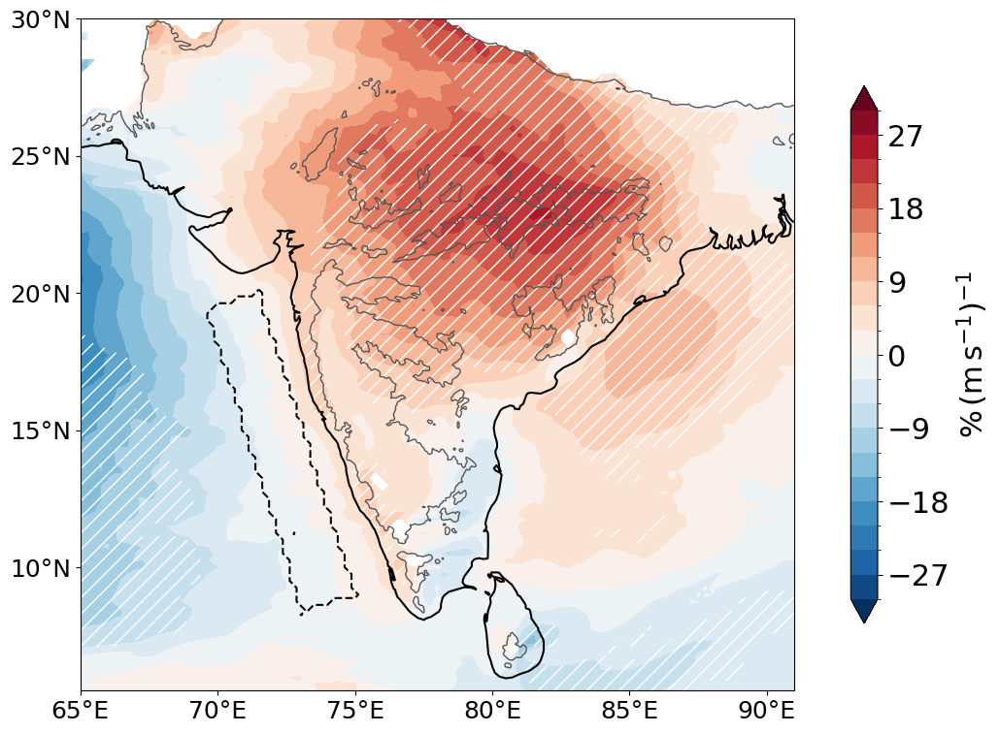

In [193]:
plt.rcParams['hatch.color'] = 'w'
matplotlib.rcParams.update({'font.size': 22})
fig,ax=plt.subplots(1,1,figsize=(15,9),subplot_kw={'projection':ccrs.PlateCarree()})

wind_ts = spatial_mean(e5_crossslopeu_jja_yearly,mask = windmask).sel(year=slice(1960,2020))
precip =  BLlinear.sel(year=slice(1960,2020),longitude=slice(60,110))
precip_reg = linregress_xr(wind_ts,precip,dim='year')
fdrfact = fdr_xr_2d(precip_reg.pvalue,0.1) * precip_reg.pvalue**0

(100*precip_reg.slope).plot.contourf(ax=ax,
                                     transform=ccrs.PlateCarree(),
                                     levels=21,#np.linspace(-30,30,13),
                                     extend='both',
                                     cbar_kwargs={'shrink':0.8,'label':r"%$\,\left(\text{m}\,\text{s}^{-1}\right)^{-1}$"})

#fdrfact.plot.contour(ax=ax,transform=ccrs.PlateCarree(),levels=[0.5],colors=['w'],linewidths=[2.])
hatches = fdrfact.plot.contourf(ax=ax, levels=[0.5,1], colors='none', hatches=['','//'], alpha=0,add_colorbar=False)

smooth(topo_hires.sel(longitude=slice(60,100),latitude=slice(40,5))).plot.contour(ax=ax,levels=[500.],colors='#555555',linewidths=[1.])

windmask.plot.contour(ax=ax,transform=ccrs.PlateCarree(),levels=[0.5],colors='k',linestyles=['--'])

ax.set_xlim(68,91)
ax.set_ylim(5.5,27)

ax.set_xticks(range(65,91,5), crs=ccrs.PlateCarree())
ax.set_yticks(range(10,31,5), crs=ccrs.PlateCarree())
ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
ax.yaxis.set_major_formatter(LatitudeFormatter())
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=18)
ax.set_xlabel("")
ax.set_ylabel("")
ax.coastlines(linewidth=1.5)


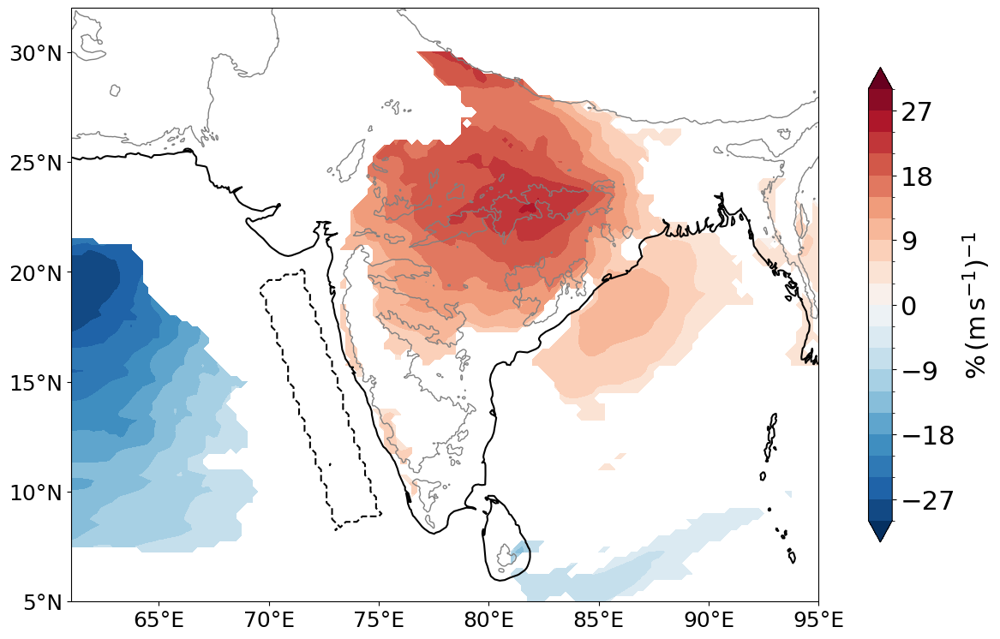

In [192]:
matplotlib.rcParams.update({'font.size': 22})
fig,ax=plt.subplots(1,1,figsize=(15,9),subplot_kw={'projection':ccrs.PlateCarree()})

wind_ts = spatial_mean(e5_crossslopeu_jja_yearly,mask = windmask).sel(year=slice(1960,2020))
precip = BLlinear.sel(year=slice(1960,2020),longitude=slice(60,110))
precip_reg = linregress_xr(wind_ts,precip,dim='year')
fdrfact = fdr_xr_2d(precip_reg.pvalue,0.1)

(100*precip_reg.slope /fdrfact).plot.contourf(ax=ax,
                                              transform=ccrs.PlateCarree(),
                                              levels=21,
                                              extend='both',
                                              cbar_kwargs={'shrink':0.8,'label':r"%$\,\left(\text{m}\,\text{s}^{-1}\right)^{-1}$"})

smooth(topo_hires.sel(longitude=slice(60,100),latitude=slice(40,5))).plot.contour(ax=ax,levels=[500.],colors='grey',linewidths=[1.])

windmask.plot.contour(ax=ax,transform=ccrs.PlateCarree(),levels=[0.5],colors='k',linestyles=['--'])

ax.set_xlim(61,95)
ax.set_ylim(6,32)

ax.set_xticks(range(65,96,5), crs=ccrs.PlateCarree())
ax.set_yticks(range(5,31,5), crs=ccrs.PlateCarree())
ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
ax.yaxis.set_major_formatter(LatitudeFormatter())
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=18)
ax.set_xlabel("")
ax.set_ylabel("")
ax.coastlines(linewidth=1.5)


# CMIP6 change in wind

In [3]:
def add_wind(ax,u,v,color='k',width=0.001,scale=600,key=True,ref=100,app='/(m/s2)',pos=(0.87,1.03)):
    ax.coastlines()
    X = u.latitude.expand_dims({"longitude":u.longitude}).transpose()
    Y = v.longitude.expand_dims({"latitude":u.latitude})
    n=5
    m=5
    q=ax.quiver(np.array(Y)[::n,::m],np.array(X)[::n,::m], np.array(u)[::n,::m], np.array(v)[::n,::m], transform=ccrs.PlateCarree(),color=color,width=width,scale=scale)
    if key:
        ax.quiverkey(q, *pos, ref, label='', labelpos='E', coordinates='axes',color='k',angle=90)
    return q

## Subset models

In [2]:
from tools.loadCMIP6data import *
import json

In [18]:
#modellist_ssp5_uas,df_ssp5_uas = checkModels("ScenarioMIP","ssp585","Amon","uas",nminens=1,verbose=False)
#modellist_ssp5_vas,df_ssp5_vas = checkModels("ScenarioMIP","ssp585","Amon","vas",nminens=1,verbose=False)
#%time modelshortlist_ssp5_uas, dfshort_ssp5_uas = checkYears(modellist_ssp5_uas,df_ssp5_uas,2080,2099)
#%time modelshortlist_ssp5_vas, dfshort_ssp5_vas = checkYears(modellist_ssp5_vas,df_ssp5_vas,2080,2099)


Removing ensemble member 0 from model number 8. Incomplete record. 
Removing model number 8
Removing ensemble member 0 from model number 12. Incomplete record. 
Removing ensemble member 1 from model number 12. Incomplete record. 
Removing ensemble member 2 from model number 12. Incomplete record. 
Removing ensemble member 3 from model number 12. Incomplete record. 
Removing ensemble member 4 from model number 12. Incomplete record. 
Removing ensemble member 5 from model number 12. Incomplete record. 
Removing ensemble member 6 from model number 12. Incomplete record. 
Removing model number 12
Removing ensemble member 0 from model number 13. Incomplete record. 
Removing ensemble member 2 from model number 13. Incomplete record. 
Removed ensemble member 0 from model number 14. Years: 2101 to 2300
Removing model number 14
Removed ensemble member 2 from model number 17. Years: 2055 to 2094
CPU times: user 8.35 s, sys: 2.1 s, total: 10.4 s
Wall time: 44 s
Removing ensemble member 0 from mod

In [24]:
#modellist_hist_uas,df_hist_uas = checkModels("CMIP","historical","Amon","uas",nminens=1,verbose=False)
#modellist_hist_vas,df_hist_vas = checkModels("CMIP","historical","Amon","vas",nminens=1,verbose=False)
#%time modelshortlist_hist_uas, dfshort_hist_uas = checkYears(modellist_hist_uas,df_hist_uas,1980,1999)
#%time modelshortlist_hist_vas, dfshort_hist_vas = checkYears(modellist_hist_vas,df_hist_vas,1980,1999)


Not a modeling center:  /global/cfs/projectdirs/m3522/cmip6/CMIP6/CMIP/hfbasin.lst/
Not a modeling center:  /global/cfs/projectdirs/m3522/cmip6/CMIP6/CMIP/hfbasin.lst/
Removing ensemble member 0 from model number 10. Incomplete record. 
Removing ensemble member 1 from model number 10. Incomplete record. 
Removing model number 10
Removing ensemble member 6 from model number 16. Incomplete record. 
Removing ensemble member 13 from model number 17. Incomplete record. 
Removed ensemble member 21 from model number 17. Years: 2001 to 2014
Removing ensemble member 0 from model number 28. Incomplete record. 
Removing ensemble member 1 from model number 28. Incomplete record. 
Removing ensemble member 2 from model number 28. Incomplete record. 
Removing model number 28
Removing ensemble member 0 from model number 29. Incomplete record. 
Removing ensemble member 1 from model number 29. Incomplete record. 
Removing ensemble member 2 from model number 29. Incomplete record. 
Removing ensemble memb

In [25]:
#dfshort_ssp5_uas.to_csv("df_ScenarioMIP_ssp585_Amon_uas_2080_2099.tsv",sep='\t')
#dfshort_ssp5_vas.to_csv("df_ScenarioMIP_ssp585_Amon_vas_2080_2099.tsv",sep='\t')
#with open("modellist_ScenarioMIP_ssp585_Amon_uas_2080_2099.json", 'w') as f:
#    json.dump(modelshortlist_ssp5_uas, f, indent=2) 
#with open("modellist_ScenarioMIP_ssp585_Amon_vas_2080_2099.json", 'w') as f:
#    json.dump(modelshortlist_ssp5_vas, f, indent=2) 

In [26]:
#dfshort_hist_uas.to_csv("df_CMIP_historical_Amon_uas_1980_1999.tsv",sep='\t')
#dfshort_hist_vas.to_csv("df_CMIP_historical_Amon_vas_1980_1999.tsv",sep='\t')
#with open("modellist_CMIP_historical_Amon_uas_1980_1999.json", 'w') as f:
#    json.dump(modelshortlist_hist_uas, f, indent=2) 
#with open("modellist_CMIP_historical_Amon_vas_1980_1999.json", 'w') as f:
#    json.dump(modelshortlist_hist_vas, f, indent=2) 

In [3]:
#dfshort_hist_uas = pd.read_csv("df_CMIP_historical_Amon_uas_2080_2099.tsv",sep='\t')
with open("modellist_ScenarioMIP_ssp585_Amon_uas_2080_2099.json", 'r') as f:
    modelshortlist_ssp5_uas = json.load(f) 
with open("modellist_ScenarioMIP_ssp585_Amon_vas_2080_2099.json", 'r') as f:
    modelshortlist_ssp5_vas = json.load(f) 
with open("modellist_CMIP_historical_Amon_uas_1980_1999.json", 'r') as f:
    modelshortlist_hist_uas = json.load(f) 
with open("modellist_CMIP_historical_Amon_vas_1980_1999.json", 'r') as f:
    modelshortlist_hist_vas = json.load(f) 


In [4]:
def flatten(lst):
    return [x for xs in lst for x in xs]

def get_model(file,minimal=False):
    if minimal:
        return '/'.join(file.split('/')[8:10])
    else:
        return '/'.join(file.split('/')[7:12])
    
def remove_empty(lst):
    return [ls for ls in lst if len(ls)>0]
    
def intersect(modellist1,modellist2,minimal=False):
    # Get list of ensemble members (remove beginning and end of path, e.g. 
    # /global/cfs/projectdirs/m3522/cmip6/CMIP6/ScenarioMIP/BCC/BCC-CSM2-MR/ssp585/r1i1p1f1/Amon/uas/gn/v20190314/uas_Amon_BCC-CSM2-MR_ssp585_r1i1p1f1_gn_201501-210012.nc
    # -> ScenarioMIP/BCC/BCC-CSM2-MR/ssp585/r1i1p1f1
    modellist1_flat_trim = [get_model(file,minimal=minimal) for file in flatten(flatten(modellist1))]
    modellist2_flat_trim = [get_model(file,minimal=minimal) for file in flatten(flatten(modellist2))]
    
    # Only keep files corresponding to ensemble members which are present in the other modellist
    modellist1_itsct = [[[ensmember for ensmember in model if get_model(ensmember,minimal=minimal) in modellist2_flat_trim] 
                         for model in center
                        ] 
                        for center in modellist1
                       ]
    modellist2_itsct = [[[ensmember for ensmember in model if get_model(ensmember,minimal=minimal) in modellist1_flat_trim] 
                         for model in center
                        ] 
                        for center in modellist2
                       ]
    
    # remove empty sublists 
    modellist1_itsct = remove_empty([remove_empty([remove_empty(model) for model in center]) for center in modellist1_itsct])
    modellist2_itsct = remove_empty([remove_empty([remove_empty(model) for model in center]) for center in modellist2_itsct])
    
    modellist1_itsct_trim = [get_model(file,minimal=minimal) for file in flatten(flatten(modellist1_itsct))]
    modellist2_itsct_trim = [get_model(file,minimal=minimal) for file in flatten(flatten(modellist2_itsct))]
    
    if minimal:
        desc='models'
    else:
        desc='ens. members'
    print("Total initial %s: %i - %i"%(desc,
                                       len(set(modellist1_flat_trim)),
                                       len(set(modellist2_flat_trim))
                                      ))
    print("Total final %s: %i - %i"%(desc,
                                     len(set(modellist1_itsct_trim)),
                                     len(set(modellist2_itsct_trim))
                                    ))
    
    return modellist1_itsct,modellist2_itsct

def trim(modellist1,modellist2,minimal=False):
    modellist1_flat = flatten(flatten(modellist1))
    modellist2_flat = flatten(flatten(modellist2))
    
    modellist1_flat_trim = [get_model(file,minimal=minimal) for file in modellist1_flat]
    modellist2_flat_trim = [get_model(file,minimal=minimal) for file in modellist2_flat]
    
    return modellist1_flat_trim,modellist2_flat_trim

def create_df_from_modellist(modellist):
    incmodel = [get_model(l[0][0],True) for l in modellist]
    d2 = {'Included models':incmodel,'Number of Ensemble Members':[len(modellist[x]) for x in np.arange(len(modellist))]}
    df = pd.DataFrame(d2, columns=['Included models','Number of Ensemble Members'])
    return df

In [5]:
modelshortlist_ssp5_uas_itsct, modelshortlist_ssp5_vas_itsct = intersect(modelshortlist_ssp5_uas,modelshortlist_ssp5_vas,False)

Total initial ens. members: 69 - 73
Total final ens. members: 59 - 59


In [6]:
modelshortlist_hist_uas_itsct, modelshortlist_hist_vas_itsct = intersect(modelshortlist_hist_uas,modelshortlist_hist_vas,False)

Total initial ens. members: 443 - 445
Total final ens. members: 425 - 425


In [7]:
modelshortlist_ssp5_uas_itsctall, _ = intersect(modelshortlist_ssp5_uas_itsct,modelshortlist_hist_uas_itsct,True)
modelshortlist_ssp5_vas_itsctall, _ = intersect(modelshortlist_ssp5_vas_itsct,modelshortlist_hist_uas_itsct,True)
modelshortlist_hist_uas_itsctall, _ = intersect(modelshortlist_hist_uas_itsct,modelshortlist_ssp5_uas_itsct,True)
modelshortlist_hist_vas_itsctall, _ = intersect(modelshortlist_hist_vas_itsct,modelshortlist_ssp5_uas_itsct,True)

Total initial models: 15 - 38
Total final models: 14 - 14
Total initial models: 15 - 38
Total final models: 14 - 14
Total initial models: 38 - 15
Total final models: 14 - 14
Total initial models: 38 - 15
Total final models: 14 - 14


In [106]:
create_df_from_modellist(modelshortlist_ssp5_uas_itsctall)

,Included models,Number of Ensemble Members
0,CNRM-CERFACS/CNRM-CM6-1,6
1,CNRM-CERFACS/CNRM-ESM2-1,5
2,BCC/BCC-CSM2-MR,1
3,MOHC/UKESM1-0-LL,5
4,AWI/AWI-CM-1-1-MR,1
5,NOAA-GFDL/GFDL-ESM4,1
6,NOAA-GFDL/GFDL-CM4,1
7,CCCma/CanESM5,30
8,CAMS/CAMS-CSM1-0,1
9,INM/INM-CM5-0,1


In [107]:
create_df_from_modellist(modelshortlist_hist_uas_itsctall)

,Included models,Number of Ensemble Members
0,CNRM-CERFACS/CNRM-CM6-1,30
1,CNRM-CERFACS/CNRM-ESM2-1,10
2,BCC/BCC-CSM2-MR,3
3,MOHC/UKESM1-0-LL,16
4,AWI/AWI-CM-1-1-MR,5
5,NOAA-GFDL/GFDL-ESM4,1
6,NOAA-GFDL/GFDL-CM4,1
7,CCCma/CanESM5,65
8,CAMS/CAMS-CSM1-0,3
9,INM/INM-CM5-0,10


## Load data + analyze

In [9]:
def sel_years(ds,year1,year2):
    """year1<=year<year2"""
    return ds.sel(time=((ds['time.year']>=year1)&(ds['time.year']<year2)))

In [10]:
df_ssp5_itsctall = create_df_from_modellist(modelshortlist_ssp5_uas_itsctall)

In [11]:
%time uas_ssp5_all = loadData(modelshortlist_ssp5_uas_itsctall,'uas')
%time uas_hist_all = loadData(modelshortlist_hist_uas_itsctall,'uas')
uas_ssp5_all = [sel_years(model.sel(lat=slice(5,30),lon=slice(60,110)),2080,2100).mean('ensmember') for model in uas_ssp5_all]
uas_hist_all = [sel_years(model.sel(lat=slice(5,30),lon=slice(60,110)),1980,2000).mean('ensmember') for model in uas_hist_all]



CPU times: user 5 s, sys: 1.53 s, total: 6.53 s
Wall time: 24.1 s
CPU times: user 33 s, sys: 10.6 s, total: 43.6 s
Wall time: 2min 55s


In [42]:
%time vas_ssp5_all = loadData(modelshortlist_ssp5_vas_itsctall,'vas')
%time vas_hist_all = loadData(modelshortlist_hist_vas_itsctall,'vas')
vas_ssp5_all = [sel_years(model.sel(lat=slice(5,30),lon=slice(60,110)),2080,2100).mean('ensmember') for model in vas_ssp5_all]
vas_hist_all = [sel_years(model.sel(lat=slice(5,30),lon=slice(60,110)),1980,2000).mean('ensmember') for model in vas_hist_all]


CPU times: user 4.62 s, sys: 893 ms, total: 5.51 s
Wall time: 18.6 s
CPU times: user 31.1 s, sys: 6.57 s, total: 37.7 s
Wall time: 2min 6s


In [151]:
%time u1 = sel_months(uas_hist_all[0].groupby('time.month').mean(),[6,7,8]).mean('month').load()
%time u2 = sel_months(uas_ssp5_all[0].groupby('time.month').mean(),[6,7,8]).mean('month').load()

CPU times: user 1.22 s, sys: 503 ms, total: 1.73 s
Wall time: 8.42 s
CPU times: user 258 ms, sys: 93.1 ms, total: 351 ms
Wall time: 1.58 s


In [152]:
%time v1 = sel_months(vas_hist_all[0].groupby('time.month').mean(),[6,7,8]).mean('month').load()
%time v2 = sel_months(vas_ssp5_all[0].groupby('time.month').mean(),[6,7,8]).mean('month').load()

CPU times: user 1.3 s, sys: 537 ms, total: 1.84 s
Wall time: 9.08 s
CPU times: user 253 ms, sys: 104 ms, total: 356 ms
Wall time: 1.95 s


In [154]:
uperp1 = crossslopeflow(u1,v1,70)
uperp2 = crossslopeflow(u2,v2,70)

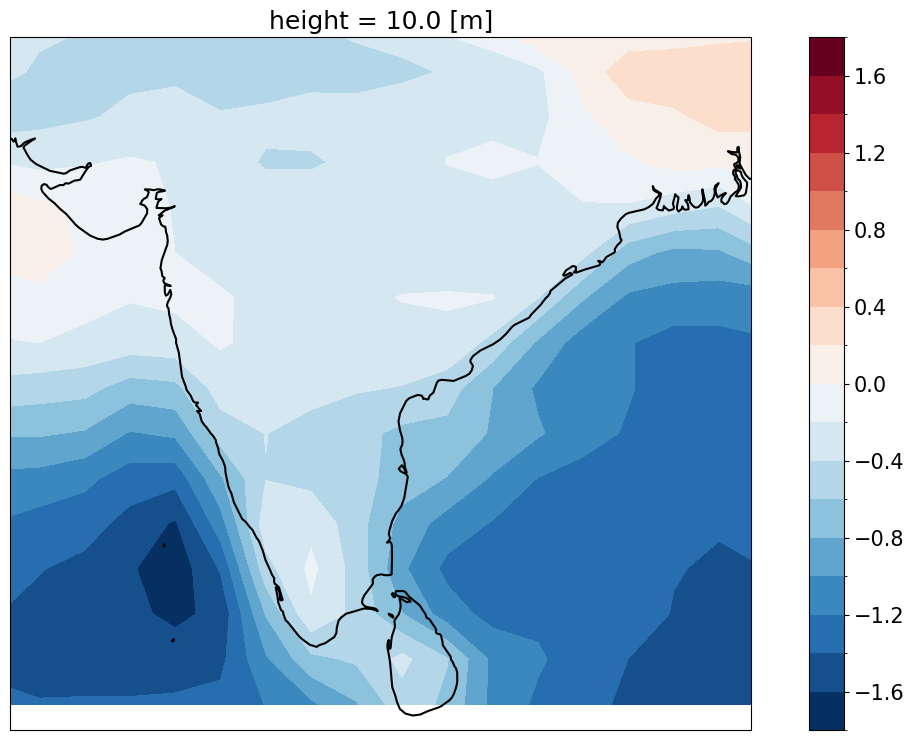

In [158]:
fig,ax=plt.subplots(1,1,figsize=(15,9),subplot_kw={'projection':ccrs.PlateCarree()})
(uperp2 - uperp1).plot.contourf(ax=ax,levels=21)
#(test - test2).plot.contour(ax=ax,levels=[-1.])
ax.set_xlim(68,91)
ax.set_ylim(5.5,27)
ax.coastlines(linewidth=1.5)


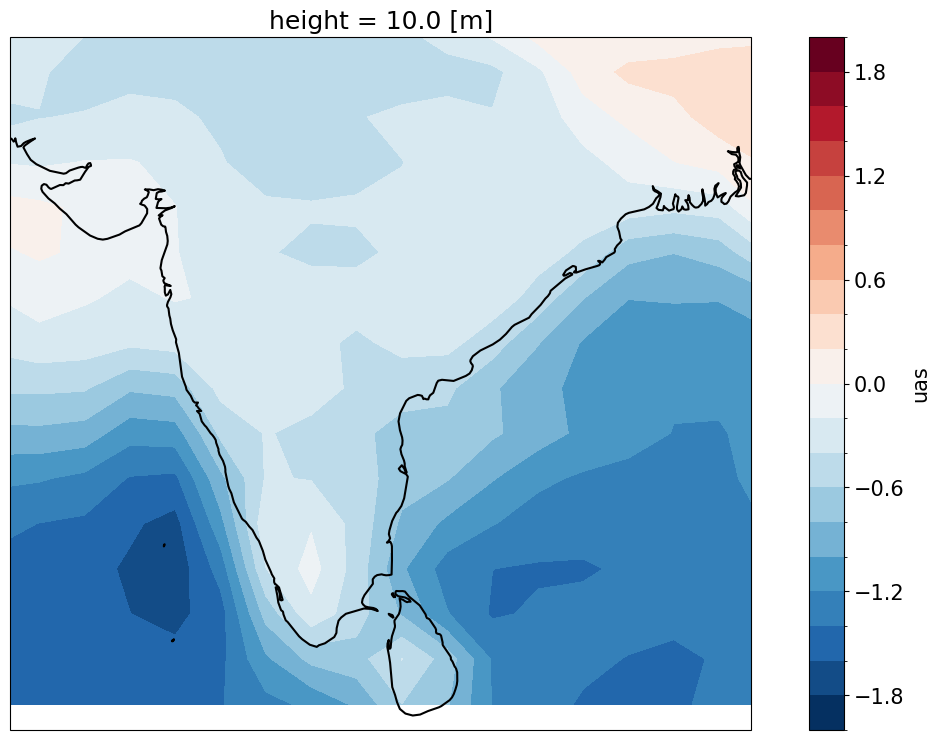

In [156]:
fig,ax=plt.subplots(1,1,figsize=(15,9),subplot_kw={'projection':ccrs.PlateCarree()})
(u2 - u1).plot.contourf(ax=ax,levels=21)
#(test - test2).plot.contour(ax=ax,levels=[-1.])
ax.set_xlim(68,91)
ax.set_ylim(5.5,27)
ax.coastlines(linewidth=1.5)


## Full analysis

In [12]:
uas_ssp5_jjamean = [sel_months(model.groupby('time.month').mean(),[6,7,8]).mean('month').load() for model in uas_ssp5_all]
uas_hist_jjamean = [sel_months(model.groupby('time.month').mean(),[6,7,8]).mean('month').load() for model in uas_hist_all]

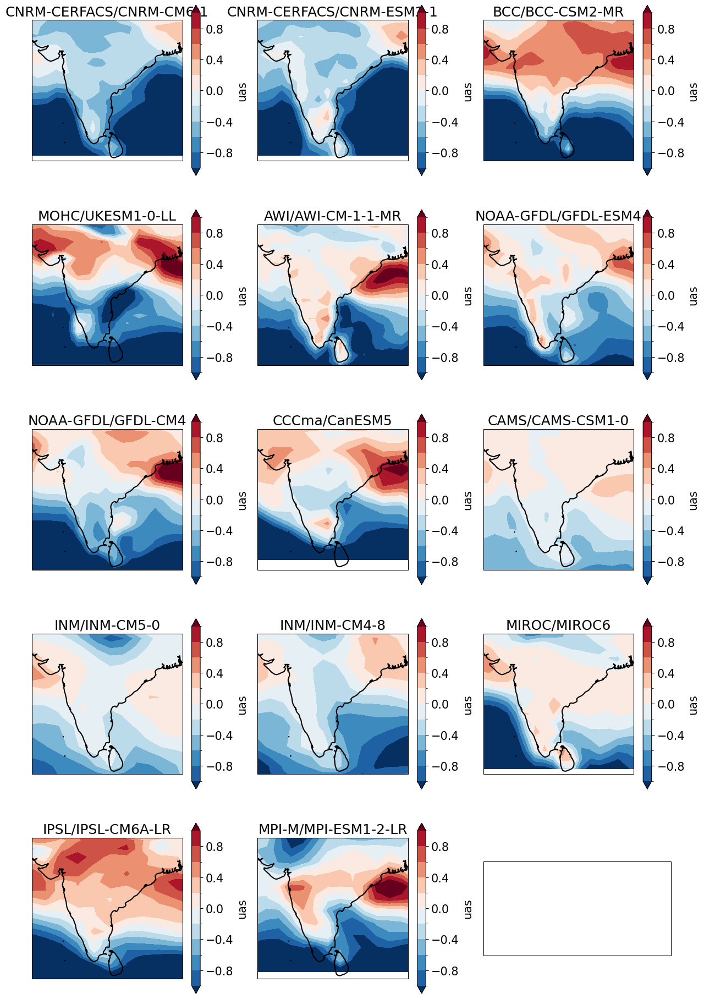

In [16]:
Nmodels = len(df_ssp5_itsctall['Included models'])
ncolumns = 3
fig,axs=plt.subplots(Nmodels//ncolumns+1,ncolumns,figsize=(15,15*Nmodels/ncolumns**2),subplot_kw={'projection':ccrs.PlateCarree()})
axs=axs.reshape(-1)
for i,modelname in enumerate(df_ssp5_itsctall['Included models']):
    u1 = uas_hist_jjamean[i]
    u2 = uas_ssp5_jjamean[i]
    ax = axs[i]
    (u2 - u1).plot.contourf(ax=ax,levels=np.linspace(-1,1,11),extend='both')
    #(test - test2).plot.contour(ax=ax,levels=[-1.])
    ax.set_xlim(68,91)
    ax.set_ylim(5.5,27)
    ax.coastlines(linewidth=1.5)
    ax.set_title(modelname)

    

In [65]:
%%time
shifts=[]
for i,modelname in enumerate(df_ssp5_itsctall['Included models']):
    u1 = uas_hist_jjamean[i].rename(lat='latitude',lon='longitude')
    u2 = uas_ssp5_jjamean[i].rename(lat='latitude',lon='longitude')
    windmask = tilted_rect(u1,*ghats_tilted_rect,reverse=True)
    mean = spatial_mean(u2-u1,mask = windmask)
    shifts.append(float(mean.data))
    print(modelname, "%.1f m/s"%(mean.data))


CNRM-CERFACS/CNRM-CM6-1 -1.0 m/s
CNRM-CERFACS/CNRM-ESM2-1 -1.0 m/s
BCC/BCC-CSM2-MR -1.0 m/s
MOHC/UKESM1-0-LL -1.0 m/s
AWI/AWI-CM-1-1-MR -0.6 m/s
NOAA-GFDL/GFDL-ESM4 -0.6 m/s
NOAA-GFDL/GFDL-CM4 -0.8 m/s
CCCma/CanESM5 -0.6 m/s
CAMS/CAMS-CSM1-0 -0.3 m/s
INM/INM-CM5-0 -0.2 m/s
INM/INM-CM4-8 -0.3 m/s
MIROC/MIROC6 -0.7 m/s
IPSL/IPSL-CM6A-LR -0.2 m/s
MPI-M/MPI-ESM1-2-LR -0.4 m/s
CPU times: user 139 ms, sys: 1.28 ms, total: 141 ms
Wall time: 138 ms


In [66]:
shifts=np.array(shifts)
print(shifts.mean())
print(shifts.std())

-0.6197416532475878
0.29610394833989395


(array([2., 0., 2., 0., 3., 1., 1., 2., 1., 0.]),
 array([-1. , -0.9, -0.8, -0.7, -0.6, -0.5, -0.4, -0.3, -0.2, -0.1,  0. ]),
 <BarContainer object of 10 artists>)

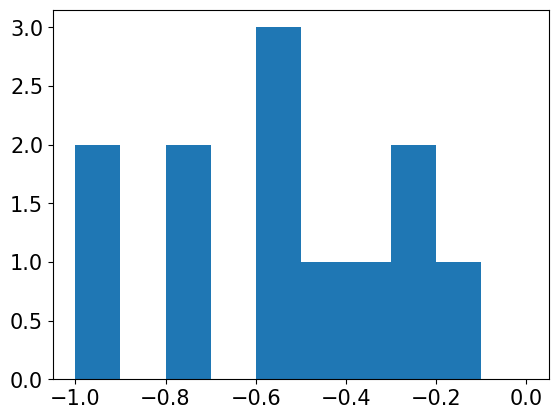

In [29]:
plt.hist(shifts,bins=np.linspace(-1,0,11))

In [32]:
e5_100u = e5_monthly_timeseries('228_246_100u',range(1980,2000))
e5_10u  = e5_monthly_timeseries('128_165_10u',range(1980,2000))

1.9138634204864502
2.1341049671173096


In [33]:
e5_100u_jjamean = sel_box_months(e5_100u,box = box, months=months).mean('time').load()
e5_10u_jjamean  = sel_box_months(e5_10u ,box = box, months=months).mean('time').load()


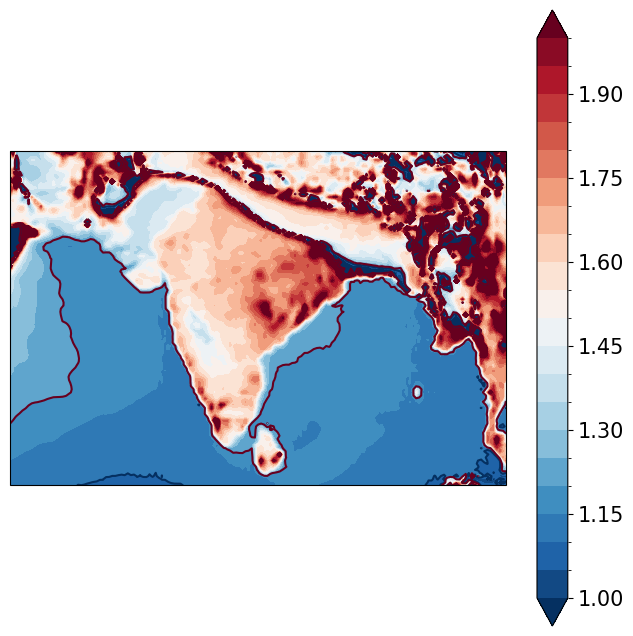

In [41]:
fig,ax=plt.subplots(1,1,figsize=(8,8),subplot_kw={'projection':ccrs.PlateCarree()})
(e5_100u_jjamean/e5_10u_jjamean).plot.contourf(ax=ax,levels=np.linspace(1,2,21))
(e5_100u_jjamean/e5_10u_jjamean).plot.contour(ax=ax,levels=[1.1,1.2])

## With V

In [43]:
vas_ssp5_jjamean = [sel_months(model.groupby('time.month').mean(),[6,7,8]).mean('month').load() for model in vas_ssp5_all]
vas_hist_jjamean = [sel_months(model.groupby('time.month').mean(),[6,7,8]).mean('month').load() for model in vas_hist_all]

In [60]:
uperps_ssp5_jjamean = [crossslopeflow(uas_ssp5_jjamean[i],vas_ssp5_jjamean[i].interp_like(uas_ssp5_jjamean[i]),70) for i in range(len(uas_ssp5_jjamean))]
uperps_hist_jjamean = [crossslopeflow(uas_hist_jjamean[i],vas_hist_jjamean[i].interp_like(uas_hist_jjamean[i]),70) for i in range(len(uas_hist_jjamean))]

In [67]:
%%time
shifts_perp=[]
for i,modelname in enumerate(df_ssp5_itsctall['Included models']):
    u1 = uperps_hist_jjamean[i].rename(lat='latitude',lon='longitude')
    u2 = uperps_ssp5_jjamean[i].rename(lat='latitude',lon='longitude')
    windmask = tilted_rect(u1,*ghats_tilted_rect,reverse=True)
    mean = spatial_mean(u2-u1,mask = windmask)
    shifts_perp.append(float(mean.data))

CPU times: user 141 ms, sys: 0 ns, total: 141 ms
Wall time: 138 ms


In [68]:
shifts_perp=np.array(shifts_perp)
print(shifts_perp.mean())
print(shifts_perp.std())

-0.57206050253656
0.31544529086728657


(array([2., 3., 1., 1., 1., 0., 4., 0., 0., 2.]),
 array([-1. , -0.9, -0.8, -0.7, -0.6, -0.5, -0.4, -0.3, -0.2, -0.1,  0. ]),
 <BarContainer object of 10 artists>)

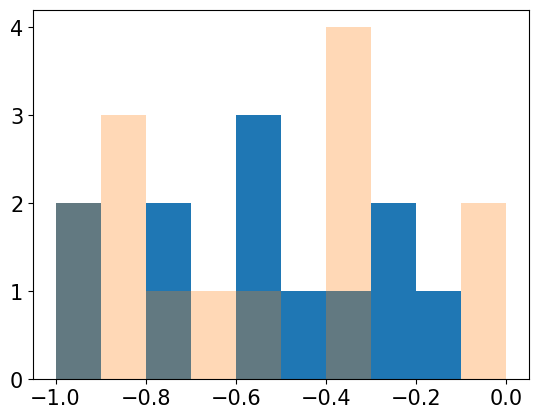

In [70]:
plt.hist(shifts,bins=np.linspace(-1,0,11))
plt.hist(shifts_perp,bins=np.linspace(-1,0,11),alpha=0.3)

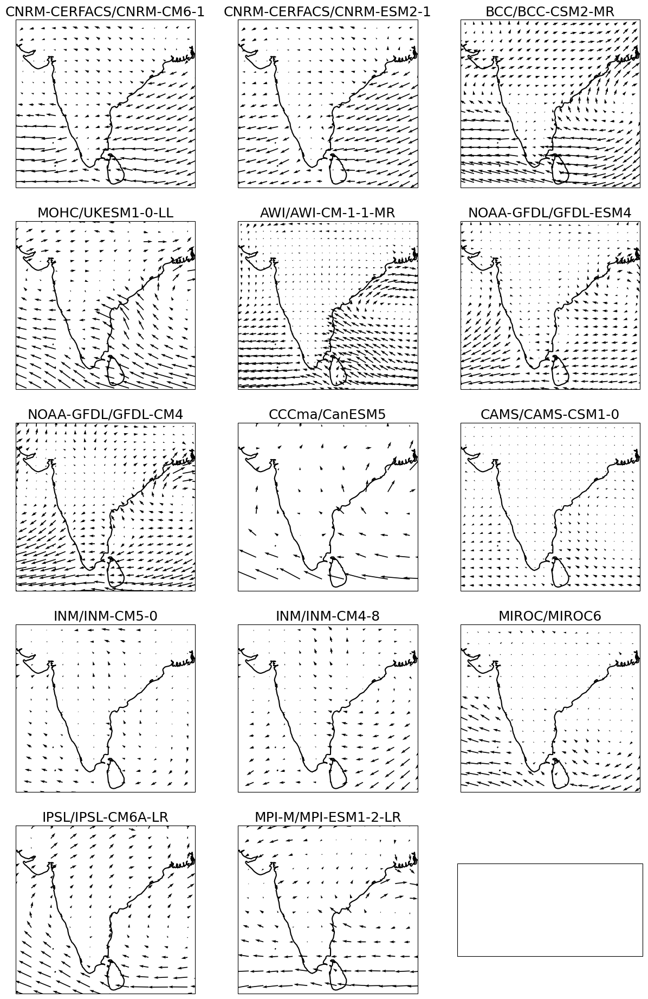

In [78]:
Nmodels = len(df_ssp5_itsctall['Included models'])
ncolumns = 3
fig,axs=plt.subplots(Nmodels//ncolumns+1,ncolumns,figsize=(15,15*Nmodels/ncolumns**2),subplot_kw={'projection':ccrs.PlateCarree()})
axs=axs.reshape(-1)
for i,modelname in enumerate(df_ssp5_itsctall['Included models']):
    u = uas_ssp5_jjamean[i] - uas_hist_jjamean[i]
    v = vas_ssp5_jjamean[i] - vas_hist_jjamean[i]
    v=v.interp_like(u)
    ax = axs[i]
    n=1; m=n
    X = u.lat.expand_dims({"lon":u.lon}).transpose()
    Y = u.lon.expand_dims({"lat":u.lat})
    Q = ax.quiver(np.array(Y)[::n,::m],
                  np.array(X)[::n,::m], 
                  np.array(u)[::n,::m], 
                  np.array(v)[::n,::m], 
                  transform=ccrs.PlateCarree(),color="k",width=5e-3,scale=20)

    ax.set_xlim(68,91)
    ax.set_ylim(5.5,27)
    ax.coastlines(linewidth=1.5)
    ax.set_title(modelname)

    

## With google cloud

In [4]:
import fsspec
import cftime

df = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')
df_uas_hist = df.query("activity_id=='CMIP' & table_id == 'Amon' & variable_id == 'uas' & experiment_id == 'historical'")
df_uas_ssp5 = df.query("activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'uas' & experiment_id == 'ssp245'")


def subselect(first_table,second_table):
    source_ids = second_table['source_id'].unique()
    mask = first_table['source_id'].isin(source_ids)
    return first_table[mask]

df_uas_hist_itsct = subselect(df_uas_hist,df_uas_ssp5)
df_uas_ssp5_itsct = subselect(df_uas_ssp5,df_uas_hist)

source_ids = df_uas_hist_itsct['source_id'].unique()
source_ids = [s for s in source_ids if s!='MPI-ESM1-2-HR'] # Exclude because the name of the modeling center switches from MPI to DKRZ between historical and ssp585

def standardize(ds):
    #try:
    #    ds['time'] = ds.indexes['time'].to_datetimeindex()
    #except AttributeError:
    #    pass
    if 'lat' in ds.coords:
        return ds.rename(lat='latitude',lon='longitude')
    else:
        assert 'latitude' in ds.coords
        return ds

In [8]:
class MountainRangeSimple():
    def __init__(self,name, box, months, tilted_rect,angle,P0):
        self.name = name
        self.box = box
        self.months = months
        self.tilted_rect = tilted_rect
        self.angle = angle
        self.P0=P0
        
Ghats = MountainRangeSimple      ('ghats'      ,[68, 91, 5.5, 27], [6,7,8],[75, 9, 71.5, 20,2]              ,70  ,3 )
Myanmar = MountainRangeSimple    ('myanmar'    ,[82,102,5.5,27]  , [6,7,8],[94.2, 16.5,  91.4  , 21.5 , 1.5],50  ,6 )#[94.5, 17,  91.5  , 21.5 , 1.5], [94, 15,  91  , 21.5 , 2]
Vietnam = MountainRangeSimple    ('vietnam'    ,[100,118,8,25]   , [10,11,12],[108  ,  18  , 111  , 13   ,2]   ,240 ,4 )#[108, 18, 110, 15, 2]

In [9]:
def get_us(MR,hist_u,hist_v,ssp5_u,ssp5_v):
    hist_uperps_sub_boxmean = {}
    ssp5_uperps_sub_boxmean = {}
    hist_uvs_sub = {}
    ssp5_uvs_sub = {}
    for u,v,uvs,uperps in [(hist_u,hist_v,hist_uvs_sub,hist_uperps_sub_boxmean),(ssp5_u,ssp5_v,ssp5_uvs_sub,ssp5_uperps_sub_boxmean)]:
        for k in u.keys():
            lon='longitude';lat='latitude'
            u_sub = sel_box_months(u[k] , MR.box, MR.months,lon=lon,lat=lat,lat_increase=True ).groupby('time.month').mean().mean(('month','ensmember'))
            v_sub = sel_box_months(v[k] , MR.box, MR.months,lon=lon,lat=lat,lat_increase=True ).groupby('time.month').mean().mean(('month','ensmember'))
            
            uvs[k] = xr.merge((u_sub,v_sub))    .load()
            
            uperp = crossslopeflow(u_sub,v_sub,MR.angle)
            uperp_sub_boxmean = spatial_mean(uperp,mask = tilted_rect(uperp,*MR.tilted_rect,True,lon=lon,lat=lat),lon=lon,lat=lat)
            uperps[k] = uperp_sub_boxmean.load()
    valid_models_hist = [k for k,v in hist_uperps_sub_boxmean.items() if not(np.isnan(v.data) or v.data< 0)]
    valid_models_ssp5 = [k for k,v in ssp5_uperps_sub_boxmean.items() if not(np.isnan(v.data) or v.data< 0)]
    valid_models_all = [v for v in valid_models_hist if v in valid_models_ssp5]
    print("Hist valid: %i, ssp5 valid: %i, intersection: %i"%(len(valid_models_hist),len(valid_models_ssp5),len(valid_models_all)))
    return hist_uperps_sub_boxmean,ssp5_uperps_sub_boxmean,hist_uvs_sub,ssp5_uvs_sub,valid_models_all 


### Load

In [5]:
import fsspec

df = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')
df_uas_hist = df.query("activity_id=='CMIP' & table_id == 'Amon' & variable_id == 'uas' & experiment_id == 'historical'")
df_uas_ssp5 = df.query("activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'uas' & experiment_id == 'ssp245'")


def subselect(first_table,second_table):
    source_ids = second_table['source_id'].unique()
    mask = first_table['source_id'].isin(source_ids)
    return first_table[mask]

df_uas_hist_itsct = subselect(df_uas_hist,df_uas_ssp5)
df_uas_ssp5_itsct = subselect(df_uas_ssp5,df_uas_hist)

In [8]:
df = df_uas_ssp5_itsct
var=df.iloc[0].variable_id
ntimes = 120*8
for source in df['source_id'].unique():
    print(source)
    t=time.time()
    df_sub = df[df['source_id'] == source]
    ds_all = [xr.open_zarr(fsspec.get_mapper(zstore), consolidated=False).sel(time=slice('2020-01-01','2099-12-30'))
              for zstore in df_sub.zstore.values]
    
    ds_all_ = [ds for ds in ds_all if len(ds.time) == ntimes]
    if len(ds_all_)==0:
        print('Not all times present, model not included')
        continue
    
    print(time.time()-t,end='  ')
    ensmembers = xr.DataArray(df_sub.member_id.values,coords={'ensmember':df_sub.member_id.values},dims=['ensmember'])
    ensmembers = ensmembers[[i for i in range(len(ds_all)) if len(ds_all[i].time) == ntimes]]
    ds_all_concat = xr.concat(ds_all_,ensmembers)
    ds_all_concat = ds_all_concat.chunk({'time':-1})
    
    if type(ds_all_concat.time.data[0])==pd._libs.tslibs.timestamps.Timestamp:
        ds_all_concat['time'] = pd.to_datetime(ds_all_concat.time)
    
    print(time.time()-t,end='  ')
    row1 = df_sub.iloc[0]
    ds_all_concat[[var,]].to_zarr('/pscratch/sd/q/qnicolas/cmipData/%s.%s.%s.%s.%s.%s.2020-2099.zarr'%(row1.activity_id,
                                                                                row1.experiment_id,
                                                                                row1.institution_id,
                                                                                row1.source_id,
                                                                                row1.table_id,
                                                                                row1.variable_id,
                                                                               ))
    print(time.time()-t)

EC-Earth3-Veg
41.11110496520996  44.04621171951294  72.90383768081665
FGOALS-f3-L
6.60257625579834  6.608762979507446  9.723974466323853
ACCESS-CM2
18.79605484008789  21.423091411590576  23.790467977523804
KACE-1-0-G
19.31944441795349  21.986729383468628  24.426485300064087
CNRM-CM6-1-HR
5.411477088928223  5.415973901748657  12.27069354057312
GISS-E2-1-G
186.43114519119263  200.91397666931152  204.36537432670593
EC-Earth3
267.97712111473083  282.1507444381714  328.60989594459534
CMCC-CM2-SR5
6.206664800643921  6.2142791748046875  9.762884616851807
IITM-ESM
6.419353008270264  6.425526142120361  8.16331958770752
EC-Earth3-Veg-LR
18.62295937538147  21.197149991989136  24.302454471588135
CAS-ESM2-0
12.914435863494873  14.941447019577026  17.609811782836914
EC-Earth3-CC
6.449427127838135  6.453570365905762  11.062865734100342
CMCC-ESM2
6.745083808898926  6.751389980316162  9.985259532928467
KIOST-ESM
6.307685136795044  6.313993215560913  7.819719314575195


In [6]:
import fsspec

df = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')
df_uas_hist = df.query("activity_id=='CMIP' & table_id == 'Amon' & variable_id == 'vas' & experiment_id == 'historical'")
df_uas_ssp5 = df.query("activity_id=='ScenarioMIP' & table_id == 'Amon' & variable_id == 'vas' & experiment_id == 'ssp245'")


def subselect(first_table,second_table):
    source_ids = second_table['source_id'].unique()
    mask = first_table['source_id'].isin(source_ids)
    return first_table[mask]

df_uas_hist_itsct = subselect(df_uas_hist,df_uas_ssp5)
df_uas_ssp5_itsct = subselect(df_uas_ssp5,df_uas_hist)

In [8]:
df_uas_ssp5_itsct['source_id'].unique()[21:]

array(['EC-Earth3-Veg', 'FGOALS-f3-L', 'ACCESS-CM2', 'KACE-1-0-G',
       'CNRM-CM6-1-HR', 'GISS-E2-1-G', 'EC-Earth3', 'CMCC-CM2-SR5',
       'IITM-ESM', 'EC-Earth3-Veg-LR', 'CAS-ESM2-0', 'EC-Earth3-CC',
       'CMCC-ESM2', 'KIOST-ESM'], dtype=object)

In [9]:
df = df_uas_ssp5_itsct
var=df.iloc[0].variable_id
ntimes = 120*8
for source in df['source_id'].unique()[21:]:#/!\/!\/!\/!\/!\/!\/!\/!\/!\
    print(source)
    t=time.time()
    df_sub = df[df['source_id'] == source]
    ds_all = [xr.open_zarr(fsspec.get_mapper(zstore), consolidated=False).sel(time=slice('2020-01-01','2099-12-30'))
              for zstore in df_sub.zstore.values]
    
    ds_all_ = [ds for ds in ds_all if len(ds.time) == ntimes]
    if len(ds_all_)==0:
        print('Not all times present, model not included')
        continue
    
    print(time.time()-t,end='  ')
    ensmembers = xr.DataArray(df_sub.member_id.values,coords={'ensmember':df_sub.member_id.values},dims=['ensmember'])
    ensmembers = ensmembers[[i for i in range(len(ds_all)) if len(ds_all[i].time) == ntimes]]
    ds_all_concat = xr.concat(ds_all_,ensmembers)
    ds_all_concat = ds_all_concat.chunk({'time':-1})
    
    if type(ds_all_concat.time.data[0])==pd._libs.tslibs.timestamps.Timestamp:
        ds_all_concat['time'] = pd.to_datetime(ds_all_concat.time)
        
    print(time.time()-t,end='  ')
    row1 = df_sub.iloc[0]
    ds_all_concat[[var,]].to_zarr('/pscratch/sd/q/qnicolas/cmipData/%s.%s.%s.%s.%s.%s.2020-2099.zarr'%(row1.activity_id,
                                                                                row1.experiment_id,
                                                                                row1.institution_id,
                                                                                row1.source_id,
                                                                                row1.table_id,
                                                                                row1.variable_id,
                                                                               ))
    print(time.time()-t)

EC-Earth3-Veg
40.76060891151428  43.68432354927063  72.33371114730835
FGOALS-f3-L
6.478815317153931  6.484431028366089  9.615666389465332
ACCESS-CM2
19.372915744781494  21.952157258987427  24.686919689178467
KACE-1-0-G
18.686485767364502  21.36808490753174  23.743976831436157
CNRM-CM6-1-HR
5.836688280105591  5.840856313705444  12.301966667175293
GISS-E2-1-G
154.53755140304565  166.9765019416809  170.53998947143555
EC-Earth3
267.97378396987915  281.9635212421417  326.72100496292114
CMCC-CM2-SR5
6.454232692718506  6.461135625839233  10.142777919769287
IITM-ESM
6.526824951171875  6.532332897186279  8.367295503616333
EC-Earth3-Veg-LR
18.41238784790039  21.115728616714478  24.486389636993408
CAS-ESM2-0
12.706652164459229  14.554803371429443  16.641445636749268
EC-Earth3-CC
6.711848020553589  6.716010570526123  11.295219421386719
CMCC-ESM2
7.653024911880493  7.659151554107666  10.950233221054077
KIOST-ESM
5.8860626220703125  5.892016410827637  7.5635085105896


### Open & analyze

In [6]:
hist_uas = {}
hist_vas = {}
ssp5_uas = {}
ssp5_vas = {}

In [7]:
for source_id in source_ids:
    institution_id = df_uas_hist_itsct[df_uas_hist_itsct['source_id']==source_id].iloc[0]['institution_id']
    hist_uas[source_id] = standardize(xr.open_zarr('/pscratch/sd/q/qnicolas/cmipData/CMIP.historical.%s.%s.Amon.uas.1980-1999.zarr'%(institution_id,source_id)).uas)
    hist_vas[source_id] = standardize(xr.open_zarr('/pscratch/sd/q/qnicolas/cmipData/CMIP.historical.%s.%s.Amon.vas.1980-1999.zarr'%(institution_id,source_id)).vas)
    ssp5_uas[source_id] = standardize(xr.open_zarr('/pscratch/sd/q/qnicolas/cmipData/ScenarioMIP.ssp585.%s.%s.Amon.uas.2080-2099.zarr'%(institution_id,source_id)).uas)
    ssp5_vas[source_id] = standardize(xr.open_zarr('/pscratch/sd/q/qnicolas/cmipData/ScenarioMIP.ssp585.%s.%s.Amon.vas.2080-2099.zarr'%(institution_id,source_id)).vas)
    

In [8]:
for source_id in source_ids:
    u_ensmembers = hist_uas[source_id].ensmember.data
    v_ensmembers = hist_vas[source_id].ensmember.data
    itsct = [em for em in u_ensmembers if em in v_ensmembers]
    hist_uas[source_id] = hist_uas[source_id].sel(ensmember=np.in1d(hist_uas[source_id].ensmember,itsct))
    hist_vas[source_id] = hist_vas[source_id].sel(ensmember=np.in1d(hist_vas[source_id].ensmember,itsct))
    
    u_ensmembers = ssp5_uas[source_id].ensmember.data
    v_ensmembers = ssp5_vas[source_id].ensmember.data
    itsct = [em for em in u_ensmembers if em in v_ensmembers]    
    ssp5_uas[source_id] = ssp5_uas[source_id].sel(ensmember=np.in1d(ssp5_uas[source_id].ensmember,itsct))
    ssp5_vas[source_id] = ssp5_vas[source_id].sel(ensmember=np.in1d(ssp5_vas[source_id].ensmember,itsct))
    

In [92]:
%time hist_uperps_sub_boxmean,ssp5_uperps_sub_boxmean,hist_uvs_sub,ssp5_uvs_sub,valid_models_all = get_us(Ghats, hist_uas, hist_vas, ssp5_uas, ssp5_vas)


/global/common/software/m3310/conda/xrdask.2023.11.qn/lib/python3.9/site-packages/dask/array/core.py:4923: RuntimeWarning: invalid value encountered in scalar divide
  result = function(*args, **kwargs)
/global/common/software/m3310/conda/xrdask.2023.11.qn/lib/python3.9/site-packages/dask/array/core.py:4923: RuntimeWarning: invalid value encountered in scalar divide
  result = function(*args, **kwargs)
/global/common/software/m3310/conda/xrdask.2023.11.qn/lib/python3.9/site-packages/dask/array/core.py:4923: RuntimeWarning: invalid value encountered in scalar divide
  result = function(*args, **kwargs)
/global/common/software/m3310/conda/xrdask.2023.11.qn/lib/python3.9/site-packages/dask/array/core.py:4923: RuntimeWarning: invalid value encountered in scalar divide
  result = function(*args, **kwargs)
/global/common/software/m3310/conda/xrdask.2023.11.qn/lib/python3.9/site-packages/dask/array/core.py:4923: RuntimeWarning: invalid value encountered in scalar divide
  result = function(*a

Hist valid: 30, ssp5 valid: 30, intersection: 30
CPU times: user 1min 47s, sys: 5min 2s, total: 6min 49s
Wall time: 42.8 s


-0.4842628358572872 0.3009698468283821


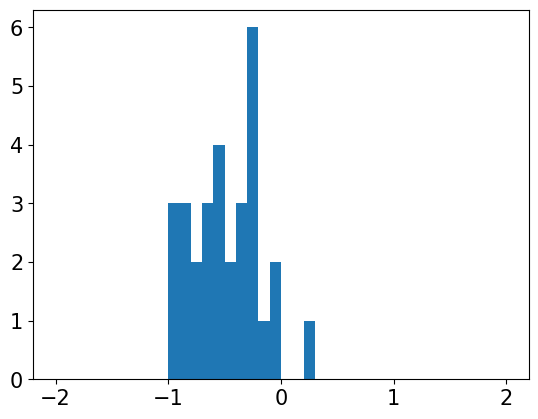

In [93]:
uperp_diff = [ssp5_uperps_sub_boxmean[k] - hist_uperps_sub_boxmean[k] for k in valid_models_all]
plt.hist(uperp_diff,bins=np.linspace(-2,2,41))
print(np.mean(uperp_diff),np.std(uperp_diff))

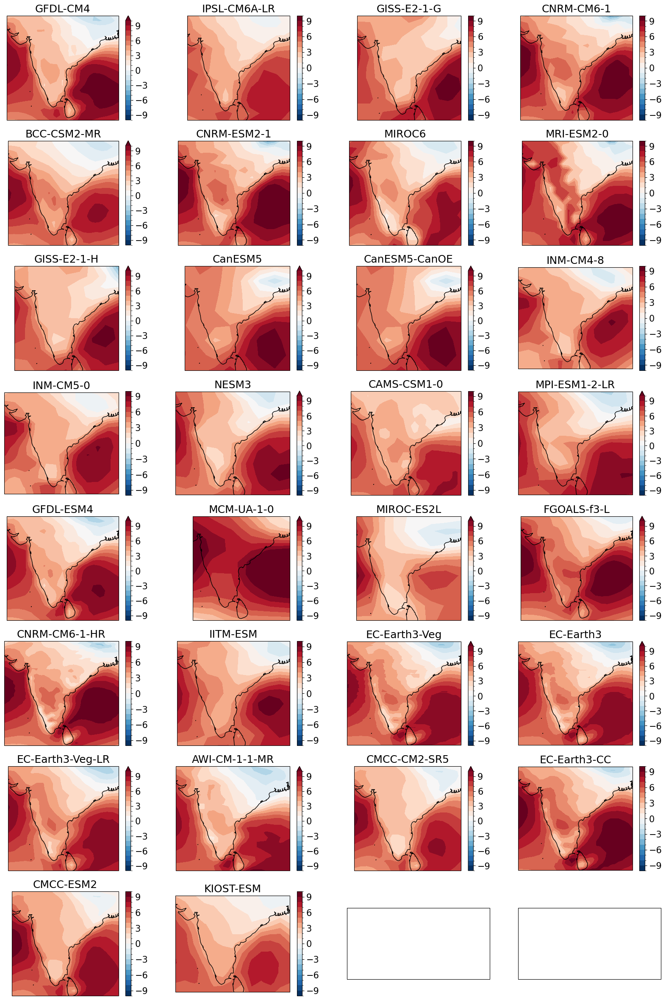

In [94]:
_,axs = plt.subplots(8,4,figsize=(20,30),subplot_kw={'projection':ccrs.PlateCarree()}); axs=axs.reshape(-1)
for i,k in enumerate(valid_models_all):
    crossslopeflow(hist_uvs_sub[k].uas,hist_uvs_sub[k].vas,Ghats.angle).plot.contourf(ax=axs[i],levels=np.linspace(-10,10,21))
    axs[i].coastlines()
    axs[i].set_title(k)

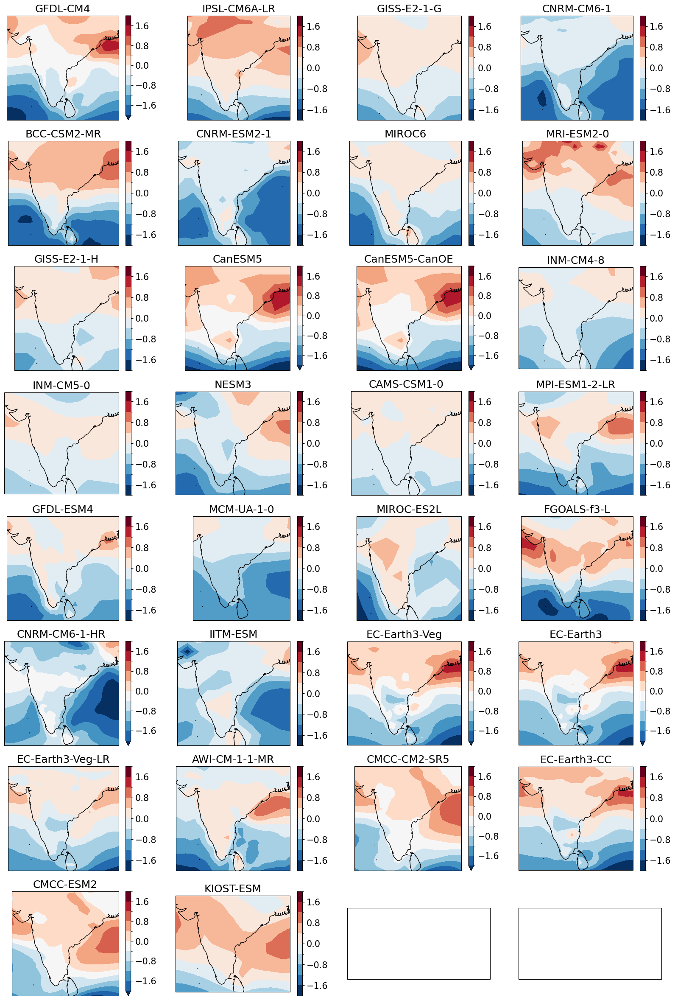

In [95]:
_,axs = plt.subplots(8,4,figsize=(20,30),subplot_kw={'projection':ccrs.PlateCarree()}); axs=axs.reshape(-1)
for i,k in enumerate(valid_models_all):
    diff = crossslopeflow(ssp5_uvs_sub[k].uas,ssp5_uvs_sub[k].vas,Ghats.angle)-crossslopeflow(hist_uvs_sub[k].uas,hist_uvs_sub[k].vas,Ghats.angle)
    diff.plot.contourf(ax=axs[i],levels=np.linspace(-2,2,11))
    axs[i].coastlines()
    axs[i].set_title(k)

In [82]:
%time hist_uperps_sub_boxmean,ssp5_uperps_sub_boxmean,hist_uvs_sub,ssp5_uvs_sub,valid_models_all = get_us(Myanmar, hist_uas, hist_vas, ssp5_uas, ssp5_vas)


/global/common/software/m3310/conda/xrdask.2023.11.qn/lib/python3.9/site-packages/dask/array/core.py:4923: RuntimeWarning: invalid value encountered in scalar divide
  result = function(*args, **kwargs)
/global/common/software/m3310/conda/xrdask.2023.11.qn/lib/python3.9/site-packages/dask/array/core.py:4923: RuntimeWarning: invalid value encountered in scalar divide
  result = function(*args, **kwargs)
/global/common/software/m3310/conda/xrdask.2023.11.qn/lib/python3.9/site-packages/dask/array/core.py:4923: RuntimeWarning: invalid value encountered in scalar divide
  result = function(*args, **kwargs)
/global/common/software/m3310/conda/xrdask.2023.11.qn/lib/python3.9/site-packages/dask/array/core.py:4923: RuntimeWarning: invalid value encountered in scalar divide
  result = function(*args, **kwargs)
/global/common/software/m3310/conda/xrdask.2023.11.qn/lib/python3.9/site-packages/dask/array/core.py:4923: RuntimeWarning: invalid value encountered in scalar divide
  result = function(*a

Hist valid: 30, ssp5 valid: 30, intersection: 30
CPU times: user 1min 51s, sys: 5min 8s, total: 6min 59s
Wall time: 42.8 s


0.14605735223385938 0.6291282217418214


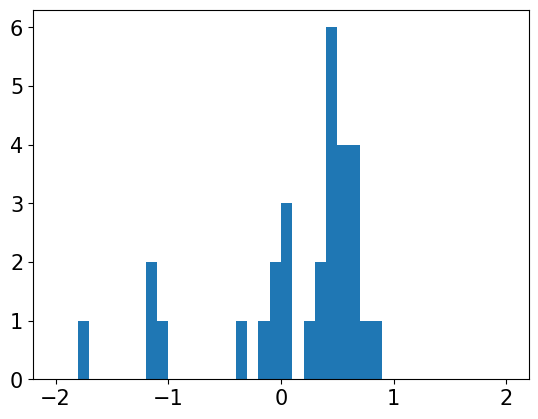

In [83]:
uperp_diff = [ssp5_uperps_sub_boxmean[k] - hist_uperps_sub_boxmean[k] for k in valid_models_all]
plt.hist(uperp_diff,bins=np.linspace(-2,2,41))
print(np.mean(uperp_diff),np.std(uperp_diff))

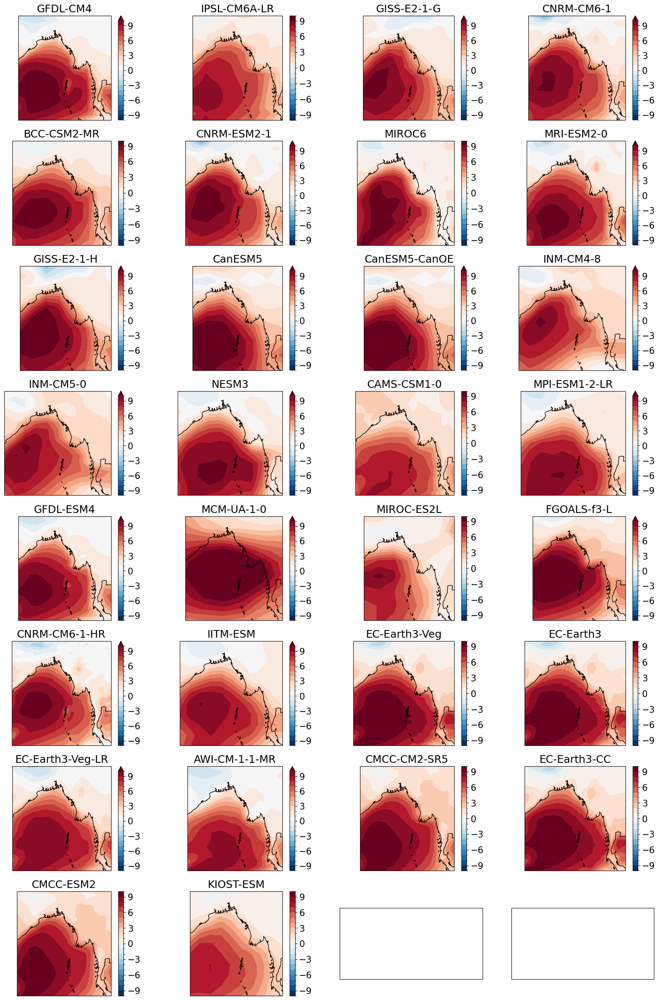

In [86]:
_,axs = plt.subplots(8,4,figsize=(20,30),subplot_kw={'projection':ccrs.PlateCarree()}); axs=axs.reshape(-1)
for i,k in enumerate(valid_models_all):
    crossslopeflow(hist_uvs_sub[k].uas,hist_uvs_sub[k].vas,Myanmar.angle).plot.contourf(ax=axs[i],levels=np.linspace(-10,10,21))
    axs[i].coastlines()
    axs[i].set_title(k)

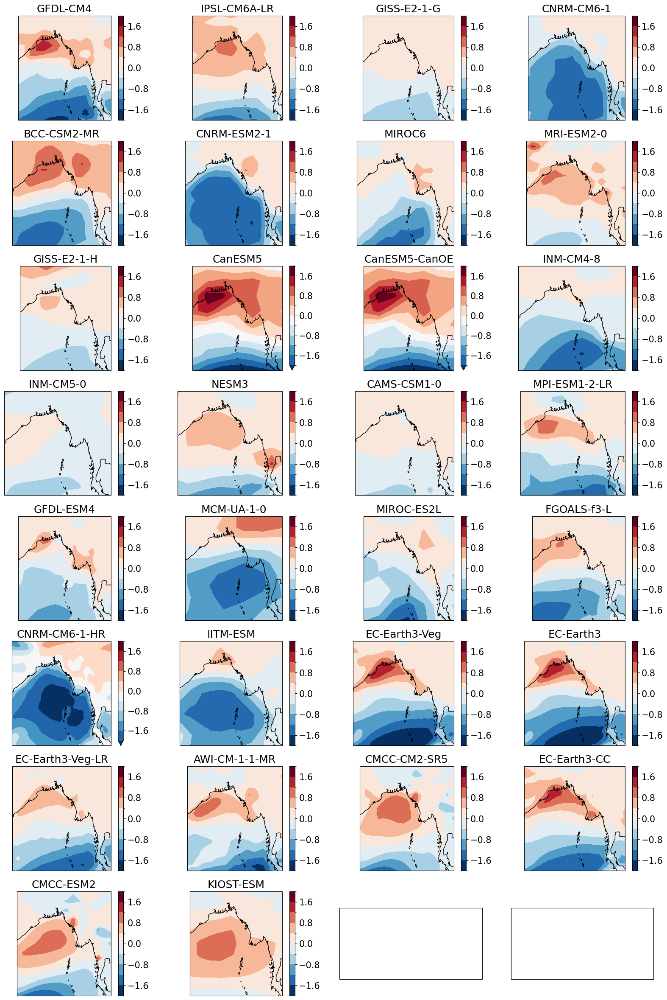

In [87]:
_,axs = plt.subplots(8,4,figsize=(20,30),subplot_kw={'projection':ccrs.PlateCarree()}); axs=axs.reshape(-1)
for i,k in enumerate(valid_models_all):
    diff = crossslopeflow(ssp5_uvs_sub[k].uas,ssp5_uvs_sub[k].vas,Myanmar.angle)-crossslopeflow(hist_uvs_sub[k].uas,hist_uvs_sub[k].vas,Myanmar.angle)
    diff.plot.contourf(ax=axs[i],levels=np.linspace(-2,2,11))
    axs[i].coastlines()
    axs[i].set_title(k)

In [88]:
%time hist_uperps_sub_boxmean,ssp5_uperps_sub_boxmean,hist_uvs_sub,ssp5_uvs_sub,valid_models_all = get_us(Vietnam, hist_uas, hist_vas, ssp5_uas, ssp5_vas)


/global/common/software/m3310/conda/xrdask.2023.11.qn/lib/python3.9/site-packages/dask/array/core.py:4923: RuntimeWarning: invalid value encountered in scalar divide
  result = function(*args, **kwargs)
/global/common/software/m3310/conda/xrdask.2023.11.qn/lib/python3.9/site-packages/dask/array/core.py:4923: RuntimeWarning: invalid value encountered in scalar divide
  result = function(*args, **kwargs)
/global/common/software/m3310/conda/xrdask.2023.11.qn/lib/python3.9/site-packages/dask/array/core.py:4923: RuntimeWarning: invalid value encountered in scalar divide
  result = function(*args, **kwargs)
/global/common/software/m3310/conda/xrdask.2023.11.qn/lib/python3.9/site-packages/dask/array/core.py:4923: RuntimeWarning: invalid value encountered in scalar divide
  result = function(*args, **kwargs)
/global/common/software/m3310/conda/xrdask.2023.11.qn/lib/python3.9/site-packages/dask/array/core.py:4923: RuntimeWarning: invalid value encountered in scalar divide
  result = function(*a

Hist valid: 30, ssp5 valid: 30, intersection: 30
CPU times: user 1min 48s, sys: 5min 2s, total: 6min 51s
Wall time: 42.1 s


-0.024835777846848175 0.3037266206731056


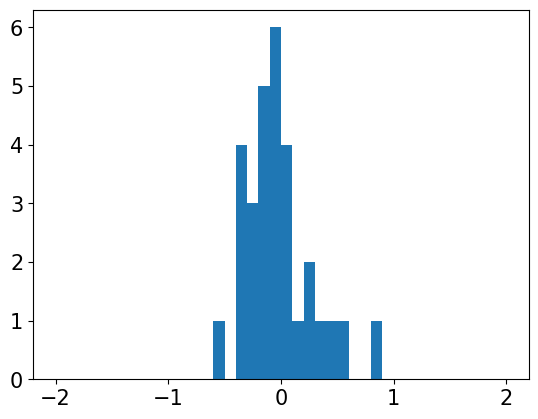

In [89]:
uperp_diff = [ssp5_uperps_sub_boxmean[k] - hist_uperps_sub_boxmean[k] for k in valid_models_all]
plt.hist(uperp_diff,bins=np.linspace(-2,2,41));
print(np.mean(uperp_diff),np.std(uperp_diff))

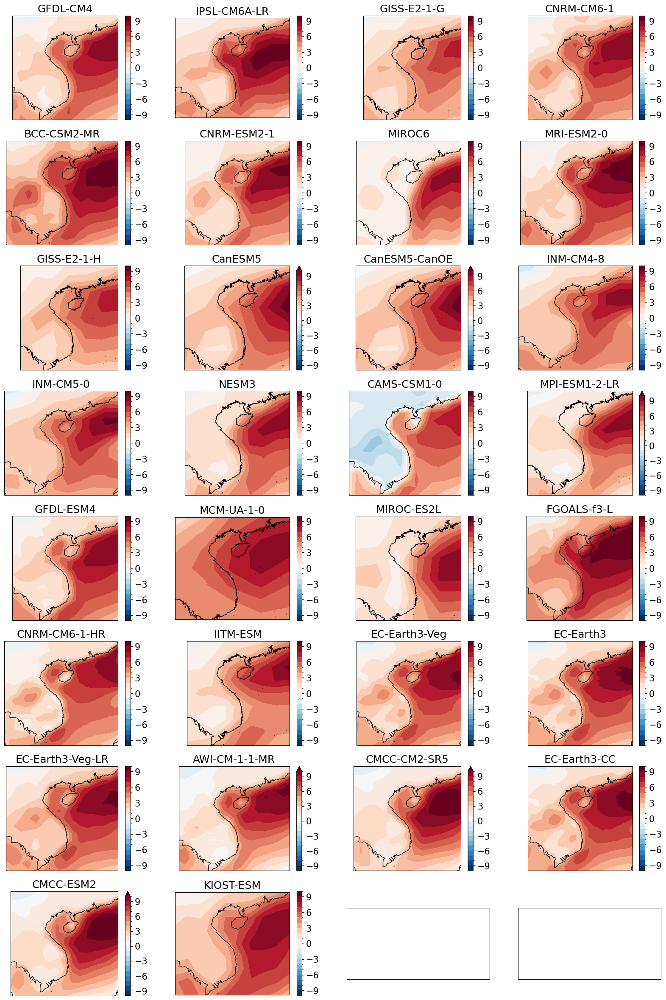

In [90]:
_,axs = plt.subplots(8,4,figsize=(20,30),subplot_kw={'projection':ccrs.PlateCarree()}); axs=axs.reshape(-1)
for i,k in enumerate(valid_models_all):
    crossslopeflow(hist_uvs_sub[k].uas,hist_uvs_sub[k].vas,Vietnam.angle).plot.contourf(ax=axs[i],levels=np.linspace(-10,10,21))
    axs[i].coastlines()
    axs[i].set_title(k)

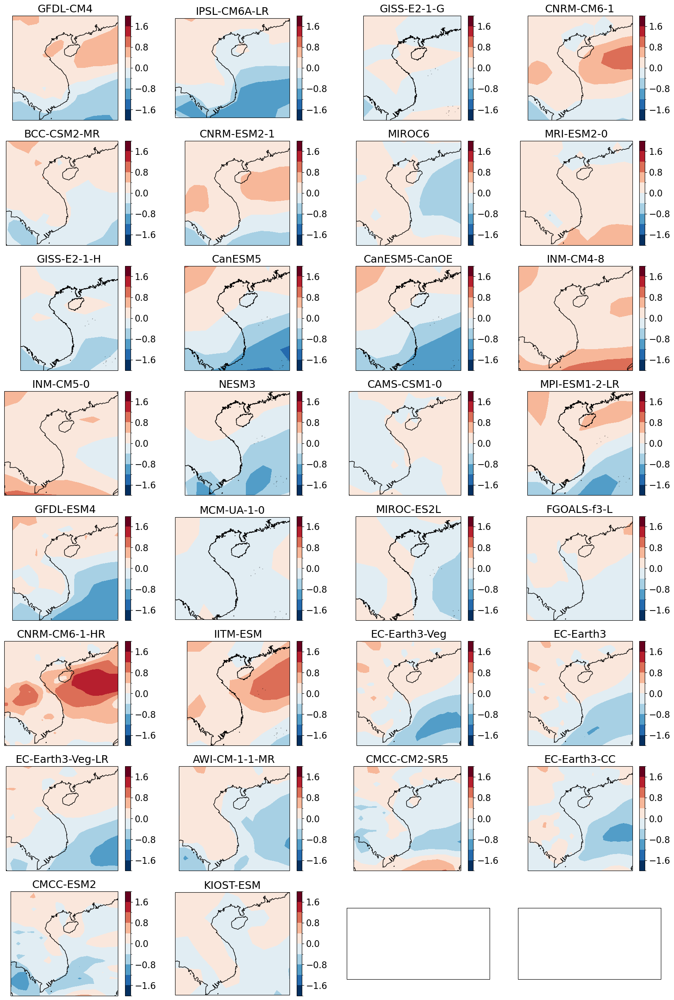

In [91]:
_,axs = plt.subplots(8,4,figsize=(20,30),subplot_kw={'projection':ccrs.PlateCarree()}); axs=axs.reshape(-1)
for i,k in enumerate(valid_models_all):
    diff = crossslopeflow(ssp5_uvs_sub[k].uas,ssp5_uvs_sub[k].vas,Vietnam.angle)-crossslopeflow(hist_uvs_sub[k].uas,hist_uvs_sub[k].vas,Vietnam.angle)
    diff.plot.contourf(ax=axs[i],levels=np.linspace(-2,2,11))
    axs[i].coastlines()
    axs[i].set_title(k)

### 2040-2059

In [101]:
ssp5_2040_uas = {}
ssp5_2040_vas = {}

In [102]:
for source_id in source_ids:
    institution_id = df_uas_hist_itsct[df_uas_hist_itsct['source_id']==source_id].iloc[0]['institution_id']
    ssp5_2040_uas[source_id] = standardize(xr.open_zarr('/pscratch/sd/q/qnicolas/cmipData/ScenarioMIP.ssp585.%s.%s.Amon.uas.2040-2059.zarr'%(institution_id,source_id)).uas)
    ssp5_2040_vas[source_id] = standardize(xr.open_zarr('/pscratch/sd/q/qnicolas/cmipData/ScenarioMIP.ssp585.%s.%s.Amon.vas.2040-2059.zarr'%(institution_id,source_id)).vas)
    

In [103]:
%time hist_uperps_sub_boxmean,ssp5_2040_uperps_sub_boxmean,hist_uvs_sub,ssp5_2040_uvs_sub,valid_models_all = get_us(Ghats, hist_uas, hist_vas, ssp5_2040_uas, ssp5_2040_vas)


/global/common/software/m3310/conda/xrdask.2023.11.qn/lib/python3.9/site-packages/dask/array/core.py:4923: RuntimeWarning: invalid value encountered in scalar divide
  result = function(*args, **kwargs)
/global/common/software/m3310/conda/xrdask.2023.11.qn/lib/python3.9/site-packages/dask/array/core.py:4923: RuntimeWarning: invalid value encountered in scalar divide
  result = function(*args, **kwargs)
/global/common/software/m3310/conda/xrdask.2023.11.qn/lib/python3.9/site-packages/dask/array/core.py:4923: RuntimeWarning: invalid value encountered in scalar divide
  result = function(*args, **kwargs)
/global/common/software/m3310/conda/xrdask.2023.11.qn/lib/python3.9/site-packages/dask/array/core.py:4923: RuntimeWarning: invalid value encountered in scalar divide
  result = function(*args, **kwargs)
/global/common/software/m3310/conda/xrdask.2023.11.qn/lib/python3.9/site-packages/dask/array/core.py:4923: RuntimeWarning: invalid value encountered in scalar divide
  result = function(*a

Hist valid: 30, ssp5 valid: 30, intersection: 30
CPU times: user 1min 52s, sys: 4min 13s, total: 6min 6s
Wall time: 44.7 s


-0.21258855318449635 0.20398153369751781


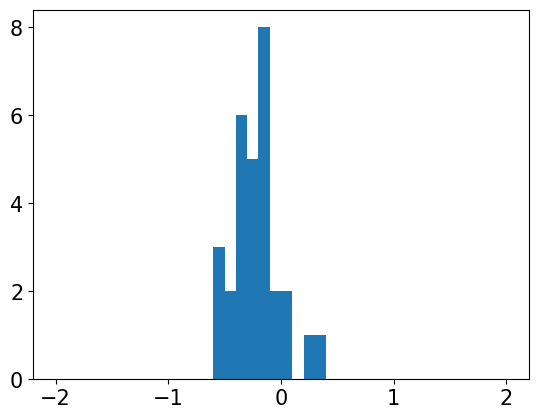

In [104]:
uperp_diff = [ssp5_2040_uperps_sub_boxmean[k] - hist_uperps_sub_boxmean[k] for k in valid_models_all]
plt.hist(uperp_diff,bins=np.linspace(-2,2,41))
print(np.mean(uperp_diff),np.std(uperp_diff))

-0.4842628358572872 0.3009698468283821


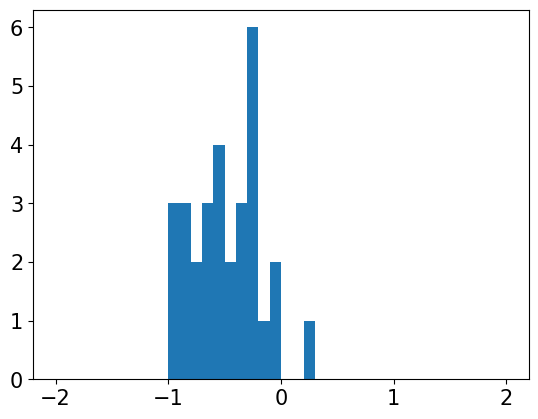

In [93]:
uperp_diff = [ssp5_2040_uperps_sub_boxmean[k] - hist_uperps_sub_boxmean[k] for k in valid_models_all]
plt.hist(uperp_diff,bins=np.linspace(-2,2,41))
print(np.mean(uperp_diff),np.std(uperp_diff))

### ssp2

In [5]:
hist_uas = {}
hist_vas = {}
ssp2_uas = {}
ssp2_vas = {}

In [6]:
for source_id in source_ids:
    institution_id = df_uas_hist_itsct[df_uas_hist_itsct['source_id']==source_id].iloc[0]['institution_id']
    hist_uas[source_id] = standardize(xr.open_zarr('/pscratch/sd/q/qnicolas/cmipData/CMIP.historical.%s.%s.Amon.uas.1980-1999.zarr'%(institution_id,source_id)).uas)
    hist_vas[source_id] = standardize(xr.open_zarr('/pscratch/sd/q/qnicolas/cmipData/CMIP.historical.%s.%s.Amon.vas.1980-1999.zarr'%(institution_id,source_id)).vas)
    ssp2_uas[source_id] = standardize(xr.open_zarr('/pscratch/sd/q/qnicolas/cmipData/ScenarioMIP.ssp245.%s.%s.Amon.uas.2020-2099.zarr'%(institution_id,source_id)).uas)
    ssp2_vas[source_id] = standardize(xr.open_zarr('/pscratch/sd/q/qnicolas/cmipData/ScenarioMIP.ssp245.%s.%s.Amon.vas.2020-2099.zarr'%(institution_id,source_id)).vas)

In [10]:
%time hist_uperps_sub_boxmean,ssp2_2040_uperps_sub_boxmean,_,_,valid_models_all = get_us(Ghats, hist_uas, hist_vas, {k:v.sel(time=slice("2040-01-01","2059-12-30")) for k,v in ssp2_uas.items()}, {k:v.sel(time=slice("2040-01-01","2059-12-30")) for k,v in ssp2_vas.items()})


/global/common/software/m3310/conda/xrdask.2024.03.qn/lib/python3.11/site-packages/dask/array/core.py:4923: RuntimeWarning: invalid value encountered in scalar divide
  result = function(*args, **kwargs)
/global/common/software/m3310/conda/xrdask.2024.03.qn/lib/python3.11/site-packages/dask/array/core.py:4923: RuntimeWarning: invalid value encountered in scalar divide
  result = function(*args, **kwargs)
/global/common/software/m3310/conda/xrdask.2024.03.qn/lib/python3.11/site-packages/dask/array/core.py:4923: RuntimeWarning: invalid value encountered in scalar divide
  result = function(*args, **kwargs)
/global/common/software/m3310/conda/xrdask.2024.03.qn/lib/python3.11/site-packages/dask/array/core.py:4923: RuntimeWarning: invalid value encountered in scalar divide
  result = function(*args, **kwargs)


Hist valid: 29, ssp5 valid: 29, intersection: 29
CPU times: user 34 s, sys: 7.26 s, total: 41.2 s
Wall time: 2min 19s


-0.15774235459460365 0.15757415857637866


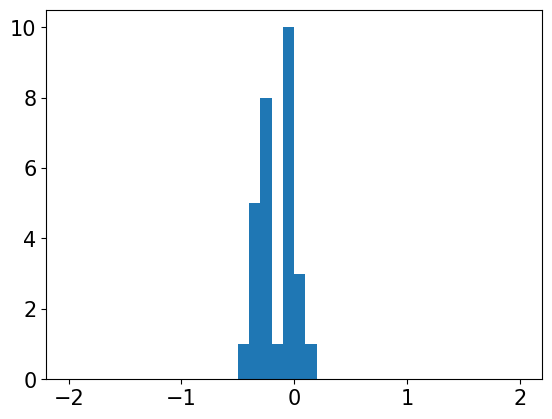

In [11]:
uperp_diff = [ssp2_2040_uperps_sub_boxmean[k] - hist_uperps_sub_boxmean[k] for k in valid_models_all]
plt.hist(uperp_diff,bins=np.linspace(-2,2,41))
print(np.mean(uperp_diff),np.std(uperp_diff))

In [12]:
%time hist_uperps_sub_boxmean,ssp2_2060_uperps_sub_boxmean,_,_,valid_models_all = get_us(Ghats, hist_uas, hist_vas, {k:v.sel(time=slice("2060-01-01","2079-12-30")) for k,v in ssp2_uas.items()}, {k:v.sel(time=slice("2060-01-01","2079-12-30")) for k,v in ssp2_vas.items()})


Hist valid: 29, ssp5 valid: 29, intersection: 29
CPU times: user 36.9 s, sys: 7.22 s, total: 44.1 s
Wall time: 2min 28s


-0.19086318364435215 0.19107670323616663


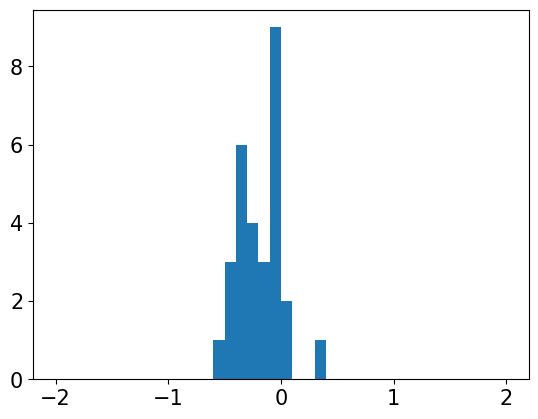

In [13]:
uperp_diff = [ssp2_2060_uperps_sub_boxmean[k] - hist_uperps_sub_boxmean[k] for k in valid_models_all]
plt.hist(uperp_diff,bins=np.linspace(-2,2,41))
print(np.mean(uperp_diff),np.std(uperp_diff))

In [14]:
%time hist_uperps_sub_boxmean,ssp2_2080_uperps_sub_boxmean,_,_,valid_models_all = get_us(Ghats, hist_uas, hist_vas, {k:v.sel(time=slice("2080-01-01","2099-12-30")) for k,v in ssp2_uas.items()}, {k:v.sel(time=slice("2080-01-01","2099-12-30")) for k,v in ssp2_vas.items()})


/global/common/software/m3310/conda/xrdask.2024.03.qn/lib/python3.11/site-packages/dask/array/core.py:4923: RuntimeWarning: invalid value encountered in scalar divide
  result = function(*args, **kwargs)


Hist valid: 29, ssp5 valid: 29, intersection: 29
CPU times: user 37.3 s, sys: 7.66 s, total: 45 s
Wall time: 2min 27s


-0.20234338124468965 0.1978358257416348


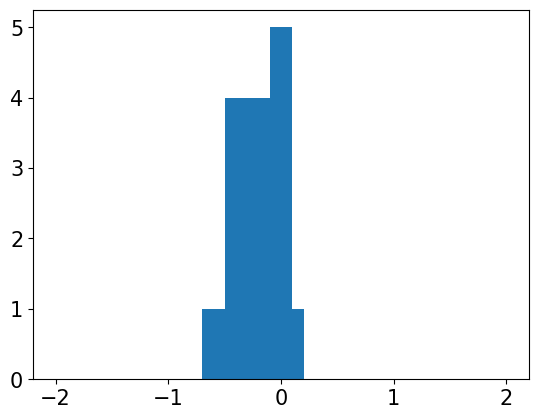

In [15]:
uperp_diff = [ssp2_2080_uperps_sub_boxmean[k] - hist_uperps_sub_boxmean[k] for k in valid_models_all]
plt.hist(uperp_diff,bins=np.linspace(-2,2,41))
print(np.mean(uperp_diff),np.std(uperp_diff))

# Older stuff

## change in $\theta_{eB}$

In [8]:
def cumtrapz(A, dim):
    """Cumulative Simpson's rule (aka Tai's method)

    Notes
    -----
    Simpson rule is given by
        int f (x) = sum (f_i+f_i+1) dx / 2
    """
    x = A[dim]
    dx = x - x.shift(**{dim:1})
    dx = dx.fillna(0.0)
    return ((A.shift(**{dim:1}) + A)*dx/2.0)\
          .fillna(0.0)\
          .cumsum(dim)
def upstream_mean(ds):
    return ds.sel(distance_from_mtn=slice(-2500,-4000)).mean('distance_from_mtn')
def integ_dx(integrand):
    integrand = integrand.reindex(distance_from_mtn=list(reversed(integrand.distance_from_mtn)))
    integrand = integrand.sel(pressure=925.)
    return prime(cumtrapz(integrand,'distance_from_mtn') * 1e3,True)
for Sim in (W10S300,W12S300):
    # Calculate Q_q diagnostically
    Sim.THETAE_MEAN = xr.open_dataarray(Sim.path+'wrf.THETAE.ALLMEAN.nc')
    Sim.U_PL_MEAN = xr.open_dataarray(Sim.path+'wrf.U_PL.ALLMEAN.nc')
    Sim.OMEGA_PL_MEAN = -Sim.T_PL_MEAN.pressure*100/(287. * Sim.T_PL_MEAN) * 9.81 * Sim.W_PL_MEAN
    udthetaedx = -(Sim.U_PL_MEAN*Sim.THETAE_MEAN.differentiate('distance_from_mtn')/1000 * 86400)
    omegadthetaedp = (Sim.OMEGA_PL_MEAN*Sim.THETAE_MEAN.differentiate('pressure')/100 * 86400)
    Qthetae = udthetaedx+omegadthetaedp
    Sim.OMEGADTHETAEDP = omegadthetaedp
    Sim.OMEGADTHETAE0DP = (Sim.OMEGA_PL_MEAN*upstream_mean(Sim.THETAE_MEAN).differentiate('pressure')/100 * 86400)
    Sim.QTHETAE = Qthetae
    

(-1100.0, 1100.0)

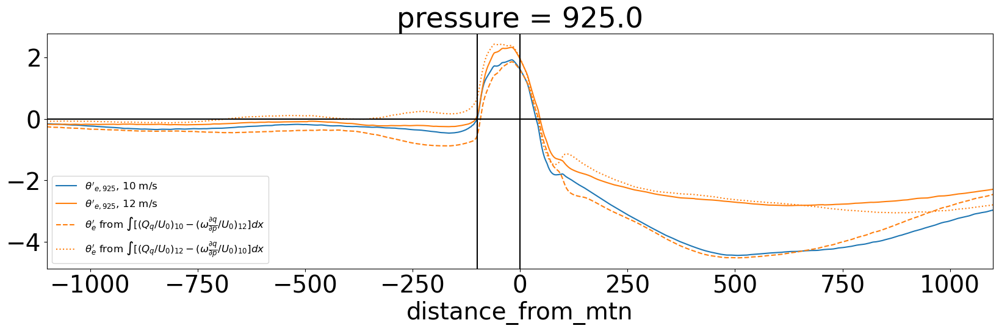

In [106]:
_,ax = plt.subplots(1,1,figsize=(20,5))
(prime(W10S300.THETAE_MEAN.sel(pressure=925))).plot(ax=ax,label = r"$\theta'_{e,925}$, 10 m/s")
(prime(W12S300.THETAE_MEAN.sel(pressure=925))).plot(ax=ax,label = r"$\theta'_{e,925}$, 12 m/s")

integrand = (W10S300.QTHETAE/(-W10S300.U_PL_MEAN)- W12S300.OMEGADTHETAEDP/(-W12S300.U_PL_MEAN))/86400
integ_dx(integrand).plot(ax=ax,color='C1',linestyle='--',label = r"$\theta_e'$ from $\int [(Q_q/U_0)_{10} - (\omega \frac{\partial q}{\partial p} / U_0)_{12}] dx$")

integrand = (W12S300.QTHETAE/(-W12S300.U_PL_MEAN)- W10S300.OMEGADTHETAEDP/(-W10S300.U_PL_MEAN))/86400
integ_dx(integrand).plot(ax=ax,color='C1',linestyle=':',label = r"$\theta_e'$ from $\int [(Q_q/U_0)_{12} - (\omega \frac{\partial q}{\partial p} / U_0)_{10}] dx$")

ax.legend(fontsize=12)
ax.axhline(0.,color='k')
ax.axvline(-100.,color='k')
ax.axvline(0.,color='k')
ax.set_xlim(-1100,1100)

(-1100.0, 1100.0)

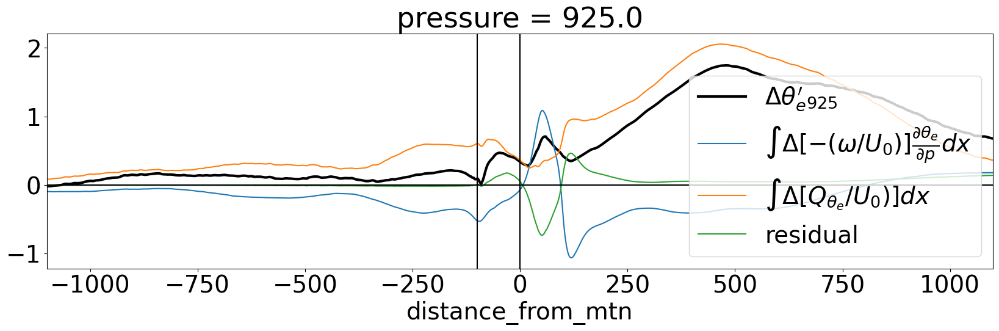

In [105]:
_,ax = plt.subplots(1,1,figsize=(20,5))
Delta0 = (prime(W12S300.THETAE_MEAN.sel(pressure=925)) - prime(W10S300 .THETAE_MEAN.sel(pressure=925)))
Delta0.plot(ax=ax,label = r"$\Delta \theta_e'_{925}$",color='k',linewidth=3)



dthetae0dp = upstream_mean(W10S300.THETAE_MEAN.differentiate('pressure'))/100
integrand = (- W10S300.OMEGA_PL_MEAN * dthetae0dp)/10
qprime10 = integ_dx(integrand)
integrand = (- W12S300.OMEGA_PL_MEAN * dthetae0dp)/12
qprime12 = integ_dx(integrand)
Delta1 = (qprime12-qprime10)
Delta1.plot(ax=ax,label = r"$\int \Delta[ - (\omega / U_0)] \frac{\partial \theta_e}{\partial p} dx$")

integrand = (W10S300.QTHETAE/86400)/10
qprime10 = integ_dx(integrand)
integrand = (W12S300.QTHETAE/86400)/12
qprime12 = integ_dx(integrand)
Delta2 = (qprime12-qprime10)
Delta2.plot(ax=ax,label = r"$\int \Delta[ Q_{\theta_e} / U_0)] dx$")

(Delta0 - Delta1 -Delta2).plot(ax=ax,label = r"residual")
#Sim = W10S300
#integrand = (Sim.QTHETAE- Sim.OMEGADTHETAEDP*0)/86400/10
#qprime10 = integ_dx(integrand)
#Sim = W12S300
#integrand = (Sim.QTHETAE- Sim.OMEGADTHETAEDP*0)/86400/12
#qprime12 = integ_dx(integrand)
#
#(qprime12-qprime10).plot(ax=ax,label = r"$\Delta \theta_e'$ from $\int [ (Q_{\theta_e} / U_0)] dx$")
#
#
#
#integrand = (W10S300.QTHETAE- Sim.OMEGADTHETAEDP*0)/86400/10
#qprime10 = integ_dx(integrand)
#integrand = (W10S300.QTHETAE- Sim.OMEGADTHETAEDP*0)/86400/12
#qprime12 = integ_dx(integrand)
#
#(qprime12-qprime10).plot(ax=ax,label = r"$\Delta \theta_e'$ from $\int [ (Q_{\theta_e,fixed} / U_0)] dx$",color='C3',linestyle='--')





ax.legend()
ax.axhline(0.,color='k')
ax.axvline(-100.,color='k')
ax.axvline(0.,color='k')
ax.set_xlim(-1100,1100)

(-1100.0, 1100.0)

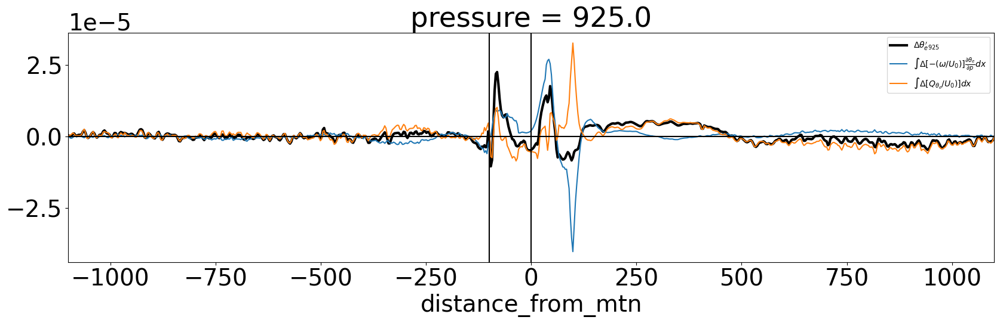

In [111]:
_,ax = plt.subplots(1,1,figsize=(20,5))
Delta0 = (W12S300.THETAE_MEAN.sel(pressure=925).differentiate('distance_from_mtn')/1e3 
         -W10S300.THETAE_MEAN.sel(pressure=925).differentiate('distance_from_mtn')/1e3
         )
Delta0.plot(ax=ax,label = r"$\Delta \theta_e'_{925}$",color='k',linewidth=3)


integrand10 = (- W10S300.OMEGADTHETAEDP/86400)/10
integrand12 = (- W12S300.OMEGADTHETAEDP/86400)/12
Delta1 = (integrand12-integrand10).sel(pressure=925)
Delta1.plot(ax=ax,label = r"$\int \Delta[ - (\omega / U_0)] \frac{\partial \theta_e}{\partial p} dx$")

integrand10 = (W10S300.QTHETAE/86400)/10
integrand12 = (W12S300.QTHETAE/86400)/12
Delta2 = (integrand12-integrand10).sel(pressure=925)
Delta2.plot(ax=ax,label = r"$\int \Delta[ Q_{\theta_e} / U_0)] dx$")


ax.legend(fontsize=10)
ax.axhline(0.,color='k')
ax.axvline(-100.,color='k')
ax.axvline(0.,color='k')
ax.set_xlim(-1100,1100)

(-1100.0, 1100.0)

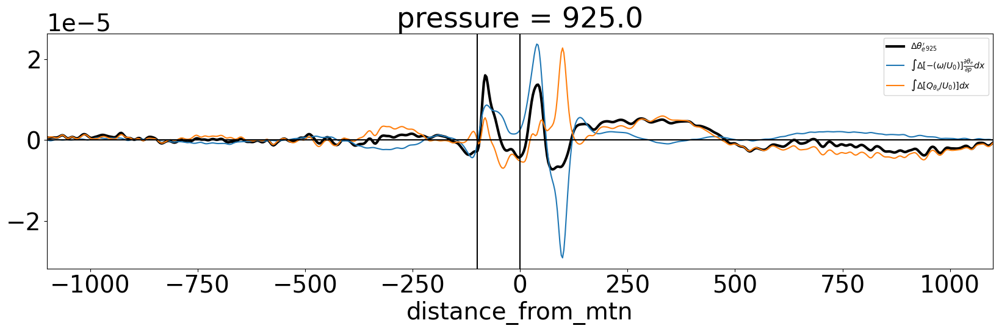

In [119]:
from scipy.ndimage import gaussian_filter
def smooth(ds):
    return xr.apply_ufunc(gaussian_filter,ds,kwargs={"sigma":2.})

_,ax = plt.subplots(1,1,figsize=(20,5))
Delta0 = (W12S300.THETAE_MEAN.sel(pressure=925).differentiate('distance_from_mtn')/1e3 
         -W10S300.THETAE_MEAN.sel(pressure=925).differentiate('distance_from_mtn')/1e3
         )
smooth(Delta0).plot(ax=ax,label = r"$\Delta \theta_e'_{925}$",color='k',linewidth=3)


integrand10 = (- W10S300.OMEGADTHETAEDP/86400)/10
integrand12 = (- W12S300.OMEGADTHETAEDP/86400)/12
Delta1 = (integrand12-integrand10).sel(pressure=925)
smooth(Delta1).plot(ax=ax,label = r"$\int \Delta[ - (\omega / U_0)] \frac{\partial \theta_e}{\partial p} dx$")

integrand10 = (W10S300.QTHETAE/86400)/10
integrand12 = (W12S300.QTHETAE/86400)/12
Delta2 = (integrand12-integrand10).sel(pressure=925)
smooth(Delta2).plot(ax=ax,label = r"$\int \Delta[ Q_{\theta_e} / U_0)] dx$")


#dthetae0dp = upstream_mean(W10S300.THETAE_MEAN.differentiate('pressure'))/100
#dpdz = 9.81 * W10S300.T_PL_MEAN.pressure*100/287./upstream_mean(W10S300.T_PL_MEAN)
#dthetae0dz = dthetae0dp * dpdz
#((w_linear_12/12-w_linear_10/10).sel(pressure=925,method='nearest')*dthetae0dz.sel(pressure=925)).plot(label = r"lin.theory")


ax.legend(fontsize=10)
ax.axhline(0.,color='k')
ax.axvline(-100.,color='k')
ax.axvline(0.,color='k')
ax.set_xlim(-1100,1100)

In [9]:
from orographicPrecipitation.observationsAndERA5.linearWaveModels import second_derivative_matrix, linear_w_1layer,linear_w_generalized, linear_w_generalized_forced, w_to_Tprime,w_to_qprime,z_to_p_standard
from orographicConvectionTheory.orographicConvectionTheory import topographic_profile,k_vector

z=np.linspace(0,20e3,200)
xx ,hx = topographic_profile('cos',A=500)
xx = xx[1000:3001]
hx = hx[1000:3001]
w_linear_10 = linear_w_1layer(xx,hx,z,10,0.01)
w_linear_12 = linear_w_1layer(xx,hx,z,12,0.01)

p = z_to_p_standard(w_linear_10.altitude*1000)
w_linear_10 = w_linear_10.assign_coords({'pressure':p}).swap_dims({'altitude':'pressure'})
w_linear_12 = w_linear_12.assign_coords({'pressure':p}).swap_dims({'altitude':'pressure'})

In [21]:
from scipy.signal import hilbert
from scipy.integrate import cumtrapz
import scipy.linalg as spl
def nonlinear_mountain_wave(x,h,z,U,N):
    z2=np.array(z).transpose()[::-1]
    f_L = -np.imag(hilbert(h))
    l=N/U
    H = h+1.j*f_L
    niter=20
    for i in range(niter):
        H = -1j*np.exp(-1j*l*h)*(np.imag(hilbert(np.real(H*np.exp(1j*l*h))))+1j*np.imag(hilbert(np.imag(H*np.exp(1j*l*h)))))
    f=np.imag(H)
    delta = h[:,None]*np.cos(l*(z[None,:]-h[:,None]))+f[:,None]*np.sin(l*(z[None,:]-h[:,None]))
    w=U*np.gradient(delta,x,axis=0)
    # displacement: xr.DataArray(z[None,:]-delta,coords={'x':x,'z':z},dims={'x':x,'z':z})
    return xr.DataArray(w,coords={'distance_from_mtn':x/1000,'altitude':z/1000},dims=['distance_from_mtn','altitude'])

w_nonlinear_8=nonlinear_mountain_wave(xx,hx,z,8.,1e-2)
w_nonlinear_10=nonlinear_mountain_wave(xx,hx,z,10.,1e-2)
w_nonlinear_12=nonlinear_mountain_wave(xx,hx,z,12.,1e-2)
p = z_to_p_standard(w_nonlinear_10.altitude*1000)
w_nonlinear_8 = w_nonlinear_8.assign_coords({'pressure':p}).swap_dims({'altitude':'pressure'})
w_nonlinear_10 = w_nonlinear_10.assign_coords({'pressure':p}).swap_dims({'altitude':'pressure'})
w_nonlinear_12 = w_nonlinear_12.assign_coords({'pressure':p}).swap_dims({'altitude':'pressure'})

(-1100.0, 1100.0)

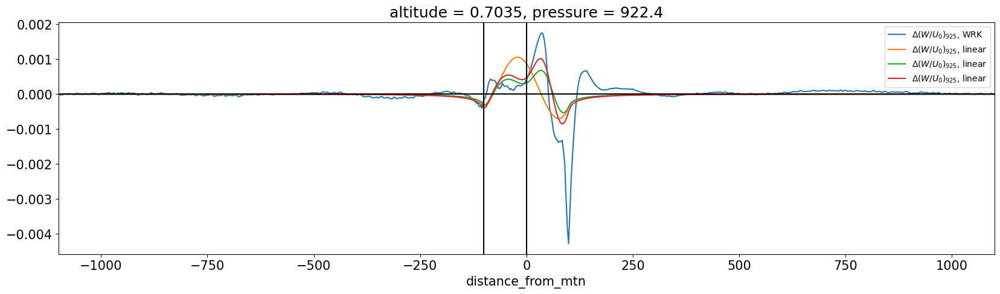

In [22]:
_,ax = plt.subplots(1,1,figsize=(20,5))

(W12S300.W_PL_MEAN/12 - W10S300.W_PL_MEAN/10).sel(pressure=925).plot(ax=ax,label=r"$\Delta(W/U_0)_{925}$, WRK")
(w_linear_12/12 - w_linear_10/10).sel(pressure=925.,method='nearest').plot(ax=ax,label=r"$\Delta(W/U_0)_{925}$, linear")
(w_nonlinear_12/12 - w_nonlinear_10/10).sel(pressure=925.,method='nearest').plot(ax=ax,label=r"$\Delta(W/U_0)_{925}$, linear")
(w_nonlinear_10/10 - w_nonlinear_8/8).sel(pressure=925.,method='nearest').plot(ax=ax,label=r"$\Delta(W/U_0)_{925}$, linear")

ax.legend(fontsize=10)
ax.axhline(0.,color='k')
ax.axvline(-100.,color='k')
ax.axvline(0.,color='k')
ax.set_xlim(-1100,1100)

(-1100.0, 1100.0)

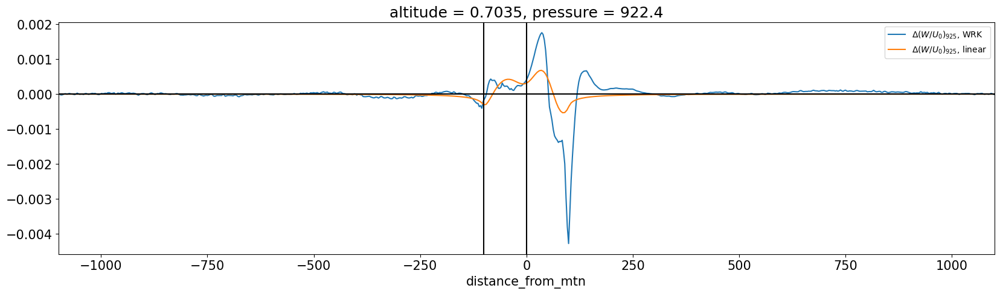

In [23]:
_,ax = plt.subplots(1,1,figsize=(20,5))

(W12S300.W_PL_MEAN/12 - W10S300.W_PL_MEAN/10).sel(pressure=925).plot(ax=ax,label=r"$\Delta(W/U_0)_{925}$, WRK")
(w_nonlinear_12/12 - w_nonlinear_10/10).sel(pressure=925.,method='nearest').plot(ax=ax,label=r"$\Delta(W/U_0)_{925}$, linear")

ax.legend(fontsize=10)
ax.axhline(0.,color='k')
ax.axvline(-100.,color='k')
ax.axvline(0.,color='k')
ax.set_xlim(-1100,1100)

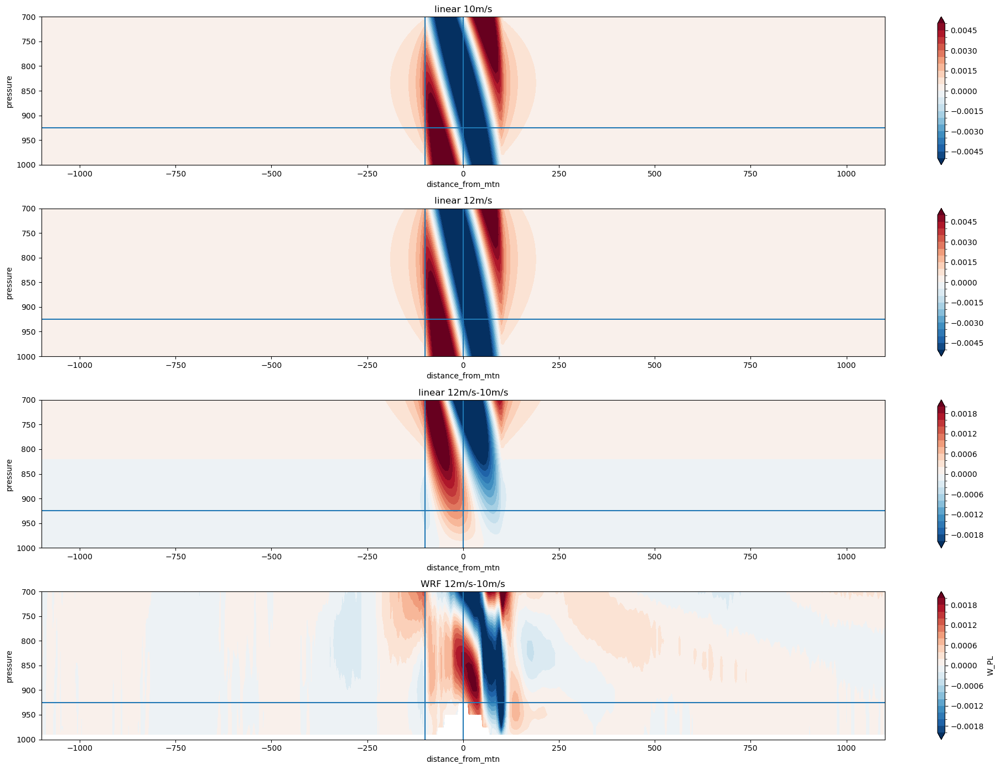

In [114]:
fig,axs = plt.subplots(4,1,figsize=(20,14))

M=0.005
(w_linear_10/10).plot.contourf(ax=axs[0],y='pressure',yincrease=False,levels=np.linspace(-M,M,21),extend='both')
(w_linear_12/12).plot.contourf(ax=axs[1],y='pressure',yincrease=False,levels=np.linspace(-M,M,21),extend='both')
M=0.002
(w_linear_12/12-w_linear_10/10).plot.contourf(ax=axs[2],y='pressure',yincrease=False,levels=np.linspace(-M,M,21),extend='both')
(W12S300n .W_PL_MEAN/12-W10S300n2.W_PL_MEAN/10).plot.contourf(ax=axs[3],y='pressure',yincrease=False,levels=np.linspace(-M,M,21),extend='both')

axs[0].set_title('linear 10m/s')
axs[1].set_title('linear 12m/s')
axs[2].set_title('linear 12m/s-10m/s')
axs[3].set_title('WRF 12m/s-10m/s')
for ax in axs:
    ax.set_xlim(-1100,1100)
    ax.set_ylim(1000,700)
    ax.axhline(925)
    ax.axvline(-100)
    ax.axvline(0)
fig.tight_layout()

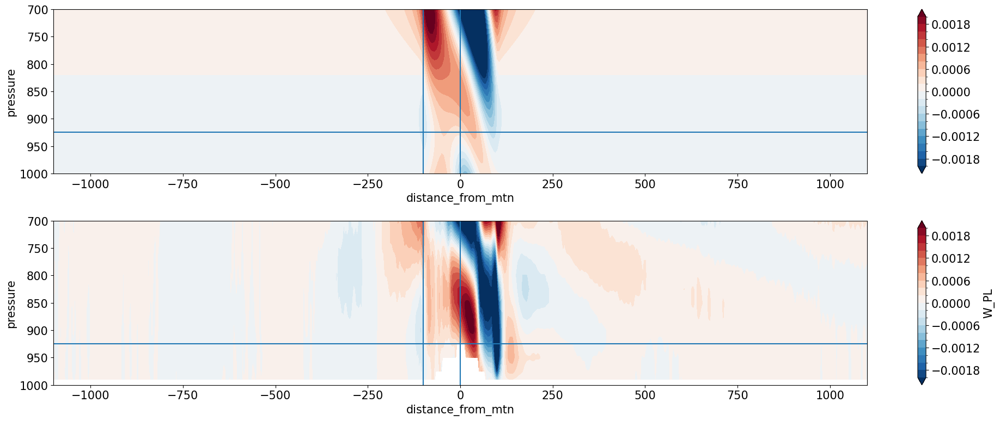

In [25]:
fig,axs = plt.subplots(2,1,figsize=(20,8))

M=0.002
(w_nonlinear_12/12-w_nonlinear_10/10).plot.contourf(ax=axs[0],y='pressure',yincrease=False,levels=np.linspace(-M,M,21),extend='both')
(W12S300 .W_PL_MEAN/12-W10S300.W_PL_MEAN/10).plot.contourf(ax=axs[1],y='pressure',yincrease=False,levels=np.linspace(-M,M,21),extend='both')

for ax in axs:
    ax.set_xlim(-1100,1100)
    ax.set_ylim(1000,700)
    ax.axhline(925)
    ax.axvline(-100)
    ax.axvline(0)
fig.tight_layout()

## W dq/dz vs P'

In [54]:
for Sim in W10S300,W12S300:
    sfcvars = xr.open_zarr(Sim.path + "wrf.SFCVARS.1h.%s.zarr"%Sim.suffix2)
    Sim.U10_MEAN = sfcvars.U10[1200:].mean(('Time','south_north')).load()
    Sim.Q2_MEAN  = sfcvars.Q2[1200:].mean(('Time','south_north')).load()
    
    psfc = xr.open_zarr(Sim.path + "wrf.PSFC_INTERP.1h.%s.zarr"%Sim.suffix2)
    Sim.PSFC_MEAN = psfc.PSFC[-100:].mean(('Time','south_north')).load()

In [16]:
for Sim in W10S300,W12S300:
    Sim.RHO_PL_MEAN = (Sim.T_PL_MEAN.pressure*100./287./Sim.T_PL_MEAN)
    Sim.OMEGA_PL_MEAN = (-Sim.RHO_PL_MEAN*9.81*Sim.W_PL_MEAN)
        

In [91]:
def integrate_wsfc(a,asfc,psfc,pname='pressure',pfact=100):
    valid_idx = np.isnan(a).argmin(dim=pname)
    integ_a = a.fillna(0.).integrate(pname)*pfact

    valid_val = a.isel(pressure=valid_idx)
    valid_p = pfact * a[pname].isel(pressure=valid_idx)
    belowsfc_p = pfact * a[pname].isel(pressure=np.maximum(0,valid_idx-1))
    correction = (valid_idx>0) * valid_val * (valid_p - belowsfc_p) / 2
    
    sfc_term = (asfc + valid_val)/2 * (psfc - valid_p)
    return integ_a - correction + sfc_term

In [106]:
for Sim in W10S300,W12S300:
    Sim.wdqdp = Sim.OMEGA_PL_MEAN*Sim.Q_PL_MEAN.differentiate('pressure')/100 * 86400
    Sim.wdqdp_integ_dumb = Sim.wdqdp.fillna(0.).integrate('pressure')*100/9.81
    
    w_sfc = Sim.U10_MEAN * Sim.PSFC_MEAN.differentiate('distance_from_mtn')/1e3
    
    #constant estimate
    dqdp_sfc = (Sim.Q_PL_MEAN.isel(pressure=0) - Sim.Q2_MEAN)/(100*Sim.Q_PL_MEAN.pressure.isel(pressure=0) - Sim.PSFC_MEAN)
    dqdp_sfc = dqdp_sfc.sel(distance_from_mtn = slice(-2500,-4000)).mean('distance_from_mtn')
    Sim.wdqdp_sfc = w_sfc * dqdp_sfc * 86400
    Sim.wdqdp_integ = integrate_wsfc(Sim.wdqdp, Sim.wdqdp_sfc, Sim.PSFC_MEAN)/9.81


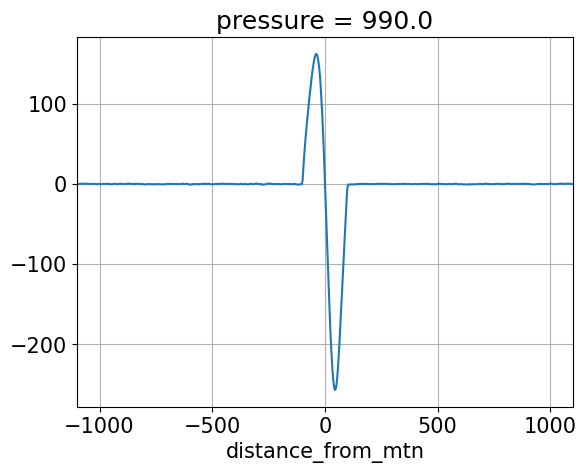

In [104]:
(2.5e3*W10S300.wdqdp_sfc).plot()
plt.xlim(-1100,1100)
plt.grid()

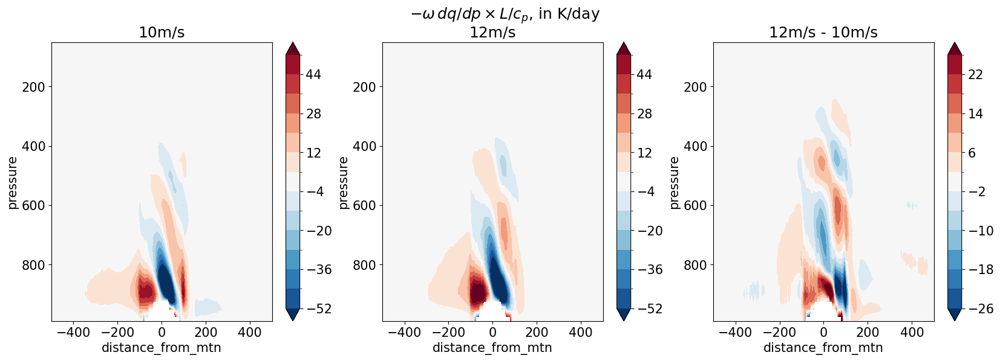

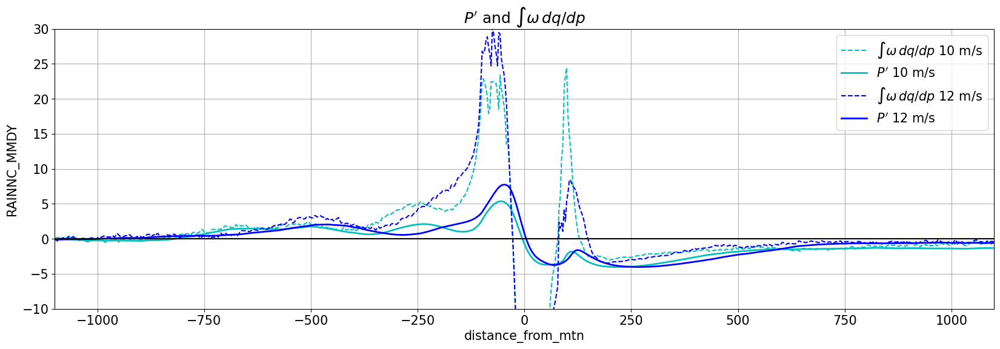

In [108]:
fig,axs=plt.subplots(1,3,figsize=(20,6))
for W,ax,ttl,levs in zip((W10S300.wdqdp,W12S300.wdqdp,W12S300.wdqdp-W10S300.wdqdp),axs,(r'10m/s',r'12m/s',r'12m/s - 10m/s'),(np.arange(-4-8*6,5+8*6,8),np.arange(-4-8*6,5+8*6,8),np.arange(-2-4*6,3+4*6,4))):
    (-2.5e3*W).plot.contourf(ax=ax,y='pressure',yincrease=False,cmap=plt.cm.RdBu_r,levels=levs,extend='both')
    ax.set_xlim(-500,500)
    ax.set_title(ttl)
fig.suptitle(r"$- \omega\,dq/dp \times L/c_p$, in K/day")

_,ax=plt.subplots(1,1,figsize=(20,6))
for Sim,ttl in zip((W10S300,W12S300),(r'10 m/s',r'12 m/s')):
    Sim.wdqdp_integ.plot(ax=ax,color=Sim.color,linestyle='--',label=r'$\int \omega\,dq/dp$ '+ttl)
    #Sim.wdqdp_integ.plot(ax=ax,color=Sim.color,linestyle=':')
    (prime(Sim.RAINNC_MEAN)).plot(ax=ax,color=Sim.color,label=r"$P'$ " + ttl,linewidth=2)
ax.set_xlim(-1100,1100)
ax.set_ylim(-10,30)
ax.grid()
ax.set_title("$P'$ and $\int \omega\,dq/dp$")
ax.legend()
ax.axhline(0.,color='k')